## Julia version 1.6.2

## Code blocks intended to be run independently

# Figure 1B-E

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
h(1,0)

4-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [6]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [7]:
#solve with τ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 445-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658731855330636
   0.6178678412300449
   1.08210261861819
   1.684126310943165
   2.4317786018601573
   3.34578128252542
   4.446307229515896
   5.765151525342025
   7.3470861647998404
   9.261456882988949
  11.618070929491504
   ⋮
 187.9672031342375
 190.03999794557305
 192.9080599208194
 196.63918381898029
 201.59464423824605
 208.01413758737382
 216.52337407060975
 227.97513152798126
 244.3682518224029
 270.40390772927594
 323.1263863026601
 365.0
u: 445-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846703614, 500.0006138318529, 228758.1697666647, 0.0015506139550194307]
 [1.2371655191044955, 500.00288952088306, 228758.16653464, 0.00739247487097743]
 [1.625829025487545, 500.0075401967587, 228758.15023991073, 0.01967656172997377]
 [2.2977508055193923, 500.01551776993205, 228758.10325701066, 0.041424678823349784

## Panel B

In [8]:
#solve with τ = 10
τ = 10.0
lags = [τ]
prob_panel_b = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_b = solve(prob_panel_b,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2026-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658734178686916
   0.6178687107454937
   1.0821047745271066
   1.6841306003991123
   2.4317868938108327
   3.3457984635632845
   4.446346083730195
   5.765250476321567
   7.347365035501882
   9.262303706455713
  10.0
   ⋮
 364.2512925952412
 364.3231782533725
 364.39506390388647
 364.466949551544
 364.5388351963451
 364.61072083828964
 364.6826064773777
 364.75449211837014
 364.8263777565061
 364.89826340130713
 364.9701490432517
 365.0
u: 2026-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670211, 500.00059895308914, 228758.1697693897, 0.0015506139550585689]
 [1.2371657460757373, 500.0025892819727, 228758.1667743292, 0.0073924819999076925]
 [1.625830100813976, 500.00581217656213, 228758.15337768738, 0.019676596661356113]
 [2.2977543746170803, 500.00973019024576, 228758.12112892728, 0.04142480372273145]
 [3

## Panel C

In [9]:
#solve with τ = 50
τ = 50.0
lags = [τ]
prob_panel_c = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_c = solve(prob_panel_c,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 61-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658734178686916
   0.6178687107454937
   1.0821047745271066
   1.6841306003991123
   2.4317868938108327
   3.3457984635632845
   4.446346083730195
   5.765250476321567
   7.347365035501882
   9.262303706455713
  11.620621114648774
   ⋮
 298.81872958596455
 300.0
 305.8328940253516
 310.9484744236442
 317.6921821292129
 324.2785929641402
 331.4271970890849
 338.4450005015858
 345.5349241874984
 352.4408109871918
 359.0814132898404
 365.0
u: 61-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670211, 500.00059895308914, 228758.1697693897, 0.0015506139550585689]
 [1.2371657460757373, 500.0025892819727, 228758.1667743292, 0.0073924819999076925]
 [1.625830100813976, 500.00581217656213, 228758.15337768738, 0.019676596661356113]
 [2.2977543746170803, 500.00973019024576, 228758.12112892728, 0.04142480372273145]
 [3.515

## Panel D

In [10]:
#solve with τ = 365
τ = 365.0
lags = [τ]
prob_panel_d = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_d = solve(prob_panel_d,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 35-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658734178686916
   0.6178687107454937
   1.0821047745271066
   1.6841306003991123
   2.4317868938108327
   3.3457984635632845
   4.446346083730195
   5.765250476321567
   7.347365035501882
   9.262303706455713
  11.620621114648774
   ⋮
 112.08121128158379
 133.41601612639033
 159.42186225156118
 191.64642067117916
 234.4977658739547
 269.2358080692991
 285.8424753492777
 301.1547005123996
 317.0853514642827
 333.9599065613273
 351.6206096167115
 365.0
u: 35-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670211, 500.00059895308914, 228758.1697693897, 0.0015506139550585689]
 [1.2371657460757373, 500.0025892819727, 228758.1667743292, 0.0073924819999076925]
 [1.625830100813976, 500.00581217656213, 228758.15337768738, 0.019676596661356113]
 [2.2977543746170803, 500.00973019024576, 228758.12112892728, 0.04142480372

## Plot

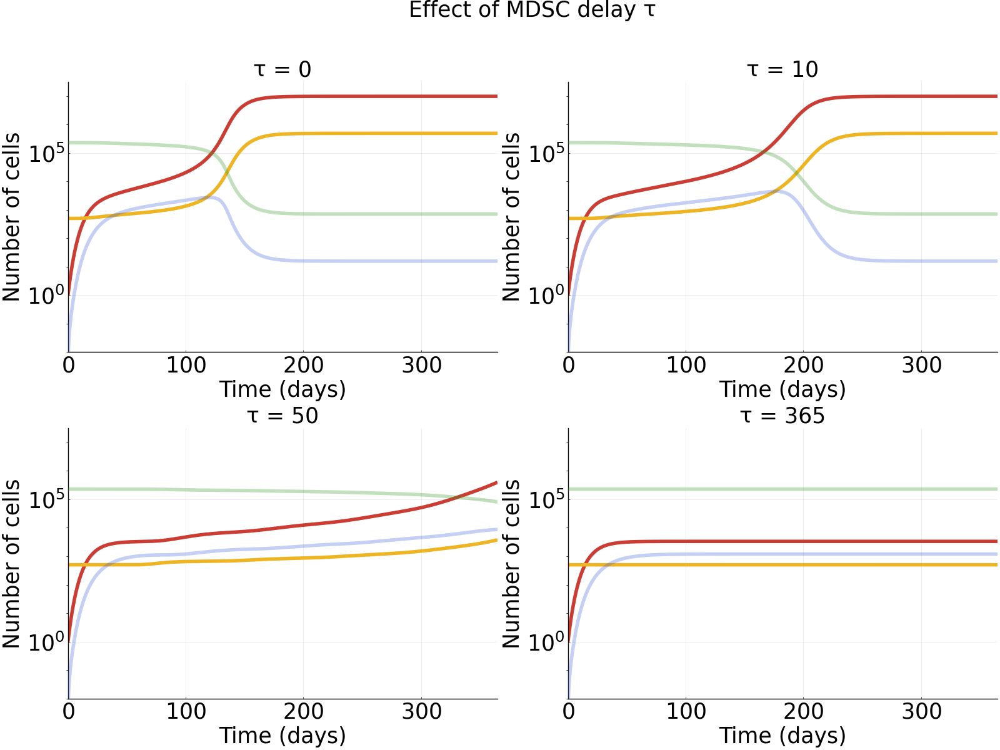

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [11]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
d = plot(sol_panel_d, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Effect of MDSC delay τ", font = "Ariel",titlefontsize=25)

# Figure 2A-C

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [3]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [4]:
#set model parameters
α₂ = 100.0 #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate


γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [5]:
#calculate growth condition G
growthcondition = α₁*log(η)-β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁

0.8111559703245904

In [6]:
#solve with ζ₁ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 445-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658731855330636
   0.6178678412300449
   1.08210261861819
   1.684126310943165
   2.4317786018601573
   3.34578128252542
   4.446307229515896
   5.765151525342025
   7.3470861647998404
   9.261456882988949
  11.618070929491504
   ⋮
 187.9672031342375
 190.03999794557305
 192.9080599208194
 196.63918381898029
 201.59464423824605
 208.01413758737382
 216.52337407060975
 227.97513152798126
 244.3682518224029
 270.40390772927594
 323.1263863026601
 365.0
u: 445-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846703614, 500.0006138318529, 228758.1697666647, 0.0015506139550194307]
 [1.2371655191044955, 500.00288952088306, 228758.16653464, 0.00739247487097743]
 [1.625829025487545, 500.0075401967587, 228758.15023991073, 0.01967656172997377]
 [2.2977508055193923, 500.01551776993205, 228758.10325701066, 0.041424678823349784

## Panel B

In [7]:
#set model parameters
α₂ = 100.0 #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.81 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate


γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [8]:
#calculate growth condition G
growthcondition = α₁*log(η)-β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁

0.0011559703245903608

In [9]:
#solve with ζ₁ = 0.81
prob_panel_b = ODEProblem(ode_system,u0,tspan,p)
sol_panel_b = solve(prob_panel_b,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 27-element Vector{Float64}:
   0.0
   0.06026319071061688
   0.6628950978167857
   2.6285563507918503
   5.9785643229107155
  10.373675099044792
  16.109939551683464
  23.215565882237463
  31.90797313693023
  42.32397405057573
  54.75053510371529
  69.53931614400449
  87.26506215695187
   ⋮
 169.37694402698244
 207.9560365954279
 224.99819092286128
 240.47382121311344
 256.3865307300418
 273.1677958174278
 290.7235835507921
 308.6951866908537
 326.70314494188835
 344.52985076279094
 362.1413674356732
 365.0
u: 27-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0000694553955596, 500.0005990356662, 228758.1697693517, 0.001513285657960967]
 [1.000741729712397, 500.0062106922454, 228758.15094540018, 0.016305754896854163]
 [1.0026763266292371, 500.02047415842446, 228757.91672691298, 0.060501600607488285]
 [1.0052223250076056, 500.0349925073917, 228757.16607628966, 0.12330240840409104]
 [1.0

## Panel C

In [10]:
#set model parameters
α₂ = 100.0 #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 1.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate


γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [11]:
#calculate growth condition G
growthcondition = α₁*log(η)-β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁

-0.18884402967540959

In [12]:
#solve with ζ₁ = 1.0
prob_panel_c = ODEProblem(ode_system,u0,tspan,p)
sol_panel_c = solve(prob_panel_c,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 32-element Vector{Float64}:
   0.0
   0.06026285200529721
   0.3944160223209874
   1.078806968028187
   2.0557432958986555
   3.337174330481057
   5.001938595430361
   7.095683273187781
   9.703612466765511
  12.904649021266206
  16.800268473726167
  21.502002041122203
  27.13381760282179
   ⋮
 137.88449346412898
 167.86024977581516
 206.66432488902862
 239.00781590327495
 256.236104148281
 271.9554932962574
 287.7578627320467
 304.2223382184734
 321.46307402630424
 339.2576101320652
 357.24988365522677
 365.0
u: 32-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [0.9887180655940915, 500.0005956158799, 228758.1697699825, 0.001504657762530663]
 [0.9295698153294281, 500.00365479194215, 228758.1632240973, 0.009436322127571218]
 [0.8243815042201627, 500.00877832044097, 228758.12453758088, 0.02370693382645528]
 [0.704046843869449, 500.0139620361686, 228758.02670666427, 0.04022150305314154]
 [0

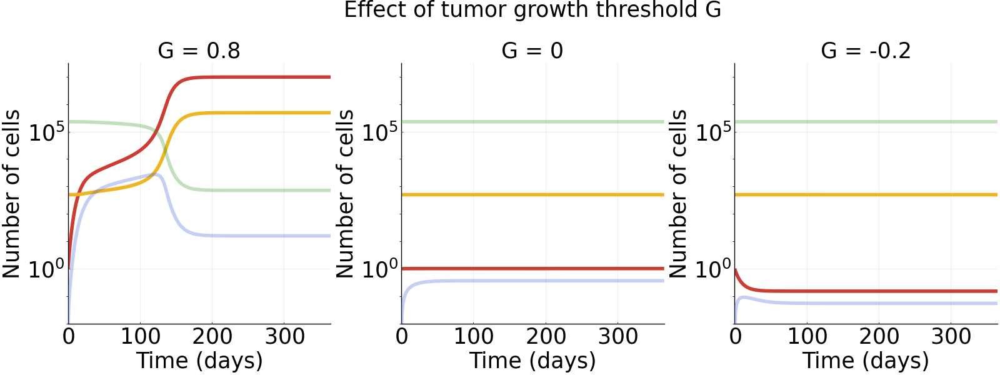

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [13]:
#plot results
l = @layout [a b c]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/3,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "G = 0.8",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/3,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "G = 0",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/3,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "G = -0.2",titlefontsize=25)
plot(a, b, c, layout = l,size =(1600,600),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Effect of tumor growth threshold G", font = "Ariel",titlefontsize=25)

# Figure 2E-F

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [3]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel E

In [4]:
#set model parameters
α₂ = 100.0 #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = (10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate


γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 303030.303030303
      0.0

In [5]:
#calculate growth condition G
growthcondition = α₁*log(η)-β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁

0.5512035044897718

In [6]:
#solve with β₃ = 10⁻⁵
prob_panel_e = ODEProblem(ode_system,u0,tspan,p)
sol_panel_e = solve(prob_panel_e,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 34-element Vector{Float64}:
   0.0
   0.051937098115968826
   0.30114101634968166
   0.7941046672564865
   1.4933753240851284
   2.404452231851278
   3.5813180079056517
   5.069989759581608
   6.958171568649835
   9.376803851708914
  12.554206696876376
  17.074689464150353
  22.21975441947014
   ⋮
 160.5998736111142
 188.22633322162935
 205.79225135578923
 221.8954170745583
 238.07884607159136
 254.87881496294216
 272.3612387925267
 290.3035518623868
 308.39071006811736
 326.391405297754
 362.05106885829866
 365.0
u: 34-element Vector{Vector{Float64}}:
 [1.0, 500.0, 303030.303030303, 0.0]
 [1.0289652611841003, 500.0005241495828, 303030.30298921507, 0.001753038701961103]
 [1.1776436848819132, 500.00317893783176, 303030.3016124757, 0.010798732159090876]
 [1.523156500678104, 500.0092050581452, 303030.29261872265, 0.032163331612730627]
 [2.1482179395989767, 500.01993749141224, 303030.2630047568, 0.07211865414883481]

## Panel F

In [7]:
#set model parameters
α₂ = 100.0 #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = (10.0^(-4.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate


γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 153508.77192982458
      0.0

In [8]:
#calculate growth condition G
growthcondition = α₁*log(η)-β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁

1.0745288633414463

In [9]:
#solve with β₃ = 10⁻⁴
prob_panel_f = ODEProblem(ode_system,u0,tspan,p)
sol_panel_f = solve(prob_panel_f,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 117-element Vector{Float64}:
   0.0
   0.06518436440266683
   0.24648639916779402
   0.5287362306876748
   0.8837445469302025
   1.342545751479067
   1.8995929038201353
   2.5693983158460028
   3.3572241699367433
   4.276233391031249
   5.341080524532108
   6.573844974972305
   8.005273126873185
   ⋮
  88.07722582241064
  91.44466232621272
  95.51469598620972
 100.50929388375064
 106.77585776256481
 114.78699507982853
 125.34462353638523
 139.99187601808302
 162.3574422916657
 203.87447787513346
 355.98752742947227
 365.0
u: 117-element Vector{Vector{Float64}}:
 [1.0, 500.0, 153508.77192982458, 0.0]
 [1.0723094558498782, 500.0006708312075, 153508.7715980509, 0.0011375101049276245]
 [1.299031812723971, 500.0027534611287, 153508.7669467486, 0.004720865766016991]
 [1.7391278305152789, 500.0067503527972, 153508.74707249834, 0.01175535220447616]
 [2.481486435547817, 500.01346701584686, 153508.6945236708, 0.0238536385

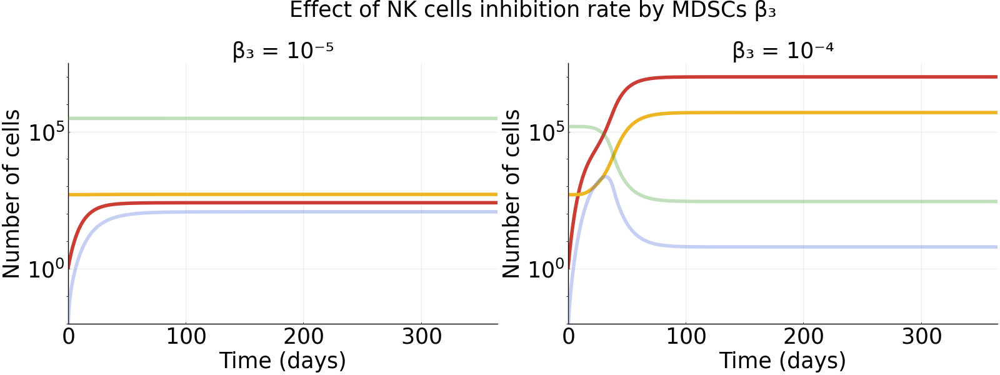

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [10]:
#plot results
l = @layout [e f]
logocolors = Colors.JULIA_LOGO_COLORS
e = plot(sol_panel_e, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "β₃ = 10⁻⁵",titlefontsize=25)
f = plot(sol_panel_f, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "β₃ = 10⁻⁴",titlefontsize=25)
plot(e, f, layout = l,size =(1600,600),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Effect of NK cells inhibition rate by MDSCs β₃", font = "Ariel",titlefontsize=25)

# Figure 2D

In [1]:
using DiffEqSensitivity
using Statistics
using DiffEqCallbacks
using DifferentialEquations
using Plots; pyplot()
import Random

In [2]:
#define condition for simulation to end
function condition(u,t,integrator) 
  u[1] < 0.0 || u[2] < 0.0 || u[3] < 0.0 || u[4] < 0.0
end
floor_event = DiscreteCallback(condition, terminate!)

DiscreteCallback{typeof(condition), typeof(terminate!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, SciMLBase.terminate!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

In [3]:
#define model without delay
function model(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(max(η/T,1)) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

α₂ = 10.0*(10.0^1.0) #MDSCs production rate 
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃)
tspan = (0.0,1000.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]
prob = ODEProblem(model,u0,tspan,p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 1000.0)
u0: 4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [4]:
#set up function for sensitivity analysis
f = function (p)
  prob_func(prob,i,repeat) = remake(prob;p=p[:,i])
  ensemble_prob = EnsembleProblem(prob,prob_func=prob_func)
  sol = solve(ensemble_prob,DynamicSS(Tsit5()),maxiters=10^8,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u),EnsembleThreads(),trajectories=size(p,2))
  out = zeros(2,size(p,2))
  for i in 1:size(p,2)
    out[1,i] = last(sol[i][1,:])
    out[2,i] = maximum(sol[i][1,:])
  end
  out
end

#1 (generic function with 1 method)

In [5]:
#perform sensitivity analysis (with set random seed for reproducibility)
Random.seed!(1212)
m = gsa(f,Morris(total_num_trajectory=1000,num_trajectory=100),[[0.0,10.0^(3.0)],[10.0^(7.0),10.0^(9.0)],[0.0,1.0],[10.0^(-2.0),5*10.0^(-1.0)],[10.0^(6.0),10.0^(8.0)],[10.0^(-7.0),10.0^(-6.0)],[10.0^(-7.0),10.0^(-6.0)],[0.0,0.1],[10.0^(3.0),10.0^(5.0)],[10.0^(-2.0),10.0^(-1.0)],[10.0^(-5.0),10.0^(-4.0)],[10.0^(-2.0),10.0^(-1.0)],[10.0^(-7.0),10.0^(-6.0)],[5*10.0^(-2.0),10.0^(-1.0)],[5*10.0^(-5.0),5*10.0^(-4.0)],[10.0^(-2.0),10.0^(-1.0)],[10.0^(9.0),10.0^(11.0)],[10.0^(6.0),10.0^(8.0)],[10.0^(6.0),10.0^(8.0)]],batch=true)

┌ Warning: Global Sensitivity Analysis has been moved to separate package GlobalSensitivity.jl (https://github.com/SciML/GlobalSensitivity.jl)
└ @ DiffEqSensitivity /Users/jessekreger/.julia/packages/DiffEqSensitivity/PLNju/src/DiffEqSensitivity.jl:72


GlobalSensitivity.MorrisResult{Matrix{Float64}, Vector{Any}}([103.83493925061731 0.08272288017469656 … 3.187801876807058e-12 3.5093279861672165e-12; 22.883428046452497 0.0797984474487037 … 3.187801878228998e-12 2.871481255544281e-12], [103.83493925061731 0.08272288017469656 … 3.241388745262458e-12 3.72060125140278e-12; 22.883428046452497 0.0797984474487037 … 3.2413887463684104e-12 3.082754520779846e-12], [395554.05650880147 0.18519417674004246 … 2.6657511381226906e-22 2.4639458054220308e-22; 11690.409218511366 0.18509501540403572 … 2.6657511380284094e-22 1.4958944730028662e-22], Any[[[0.0012221977058798003, 0.0012221977058798003], [11.365283721104324, 11.365283721104324], [0.021517986215651028, 0.021517986215651028], [0.021134459830820556, 0.021134459830820556], [0.03141375692188721, 0.03141375692188721], [0.031414139002561736, 0.031414139002561736], [0.3241184959709643, 0.3241184959709643], [0.6330477081388234, 0.6330477081388234], [0.0003285807128995675, 0.0003285807128995675], [0.00

In [6]:
#sensitivity analysis values
m.means

2×19 Matrix{Float64}:
 103.835   0.0827229  -2.78136e6  6.98575e7  …  3.1878e-12  3.50933e-12
  22.8834  0.0797984  -2.78199e6  6.98603e7     3.1878e-12  2.87148e-12

In [7]:
#sensitivity analysis values
means1 = m.means[1,:]

19-element Vector{Float64}:
   103.83493925061731
     0.08272288017469656
    -2.781363124964506e6
     6.9857500568687e7
     0.6295626358374732
    -3.8276537518606464e11
    -2.5082962000912238e11
    -1.9479358478653014e8
   -11.616775393788584
   -11.885679430819156
     1.5450482624689665e10
     1.0182459328407733e7
    -6.584522552620142e11
    -4.116436075841259
     6.744128485386486e8
 25999.47363382754
    -9.689214679562618e-6
     3.187801876807058e-12
     3.5093279861672165e-12

In [8]:
#sensitivity analysis values
means2 = m.means[2,:]

19-element Vector{Float64}:
    22.883428046452497
     0.0797984474487037
    -2.7819887864642935e6
     6.986032728177245e7
     0.6295626355197816
    -3.905427386622224e11
    -1.6903693546608752e11
    -1.9479358666906703e8
   -11.61677543604809
   -11.885752053283918
     1.5450482624689665e10
     1.0196286972330712e7
    -6.584522547227012e11
    -4.116184554701599
     4.2707233413750964e8
 26000.981926573677
    -9.512879209080875e-6
     3.187801878228998e-12
     2.871481255544281e-12

In [9]:
#sensitivity analysis values
m.variances

2×19 Matrix{Float64}:
     3.95554e5  0.185194  7.63618e13  1.61352e16  …  2.66575e-22  2.46395e-22
 11690.4        0.185095  7.63582e13  1.61348e16     2.66575e-22  1.49589e-22

In [10]:
#use absolute value for plotting
for i = 1:length(means1)
   means1[i] = abs(means1[i]) 
   means2[i] = abs(means2[i]) 
end

In [11]:
#sensitivity analysis values
means1

19-element Vector{Float64}:
   103.83493925061731
     0.08272288017469656
     2.781363124964506e6
     6.9857500568687e7
     0.6295626358374732
     3.8276537518606464e11
     2.5082962000912238e11
     1.9479358478653014e8
    11.616775393788584
    11.885679430819156
     1.5450482624689665e10
     1.0182459328407733e7
     6.584522552620142e11
     4.116436075841259
     6.744128485386486e8
 25999.47363382754
     9.689214679562618e-6
     3.187801876807058e-12
     3.5093279861672165e-12

In [12]:
#sensitivity analysis values
means2

19-element Vector{Float64}:
    22.883428046452497
     0.0797984474487037
     2.7819887864642935e6
     6.986032728177245e7
     0.6295626355197816
     3.905427386622224e11
     1.6903693546608752e11
     1.9479358666906703e8
    11.61677543604809
    11.885752053283918
     1.5450482624689665e10
     1.0196286972330712e7
     6.584522547227012e11
     4.116184554701599
     4.2707233413750964e8
 26000.981926573677
     9.512879209080875e-6
     3.187801878228998e-12
     2.871481255544281e-12

┌ Warning: scale log is unsupported with Plots.PyPlotBackend().  Choose from: [:identity, :ln, :log2, :log10]
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/args.jl:1648
┌ Warning: scale log is unsupported with Plots.PyPlotBackend().  Choose from: [:identity, :ln, :log2, :log10]
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/args.jl:1648
┌ Warning: scale log is unsupported with Plots.PyPlotBackend().  Choose from: [:identity, :ln, :log2, :log10]
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/args.jl:1648
┌ Warning: scale log is unsupported with Plots.PyPlotBackend().  Choose from: [:identity, :ln, :log2, :log10]
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/args.jl:1648


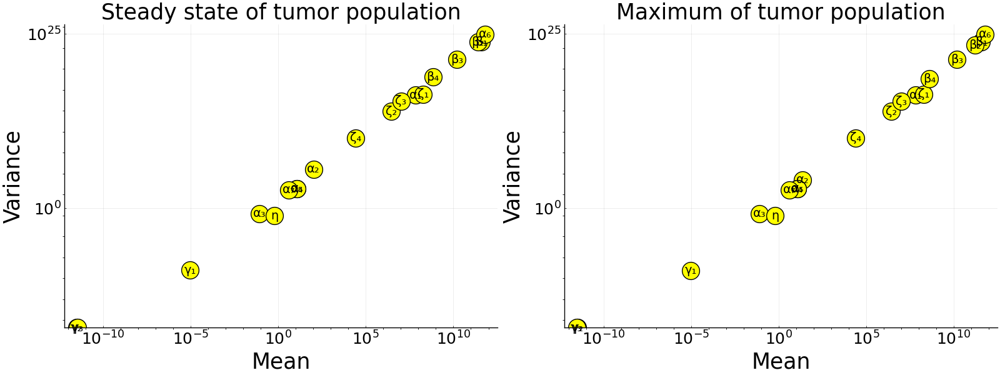

In [13]:
#plot results
l = @layout [a b]
plot1 = scatter(means1, m.variances[1,:],series_annotations=[:α₂,:α₃,:ζ₂,:α₁,:η,:β₁,:β₂,:ζ₁,:α₄,:α₅,:β₃,:ζ₃,:α₆,:α₇,:β₄,:ζ₄,:γ₁,:γ₂,:γ₃],seriescolor=[:yellow :red :green],xscale=:log,yscale=:log,markersize=20,legend=false, title = "Steady state of tumor population", xlabel = "Mean", ylabel = "Variance")
plot2 = scatter(means2, m.variances[2,:],series_annotations=[:α₂,:α₃,:ζ₂,:α₁,:η,:β₁,:β₂,:ζ₁,:α₄,:α₅,:β₃,:ζ₃,:α₆,:α₇,:β₄,:ζ₄,:γ₁,:γ₂,:γ₃],color=:yellow,xscale=:log,yscale=:log,markersize=20,legend=false, title = "Maximum of tumor population", xlabel = "Mean", ylabel = "Variance")
plot(plot1, plot2, layout = l,size =(1600,600),xtickfont=font(18),ytickfont=font(18),guidefont=font(25),legendfont=font(25),titlefont=font(25))

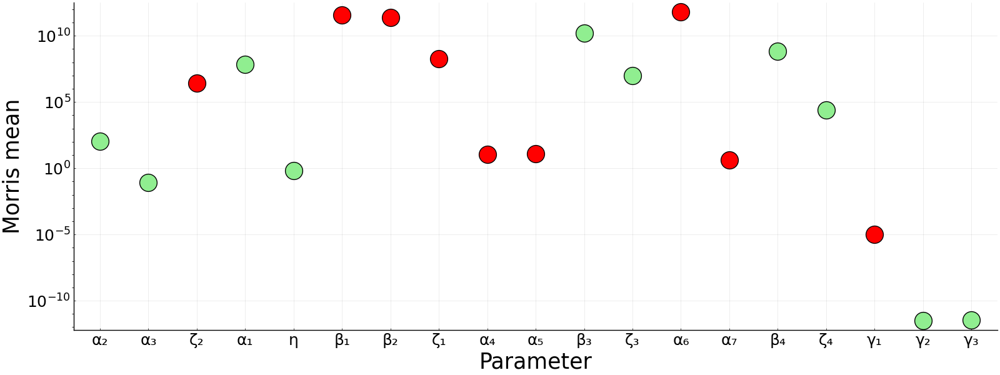

In [14]:
#plot results
plot_justmean = scatter(["α₂","α₃","ζ₂","α₁","η","β₁","β₂","ζ₁","α₄","α₅","β₃","ζ₃","α₆","α₇","β₄","ζ₄","γ₁","γ₂","γ₃"],means1,color=[:lightgreen, :lightgreen, :red, :lightgreen, :lightgreen, :red, :red, :red, :red, :red, :lightgreen, :lightgreen, :red, :red, :lightgreen, :lightgreen, :red, :lightgreen, :lightgreen],yscale=:log10,markersize=20,legend=false, title = "", xlabel = "Parameter", ylabel = "Morris mean") #mean of tumor population
plot(plot_justmean,size =(1600,600),xtickfont=font(18),ytickfont=font(18),guidefont=font(25),legendfont=font(25),titlefont=font(25), xticks = :all)

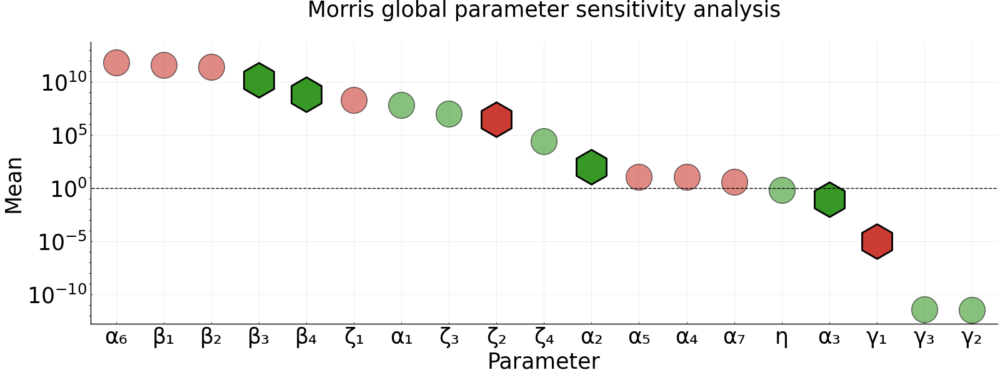

In [15]:
#plot results
plot()

vector_1 = ["α₆", "β₁", "β₂", "β₃", "β₄", "ζ₁", "α₁", "ζ₃", "ζ₂", "ζ₄", "α₂", "α₅", "α₄", "α₇", "η", "α₃", "γ₁", "γ₃", "γ₂"]
vector_2 = [6.60E+11,3.83E+11,2.51E+11,1.55E+10,6.60E+08,1.95E+08,6.98E+07,1.02E+07,2.78E+06,26002.62771,103.8344697,11.91689027,11.61676075,4.113746122,0.629535045,0.082723438,9.69E-06,3.86E-12,3.44E-12]

non_MDSC_size = 30
MDSC_size = 40

non_MDSC_alpha = 0.6
MDSC_alpha = 1

non_MDSC_strokewidth = 1
MDSC_strokewidth = 2

color_positive = [95,177,42]
color_negative = [226,58,52]

logocolors = Colors.JULIA_LOGO_COLORS

vector_size = [non_MDSC_size,non_MDSC_size,non_MDSC_size,MDSC_size,MDSC_size,non_MDSC_size,non_MDSC_size,non_MDSC_size,MDSC_size,non_MDSC_size,MDSC_size,non_MDSC_size,non_MDSC_size,non_MDSC_size,non_MDSC_size,MDSC_size,MDSC_size,non_MDSC_size,non_MDSC_size]
vector_alpha = [non_MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,MDSC_alpha,MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,MDSC_alpha,non_MDSC_alpha,MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha,MDSC_alpha,MDSC_alpha,non_MDSC_alpha,non_MDSC_alpha]
vector_color = [logocolors.red, logocolors.red, logocolors.red, logocolors.green, logocolors.green, logocolors.red, logocolors.green, logocolors.green, logocolors.red, logocolors.green, logocolors.green, logocolors.red, logocolors.red, logocolors.red, logocolors.green, logocolors.green, logocolors.red, logocolors.green, logocolors.green]
vector_strokewidth = [non_MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,MDSC_strokewidth,MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,MDSC_strokewidth,non_MDSC_strokewidth,MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth,MDSC_strokewidth,MDSC_strokewidth,non_MDSC_strokewidth,non_MDSC_strokewidth]
vector_shape = [:circle, :circle, :circle, :hexagon, :hexagon, :circle, :circle, :circle, :hexagon, :circle, :hexagon, :circle, :circle, :circle, :circle, :hexagon, :hexagon, :circle, :circle]

plot_justmean = scatter(vector_1,vector_2,color=vector_color,yscale=:log10,markersize=vector_size, alpha = vector_alpha, markerstrokewidth = vector_strokewidth, markershape = vector_shape, legend=false, title = "", xlabel = "Parameter", ylabel = "Mean", ylims = [10^(-12), 10^13])
hline!([1], color = "Black", style = :dash)
plot!(plot_justmean,size =(1600,600),font = "Ariel",xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),titlefont=font(25),xticks = :all,plot_title="Morris global parameter sensitivity analysis",titlefontsize=25)

# Figures 3A,C and S7

In [1]:
using DifferentialEquations
using Plots; pyplot()
using StochasticDelayDiffEq
using DiffEqCallbacks
using Statistics
import Random

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 2.0 : ones(4).+ 1
h(1,0)

4-element Vector{Float64}:
 2.0
 2.0
 2.0
 2.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [2.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      2.0
    500.0
 228758.1699346405
      0.0

In [6]:
#define stochastic noise
W = WienerProcess(0.0,0.0,0.0)

function σfunction(du,u,h,p,t)
  du[1] = u[1]
  du[2] = u[2]
  du[3] = u[3]
  du[4] = u[4]
end

function σfunction_nodelay(du,u,p,t)
  du[1] = u[1]
  du[2] = u[2]
  du[3] = u[3]
  du[4] = u[4]
end

σfunction_nodelay (generic function with 1 method)

In [7]:
#define conditions for simulation to end
function condition(u,t,integrator) 
  u[1] < 1.0
end

function floor_aff!(integrator)
    integrator.u[1]=1.0
end

function terminate_affect!(integrator)
    terminate!(integrator)
end

floor_event = DiscreteCallback(condition, terminate!)
floor_event2 = DiscreteCallback(condition, floor_aff!)

DiscreteCallback{typeof(condition), typeof(floor_aff!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, floor_aff!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

## Panel A

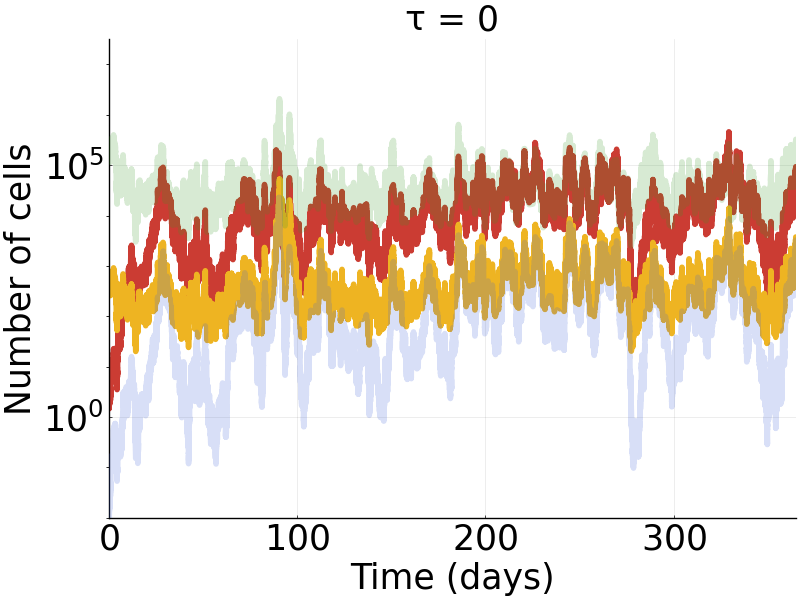

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


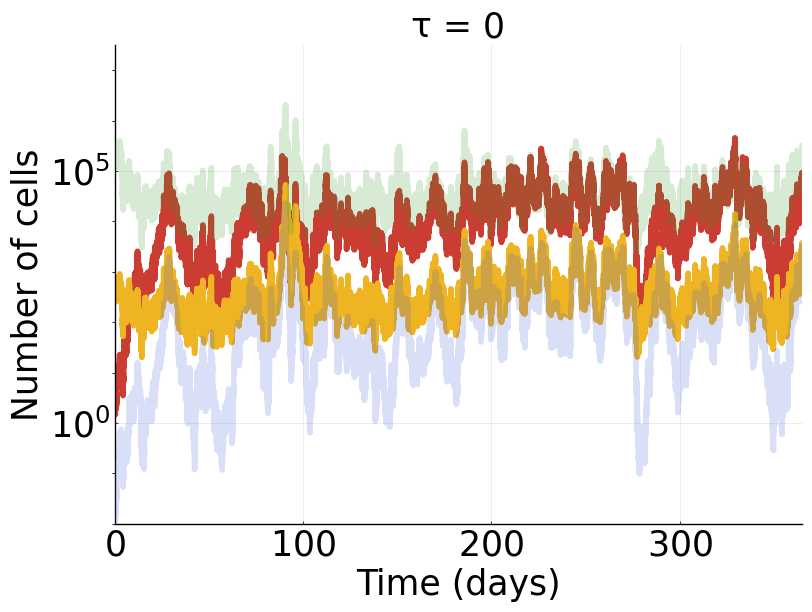

100.0
13917.114726692322

In [8]:
#solve with τ = 0 (with set random seed for reproducibility)
runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1236)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS

prob_nodelay = SDEProblem(ode_system,σfunction_nodelay,u0,tspan,p,noise=W)
sol = solve(prob_nodelay,SOSRI(),callback=floor_event)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    a = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25) 

    display(a)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end
    plot1 = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
    display(plot1)
end
    
print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel B

10.0


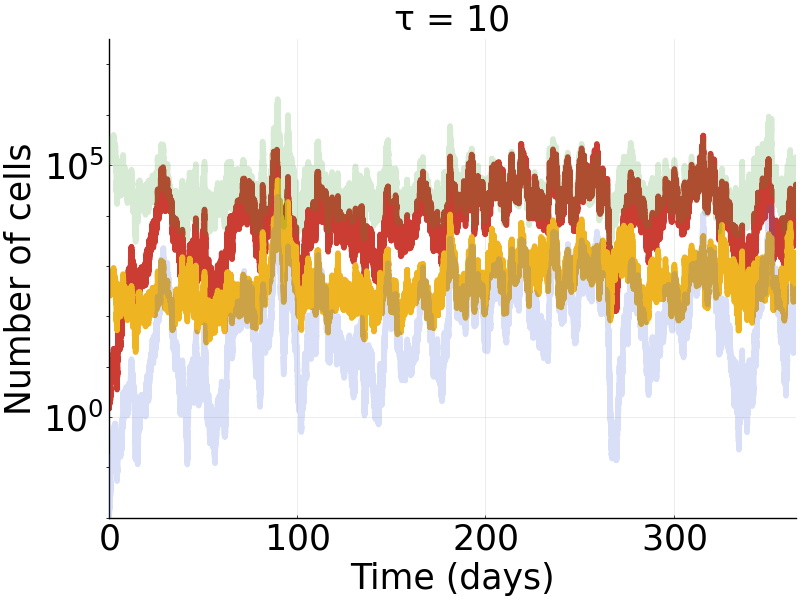

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


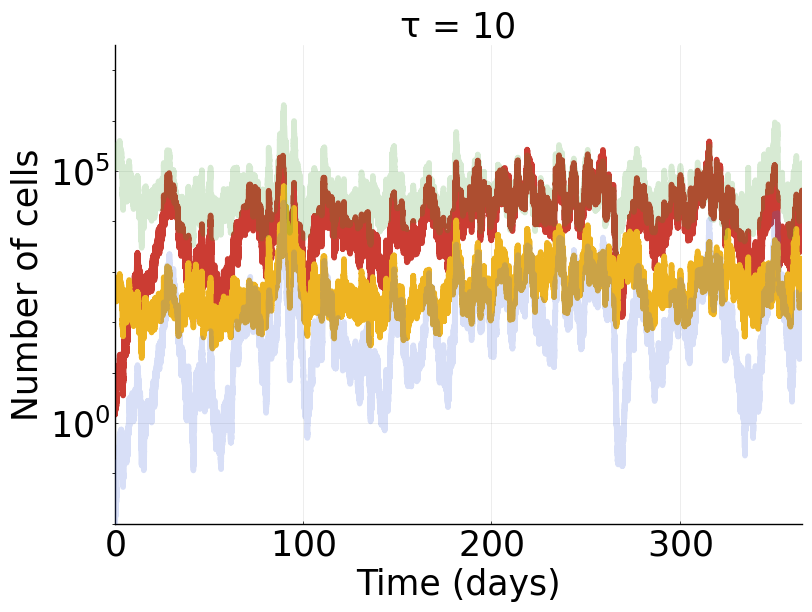

100.0
13841.3649855231

In [9]:
#solve with τ = 10 (with set random seed for reproducibility)
τ = 10.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1236)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS
    
prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    b = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25) 

    display(b)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end
    plot1 = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
    display(plot1)
end

print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel C

50.0


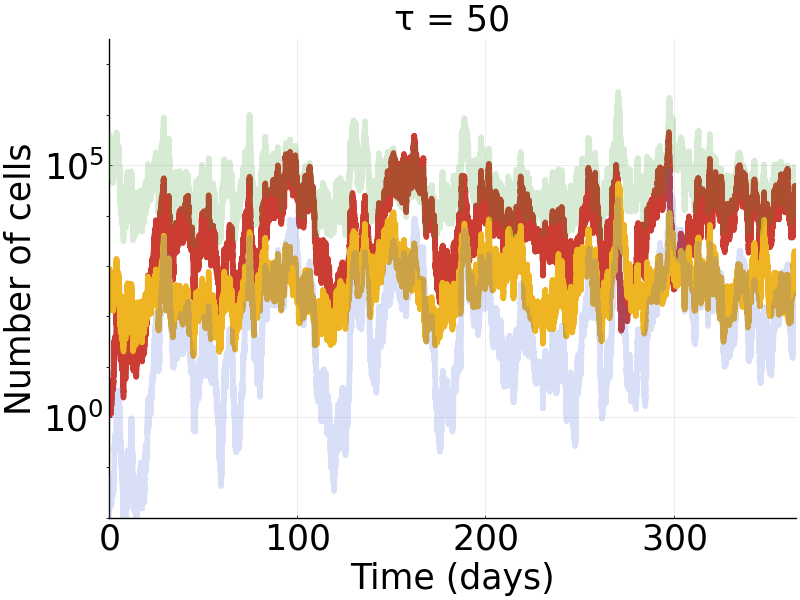

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


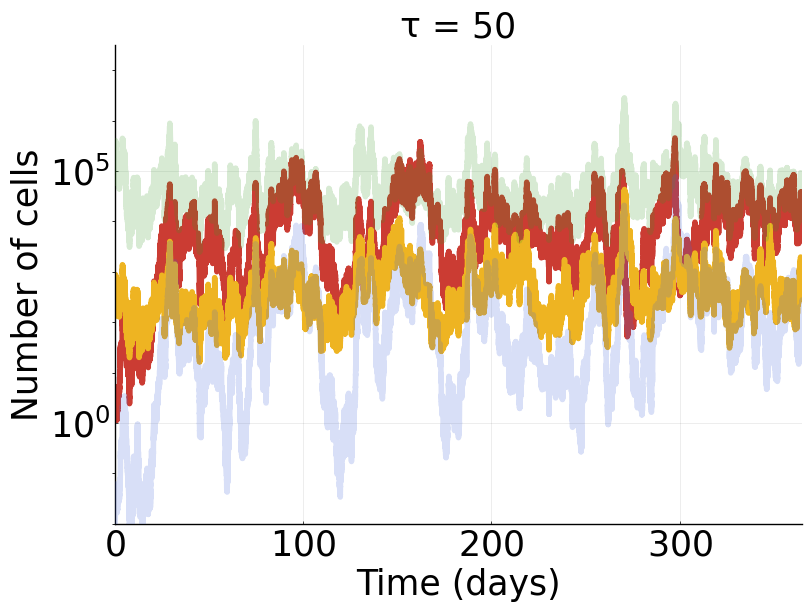

100.0
10707.268745950272

In [10]:
#solve with τ = 50 (with set random seed for reproducibility)
τ = 50.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1238)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS

prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    c = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25) 

    display(c)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end
    plot1 = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
    display(plot1)
end

print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel D

365.0


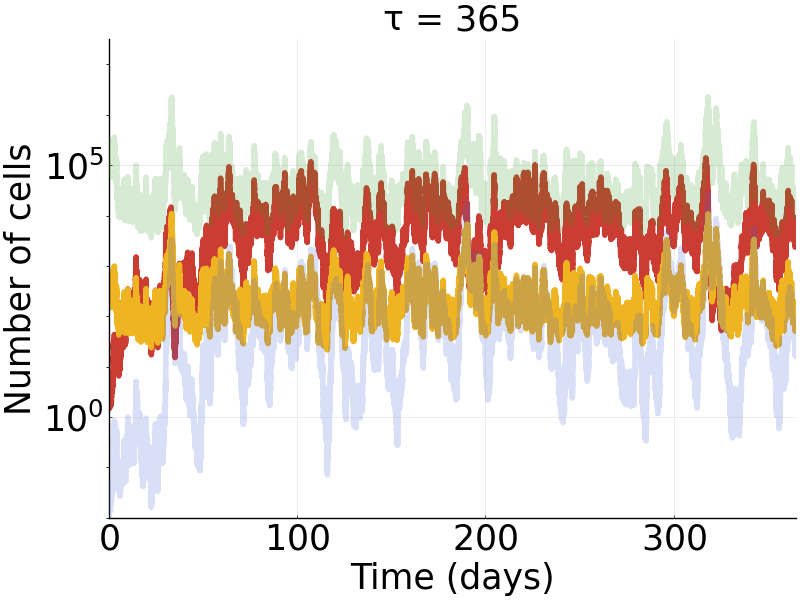

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


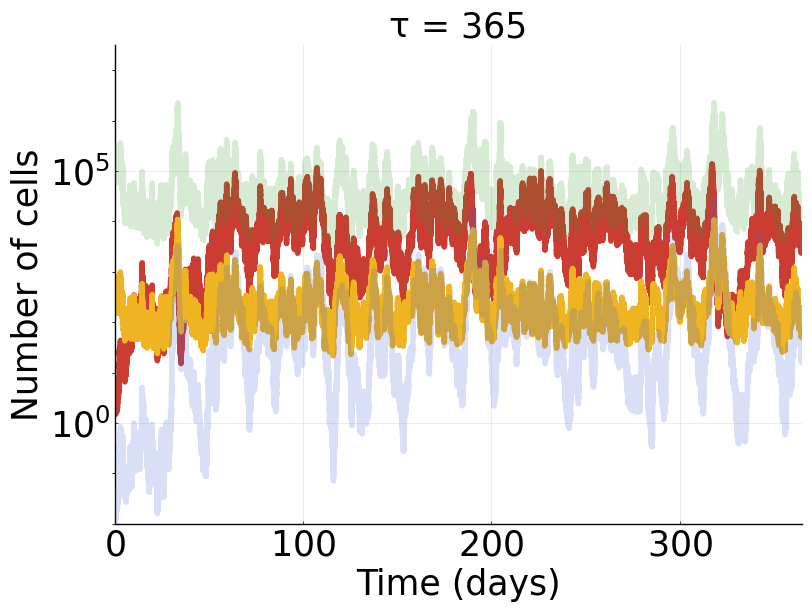

100.0
7103.147271711539

In [11]:
#solve with τ = 365 (with set random seed for reproducibility)
τ = 365.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1244)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS
 
prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    d = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25) 

    display(d)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end
    plot1 = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
    display(plot1)
end


print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


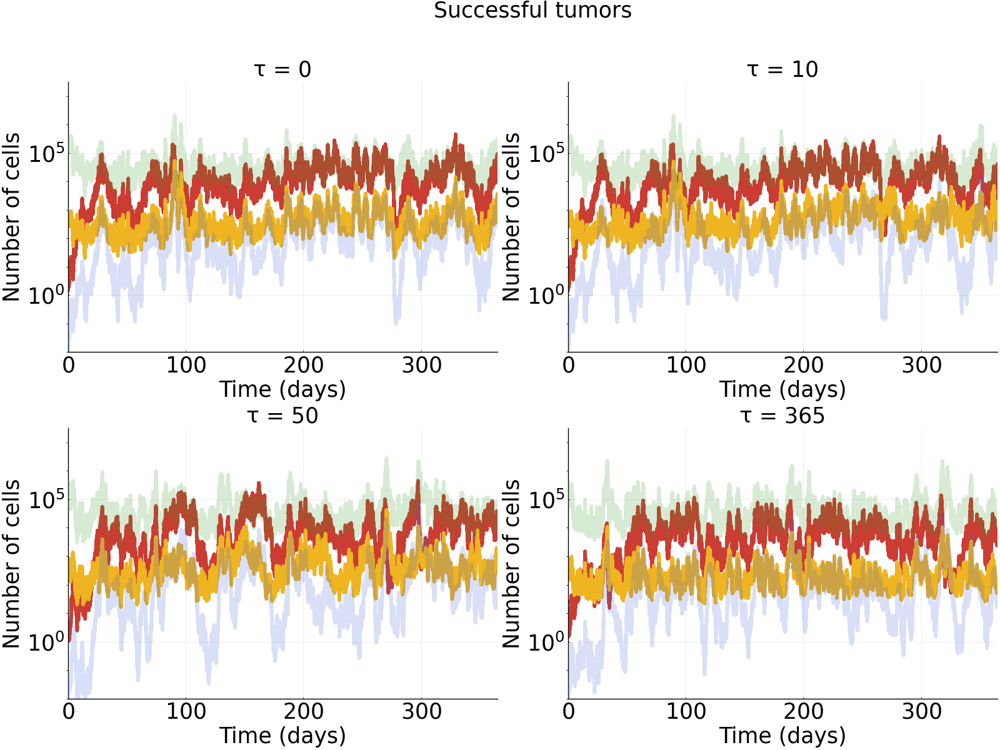

In [12]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Successful tumors", font = "Ariel",titlefontsize=25)

# Figures 3B,D and S8

In [1]:
using DifferentialEquations
using Plots; pyplot()
using StochasticDelayDiffEq
using DiffEqCallbacks
using Statistics 
import Random

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 2.0 : ones(4).+ 1
h(1,0)

4-element Vector{Float64}:
 2.0
 2.0
 2.0
 2.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [2.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      2.0
    500.0
 228758.1699346405
      0.0

In [6]:
#define stochastic noise
W = WienerProcess(0.0,0.0,0.0)

function σfunction(du,u,h,p,t)
  du[1] = u[1]
  du[2] = u[2]
  du[3] = u[3]
  du[4] = u[4]
end

function σfunction_nodelay(du,u,p,t)
  du[1] = u[1]
  du[2] = u[2]
  du[3] = u[3]
  du[4] = u[4]
end

σfunction_nodelay (generic function with 1 method)

In [7]:
#define conditions for simulation to end
function condition(u,t,integrator) 
  u[1] < 1.0
end

function floor_aff!(integrator)
    integrator.u[1]=1.0
end

function terminate_affect!(integrator)
    terminate!(integrator)
end

floor_event = DiscreteCallback(condition, terminate!)
floor_event2 = DiscreteCallback(condition, floor_aff!)

DiscreteCallback{typeof(condition), typeof(floor_aff!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, floor_aff!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

## Panel A

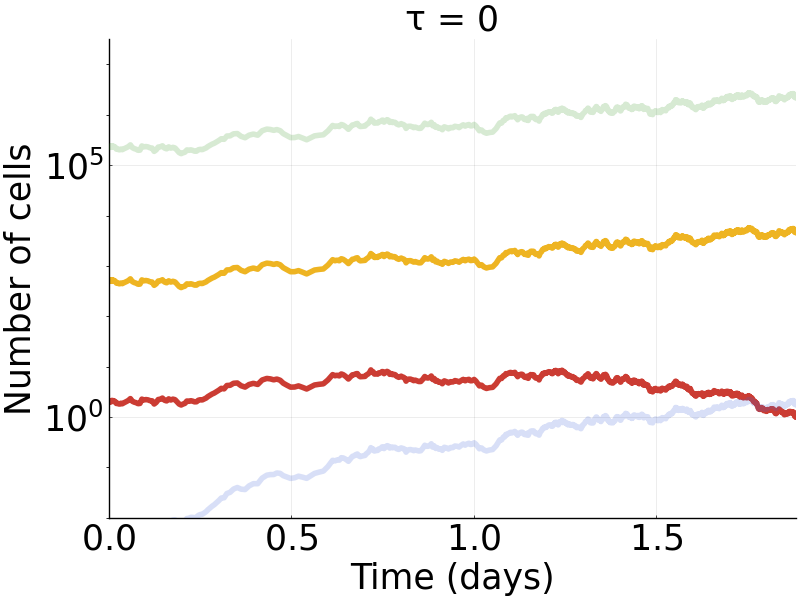

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


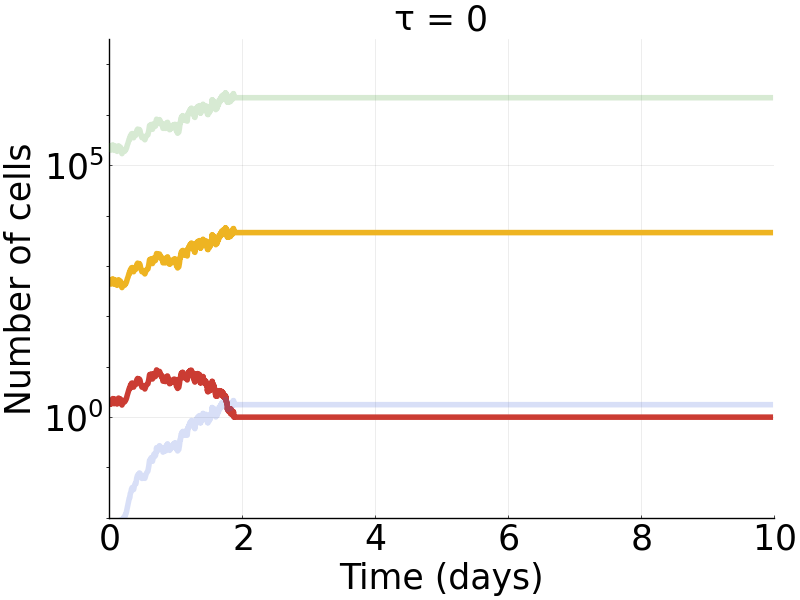

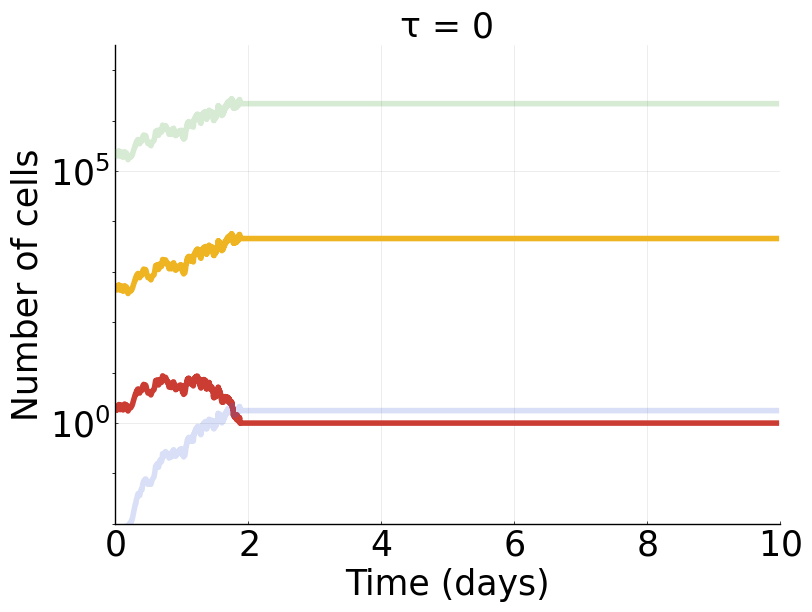

0.0
NaN

In [8]:
#solve with τ = 0 (with set random seed for reproducibility)
runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1234)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS

prob_nodelay = SDEProblem(ode_system,σfunction_nodelay,u0,tspan,p,noise=W)
sol = solve(prob_nodelay,SOSRI(),callback=floor_event)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    plot1 = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25) 

    display(plot1)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end

    for i in sol.t[BB]:0.1:10.0
        push!(sol.t,i)
        push!(sol,sol[:,BB])
    end

    a = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
    a_extended = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,10.0), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
    display(a)
    display(a_extended)
end
    
print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel B

10.0


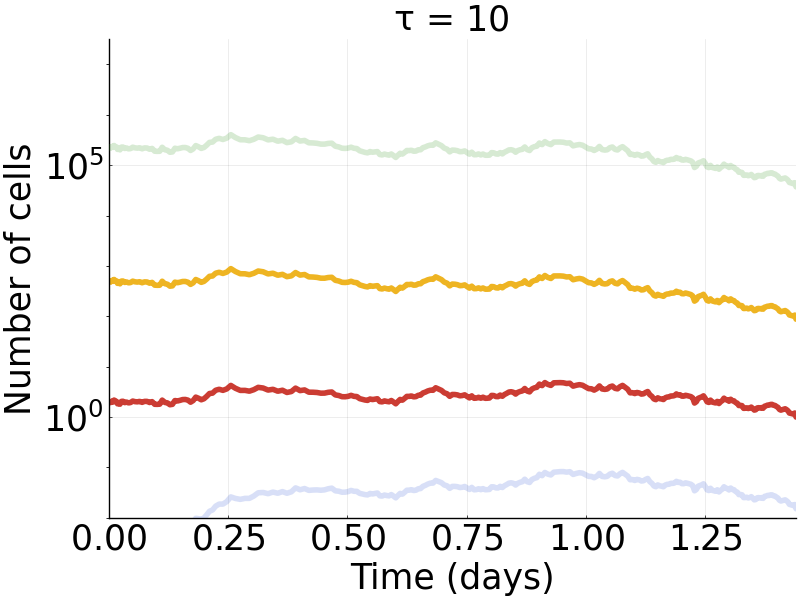

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


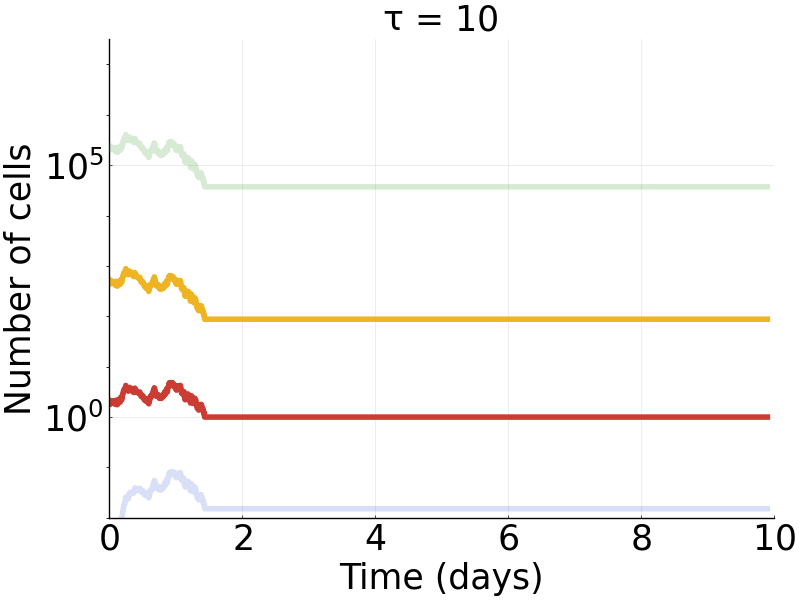

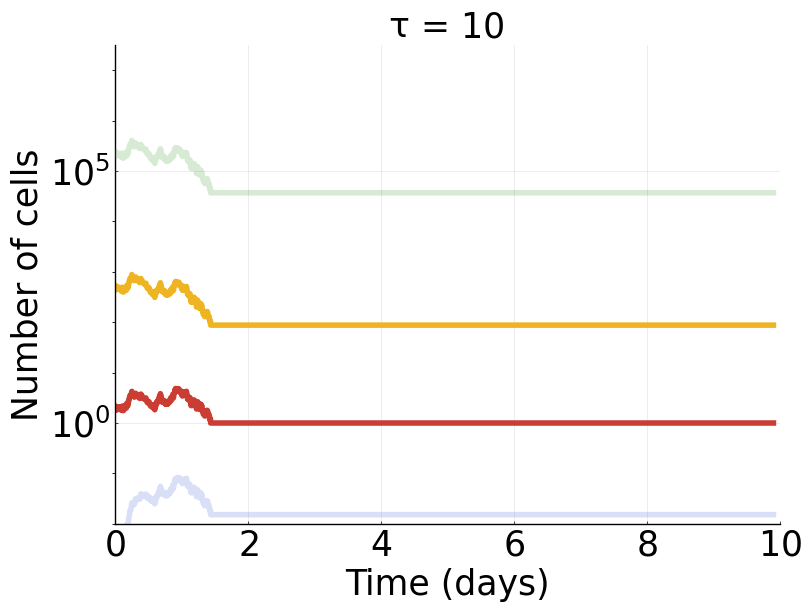

0.0
NaN

In [9]:
#solve with τ = 10 (with set random seed for reproducibility)
τ = 10.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1230)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS

prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    plot1 = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25) 

    display(plot1)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end

    time_vector = sol.t[1:BB]   
    sol1 = sol[:,1:BB]
    for i in sol.t[BB]:0.1:10.0
        push!(time_vector,i)
        sol1 = [sol1 sol[:,BB]]
    end

    b = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
    b_extended = plot(time_vector, transpose(sol1), lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,10.0), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)

    display(b)
    display(b_extended)
end

print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel C

50.0


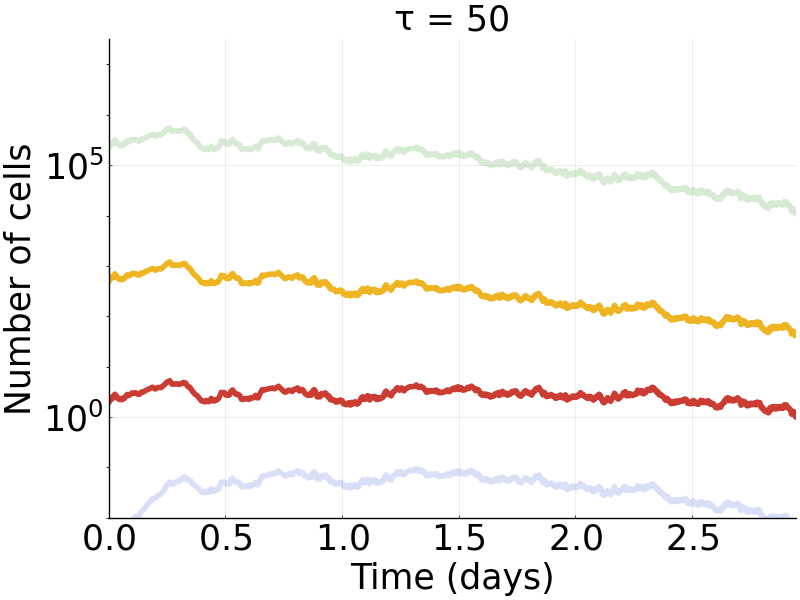

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


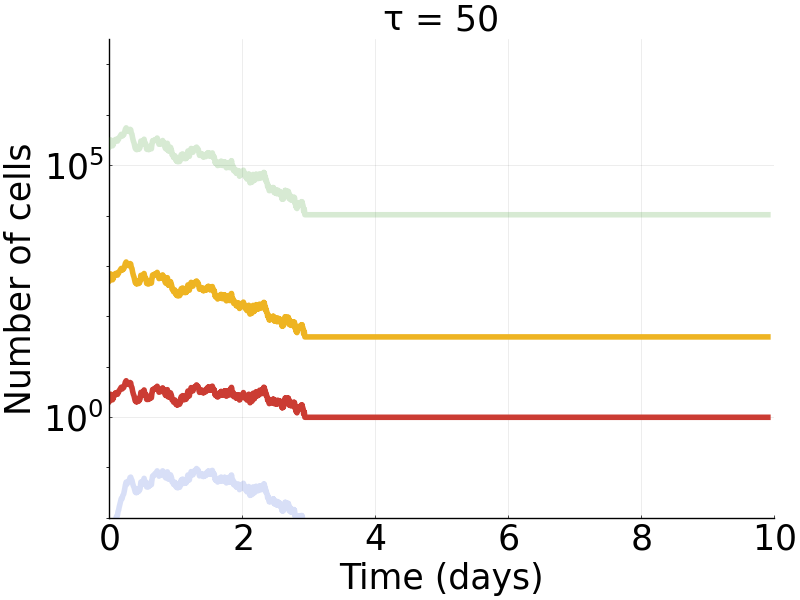

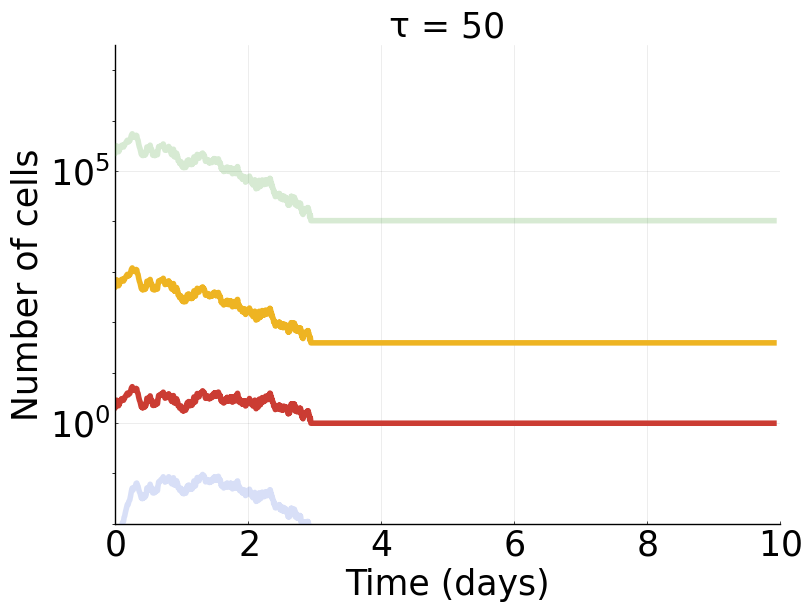

0.0
NaN

In [10]:
#solve with τ = 50 (with set random seed for reproducibility)
τ = 50.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1269)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS
  
prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    plot1 = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25) 

    display(plot1)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end

    time_vector = sol.t[1:BB]   
    sol1 = sol[:,1:BB]
    for i in sol.t[BB]:0.1:10.0
        push!(time_vector,i)
        sol1 = [sol1 sol[:,BB]]
    end

    c = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
    c_extended = plot(time_vector, transpose(sol1), lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,10.0), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)

    display(c)
    display(c_extended)
end

print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

## Panel D

365.0


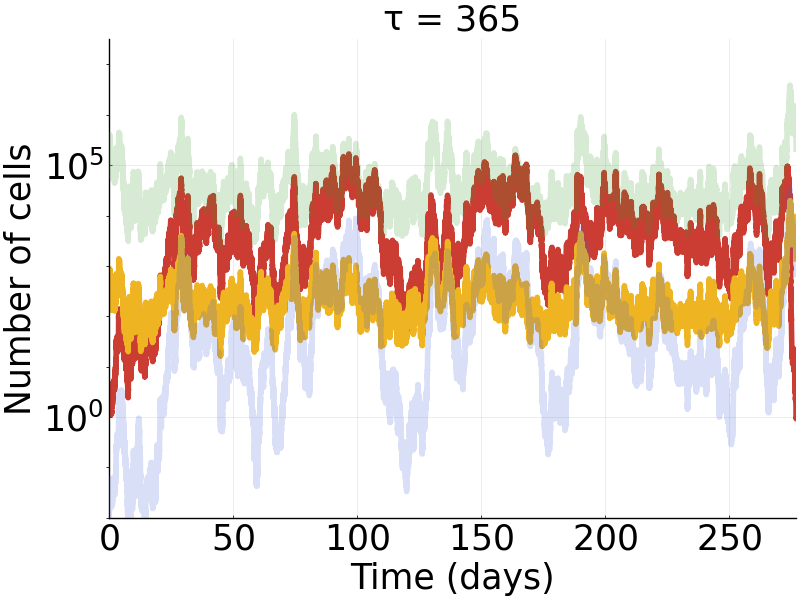

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


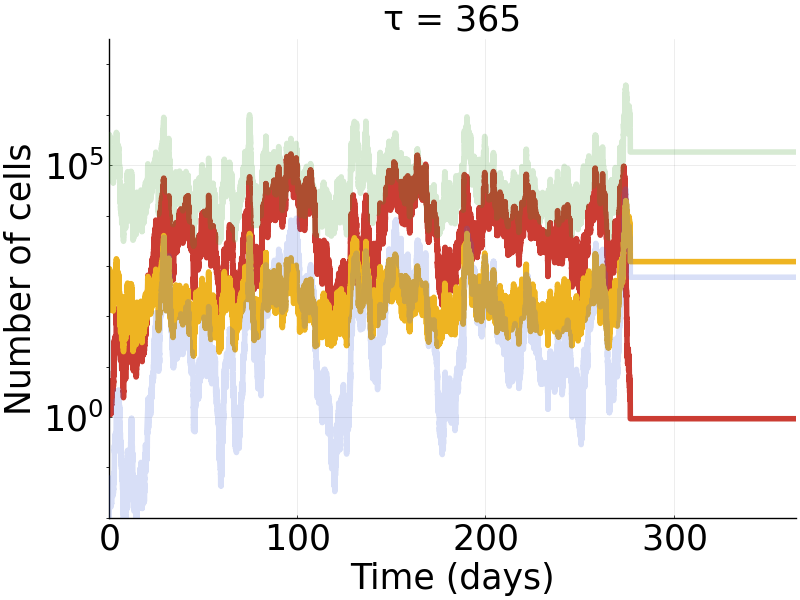

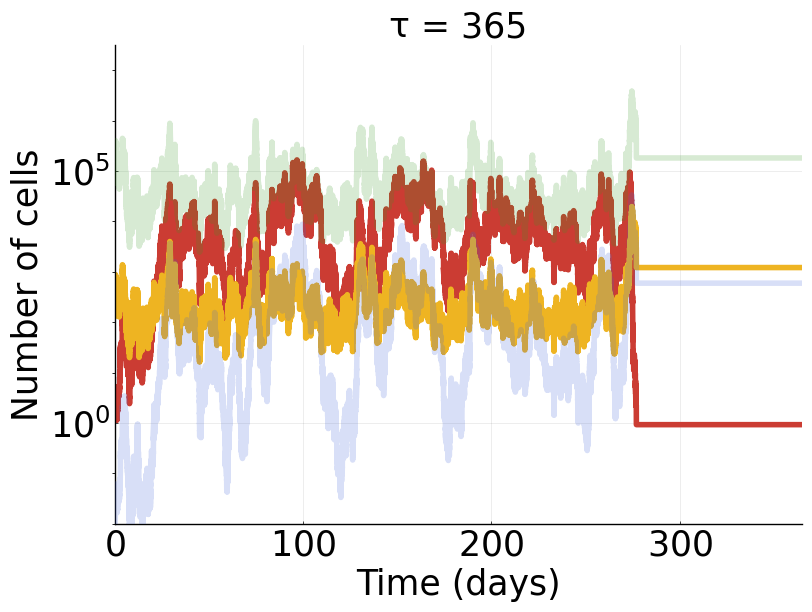

0.0
NaN

In [11]:
#solve with τ = 365 (with set random seed for reproducibility)
τ = 365.0
lags = [τ]

print(τ, "\n")

runs = 1.0
tumorsuccess = 0.0
threshold = 1.0

Random.seed!(1238)

meanofsuccessfulltumors = 0.0;

logocolors = Colors.JULIA_LOGO_COLORS

prob1 = SDDEProblem(dde_system,σfunction,u0,h,tspan,p; constant_lags=lags,noise=W)
sol = solve(prob1,SOSRI(),maxiters=10^8,callback=floor_event2)

A = minimum(sol[1,:])    

if A ≥ threshold
    tumorsuccess = tumorsuccess + 1
    meanofsuccessfulltumors = meanofsuccessfulltumors + mean(sol[1,:])
    plot1 = plot(sol, lw = 4, yaxis=:log, size =(800,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25) 

    display(plot1)
else
    for j in 1:length(sol[1,:])
        global BB = j
        if sol[1,j] < threshold
            break
        end
    end

     time_vector = sol.t[1:BB]   
    sol1 = sol[:,1:BB]
    for i in sol.t[BB]:0.1:365.0
        push!(time_vector,i)
        sol1 = [sol1 sol[:,BB]]
    end

    d = plot(sol, lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,sol.t[BB]), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
    d_extended = plot(time_vector, transpose(sol1), lw = 4, yaxis=:log,size =(800,600), font = "Ariel", xlims = (0,365.0), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.2 0.2], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)

    display(d)
    display(d_extended)
end

print(100*tumorsuccess/runs, "\n")

print(meanofsuccessfulltumors/tumorsuccess)

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


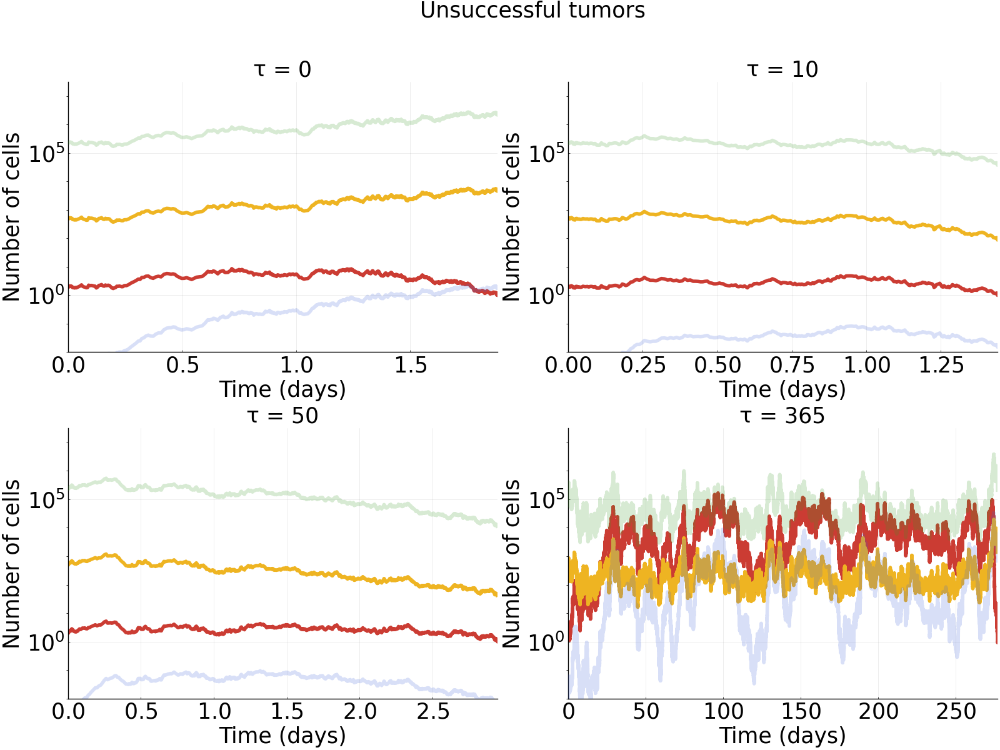

In [12]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Unsuccessful tumors", font = "Ariel",titlefontsize=25)

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


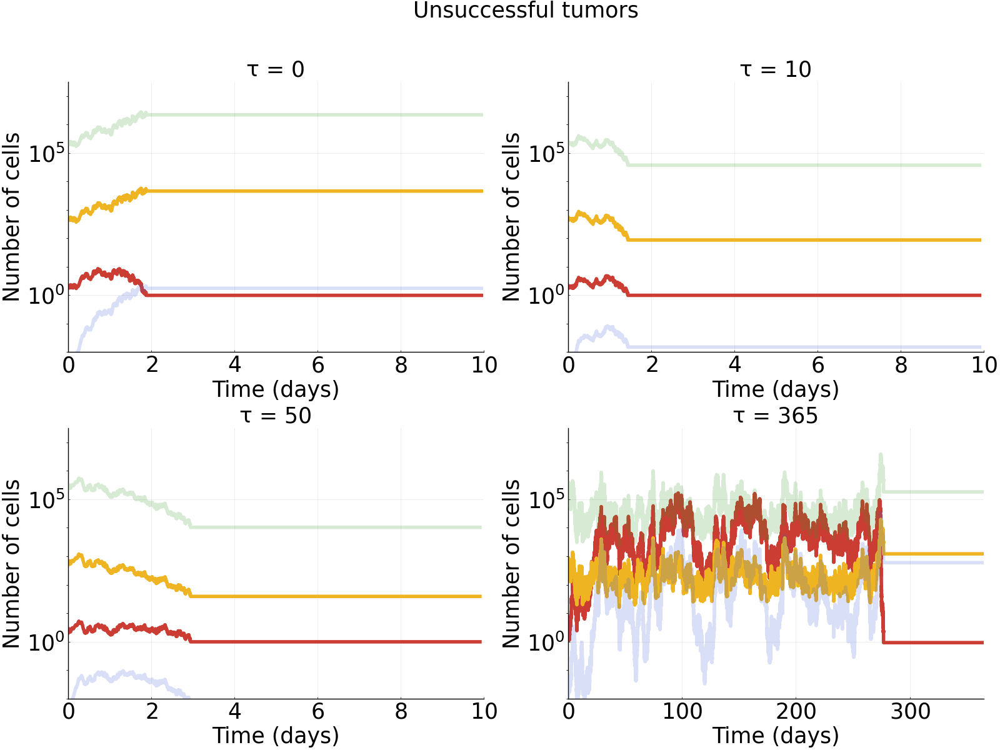

In [13]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
plot(a_extended, b_extended, c_extended, d_extended, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Unsuccessful tumors", font = "Ariel",titlefontsize=25)

# Figures 4, S4, S6, S12, S13, and S17 

In [1]:
using Plots; pyplot()

Plots.PyPlotBackend()

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in 

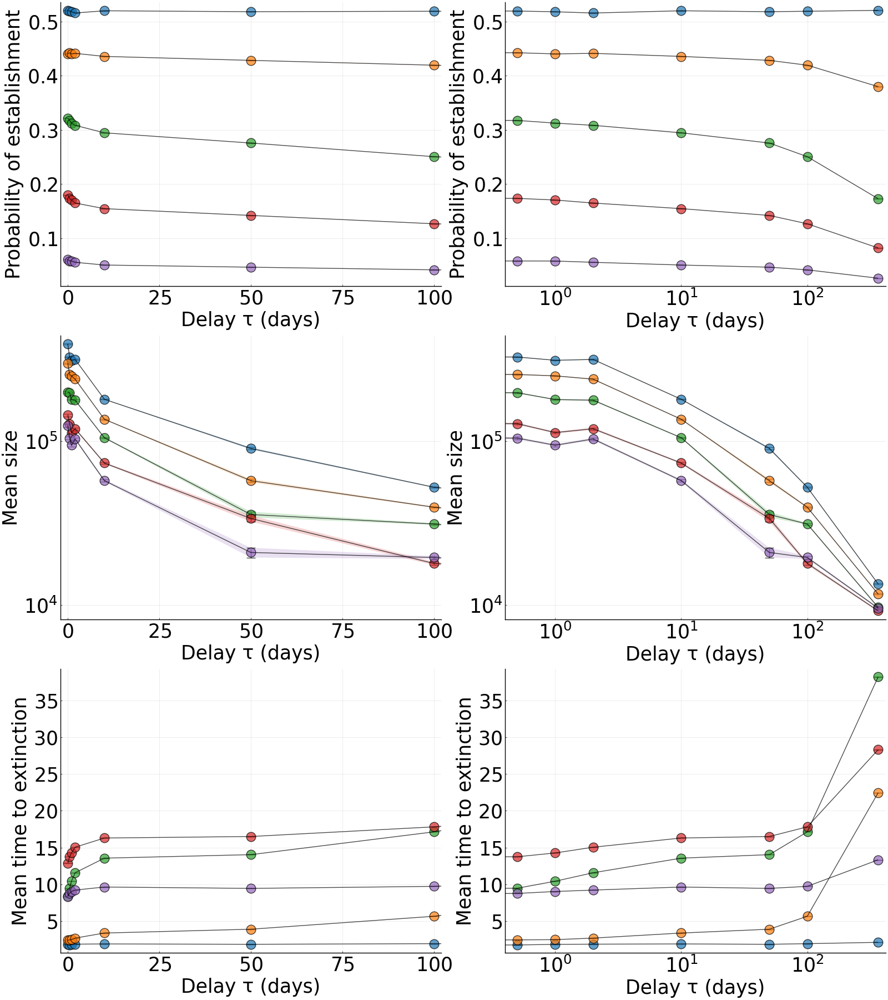

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [2]:
#plot for α₂
l = @layout [a b; c d; e f]
delays = [0,0.5,1,2,10,50,100,365]

prob_success200 = [0.52067,0.51936,0.51802,0.51573,0.51987,0.51813,0.51899,0.5206]
prob_sigma200 = [0.499575,0.499628,0.499678,0.499755,0.499608,0.499674,0.499642,0.499578]
mean200 = [390917,325657,311041,314798,179711,90063.8,52208,13398.2]
mean_sigma200 = [6.57092*10^6,4.59642*10^6,3.87981*10^6,4.90952*10^6,2.29257*10^6,3.62887*10^6,1.01787*10^6,276487]
number_of_sims200 = [sqrt(100000),sqrt(100000),sqrt(100000),sqrt(100000),sqrt(100000),sqrt(100000),sqrt(100000),sqrt(100000)]
time200 = [1.8359,1.79055,1.87445,1.8974,1.93117,1.88062,1.96586,2.14636]
time_sigma200 =[7.96526,7.4512,8.39377,8.61256,9.12563,8.11352,9.15333,11.7485]

prob_success150 = [0.440281,0.442417,0.440206,0.441288,0.435629,0.428312,0.419405,0.379864]
prob_sigma150 = [0.496423,0.496676,0.496414,0.496543,0.495841,0.494836,0.493464,0.485355]
mean150 = [297352,254711,249961,238555,135733,57244.9,39425.7,11631.9]
mean_sigma150 = [5.20893*10^6,4.16001*10^6,3.57743*10^6,5.68132*10^6,1.59068*10^6,1.02464*10^6,1.32366*10^6,190806]
number_of_sims150 = [sqrt(120230),sqrt(104311),sqrt(105696),sqrt(104816),sqrt(105459),sqrt(108540),sqrt(110218),sqrt(126453)]
time150 = [2.43575,2.47981,2.51275,2.72231,3.409,3.92847,5.68224,22.4496]
time_sigma150 =[12.7222,13.0423,12.9583,15.0331,18.4065,18.3952,22.9263,67.3271]

prob_success100 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma100 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean100 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma100 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims100 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time100 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma100 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]

prob_success50 = [0.179698,0.17358,0.170547,0.164953,0.154619,0.142073,0.126716,0.0820594]
prob_sigma50 = [0.383937,0.37875,0.376114,0.37114,0.361543,0.349127,0.332656,0.274456]
mean50 = [143826.,127601.,112551.,118862.,73341.7,33654.7,17877.6,9187.57]
mean_sigma50 = [2.15731*10^6,2.31411*10^6,1.63087*10^6,2.63169*10^6,1.08651*10^6,659450.,176773.,2301.57]
number_of_sims50 = [sqrt(134175),sqrt(100029),sqrt(103086),sqrt(103381),sqrt(102730),sqrt(105664),sqrt(108487),sqrt(121473)]
time50 = [12.9067,13.7628,14.2784,15.0591,16.3064,16.512,17.8204,28.2929]
time_sigma50 =[49.884,51.9084,52.5574,54.2098,55.9658,54.2856,54.3863,71.7908]

prob_success0 = [0.0609653,0.0580386,0.0579275,0.0555649,0.0505348,0.0465496,0.0416369,0.0262047]
prob_sigma0 = [0.239267,0.233818,0.233607,0.22908,0.219047,0.210673,0.199759,0.159744]
mean0 = [124420.,104145.,94199.3,102888.,57298.3,20862.6,19442.7,9534.08]
mean_sigma0 = [3.38188*10^6,2.07578*10^6,1.06524*10^6,1.47331*10^6,1.12906*10^6,149171.,352002.,2386.96]
number_of_sims0 = [sqrt(1342140),sqrt(104999),sqrt(152501),sqrt(148007),sqrt(105175),sqrt(134244),sqrt(137114),sqrt(104981)]
time0 = [8.35639,8.78197,9.04973,9.23944,9.65523,9.46847,9.74487,13.3427]
time_sigma0 =[39.5505,40.7133,41.3733,41.7399,42.4668,40.7554,40.3345,49.0281]


prob_success = [prob_success200 prob_success150 prob_success100 prob_success50 prob_success0]
prob_sigma = [prob_sigma200/number_of_sims200 prob_sigma150/number_of_sims150 prob_sigma100/number_of_sims100 prob_sigma50/number_of_sims50 prob_sigma0/number_of_sims0]

mean = [mean200 mean150 mean100 mean50 mean0]
mean_sigma = [mean_sigma200/number_of_sims200 mean_sigma150/number_of_sims150 mean_sigma100/number_of_sims100 mean_sigma50/number_of_sims50 mean_sigma0/number_of_sims0]

time = [time200 time150 time100 time50 time0]
time_sigma = [time_sigma200/number_of_sims200 time_sigma150/number_of_sims150 time_sigma100/number_of_sims100 time_sigma50/number_of_sims50 time_sigma0/number_of_sims0]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,grid=true,color = "Black",alpha=0.7,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passe

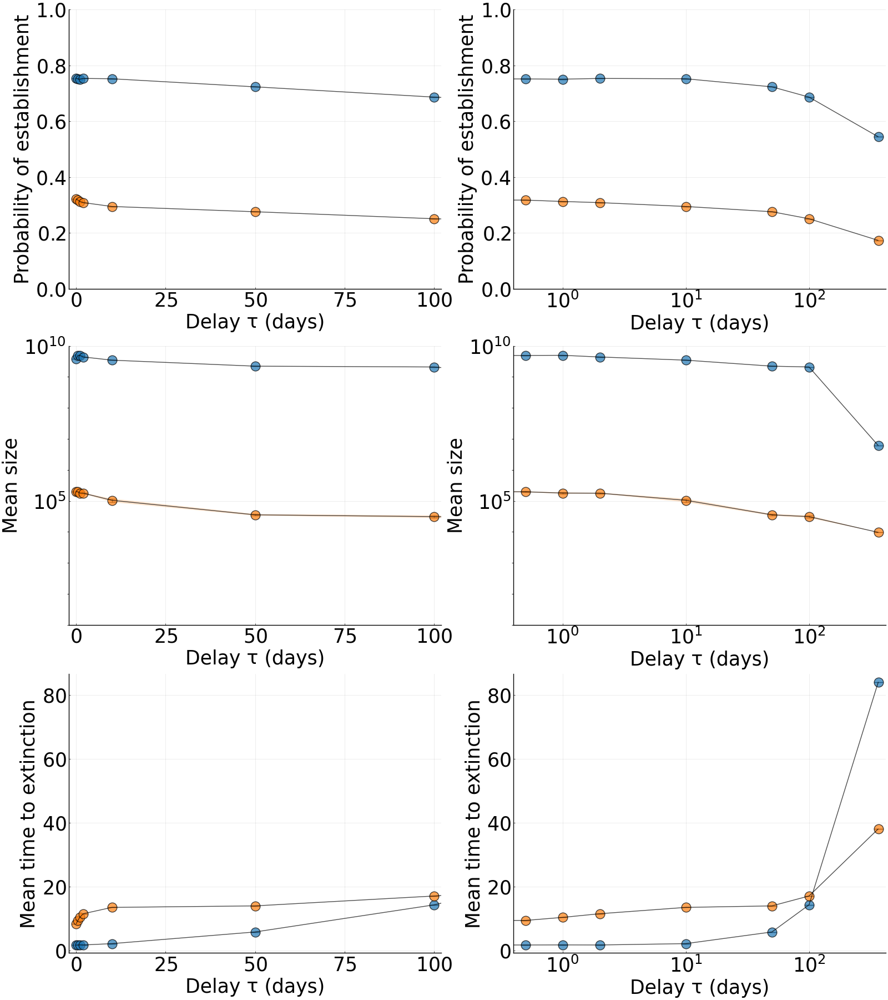

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [3]:
#plot for η
l = @layout [a b; c d; e f]
l2 = @layout [a b; c d]
delays = [0,0.5,1,2,10,50,100,365]

prob_success150 = [0.754599,0.751787,0.750863,0.75358,0.752391,0.723453,0.686677,0.544244]
prob_sigma150 = [0.430327,0.431983,0.43252,0.430932,0.43163,0.447296,0.463848,0.498039]
mean150 = [3.79728*10^9,4.92352*10^9,4.9799*10^9,4.40203*10^9,3.47341*10^9,2.22318*10^9,2.09495*10^9,6.07644*10^6]
mean_sigma150 = [1.50978*10^10,3.0153*10^10,3.76232*10^10,2.77741*10^10,5.7649*10^10,1.00901*10^10,1.21033*10^10,7.88151*10^6]
number_of_sims150 = [sqrt(111992),sqrt(34422),sqrt(33596),sqrt(32538),sqrt(31788),sqrt(41436),sqrt(66248),sqrt(421607)].*1000
time150 = [1.76005,1.80562,1.83297,1.80836,2.22961,5.88134,14.3664,84.1535]
time_sigma150 =[2.42203,2.48357,2.56655,2.50686,3.56049,12.7505,28.204,112.32]

prob_success100 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma100 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean100 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma100 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims100 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time100 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma100 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]


prob_success = [prob_success150 prob_success100]
prob_sigma = [prob_sigma150/number_of_sims150 prob_sigma100/number_of_sims100]

mean = [mean150 mean100]
mean_sigma = [mean_sigma150/number_of_sims150 mean_sigma100/number_of_sims100]

time = [time150 time100]
time_sigma = [time_sigma150/number_of_sims150 time_sigma100/number_of_sims100]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),ylims = (0,1),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),ylims = (10^1,10^10),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,grid=true,color = "Black",alpha=0.7,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),ylims = (0,1),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),ylims = (10^1,10^10),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

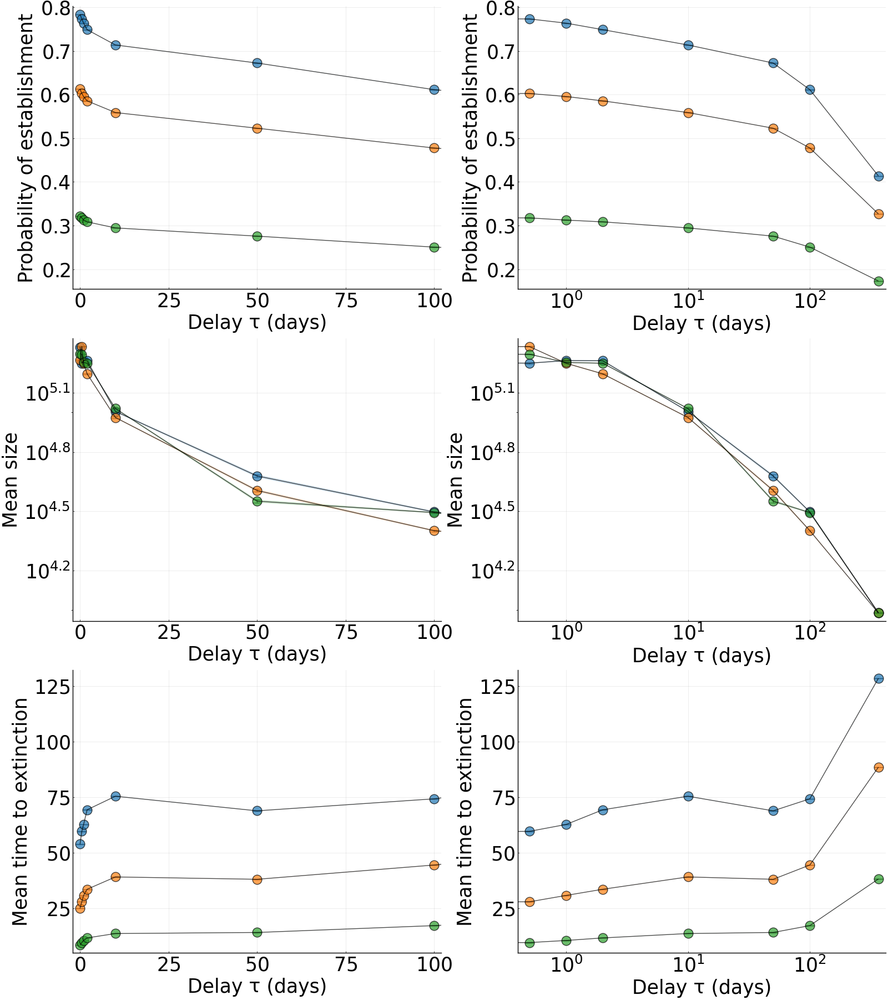

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

In [4]:
#plot for tumor initial conditions
l = @layout [a b; c d; e f]
delays = [0,0.5,1,2,10,50,100,365]

prob_success20 = [0.783705,0.773214,0.763597,0.748646,0.713554,0.672255,0.611253,0.41362]
prob_sigma20 = [0.411719,0.418755,0.424874,0.433793,0.452102,0.469393,0.487468,0.492484]
mean20 = [214418.,177677.,183109.,182765.,101224.,47712.2,31358.6,9699.13]
mean_sigma20 = [4.58596*10^6,2.24516*10^6,3.55787*10^6,3.40038*10^6,2.13793*10^6,1.94614*10^6,770445.,2448.66]
number_of_sims20 = [sqrt(205465),sqrt(129245),sqrt(127604),sqrt(123881),sqrt(125109),sqrt(124060),sqrt(129143),sqrt(125110)]
time20 = [53.87,59.6264,62.7197,69.3482,75.4562,68.8745,74.2845,128.597]
time_sigma20 =[93.9595,98.1542,99.9115,103.705,105.245,93.5751,87.8084,111.959]

prob_success150 = [0.612917,0.602407,0.595595,0.58551,0.55877,0.522942,0.477621,0.326694]
prob_sigma150 = [0.487084,0.489403,0.490779,0.492636,0.496536,0.499476,0.499501,0.469006]
mean150 = [184233.,215653.,177471.,156876.,94292.,40274.7,25202.8,9648.22]
mean_sigma150 = [2.58952*10^6,6.44635*10^6,3.1586*10^6,3.01729*10^6,1.17707*10^6,823047.,416259.,2447.66]
number_of_sims150 = [sqrt(227145),sqrt(112766),sqrt(111339),sqrt(110502),sqrt(110899),sqrt(112240),sqrt(111601),sqrt(111505)]
time150 = [24.9385,27.8736,30.7455,33.5279,39.0828,38.017,44.4546,88.5519]
time_sigma150 =[67.5791,71.2353,74.894,77.8955,83.1851,76.0458,75.829,109.533]

prob_success100 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma100 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean100 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma100 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims100 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time100 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma100 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]


prob_success = [prob_success20 prob_success150 prob_success100]
prob_sigma = [prob_sigma20/number_of_sims20 prob_sigma150/number_of_sims150 prob_sigma100/number_of_sims100]

mean = [mean20 mean150 mean100]
mean_sigma = [mean_sigma20/number_of_sims20 mean_sigma150/number_of_sims150 mean_sigma100/number_of_sims100]

time = [time20 time150 time100]
time_sigma = [time_sigma20/number_of_sims20 time_sigma150/number_of_sims150 time_sigma100/number_of_sims100]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,grid=true,color = "Black",alpha=0.7,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

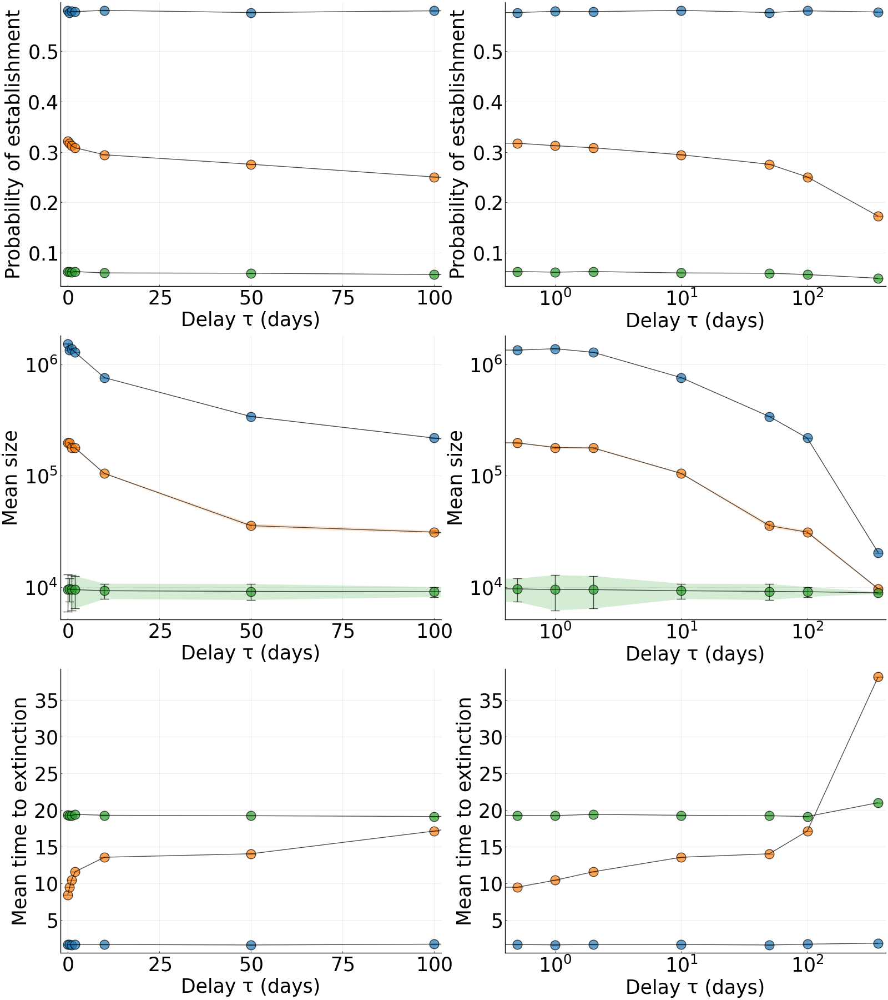

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

In [5]:
#plot for β₃
l = @layout [a b; c d; e f]
delays = [0,0.5,1,2,10,50,100,365]

prob_success10n4 = [0.580016,0.576499,0.578837,0.578279,0.580816,0.576478,0.579891,0.577501]
prob_sigma10n4 = [0.493557,0.494116,0.493748,0.493837,0.493428,0.494119,0.493578,0.493959]
mean10n4 = [1.53191*10^6,1.34259*10^6,1.38166*10^6,1.28288*10^6,759544,340114,217968,20408.3]
mean_sigma10n4 = [1.13528*10^7,7.40251*10^6,1.08067*10^7,9.9858*10^6,4.75756*10^6,4.85713*10^6,3.0557*10^6,527350]
number_of_sims10n4 = [sqrt(256731),sqrt(106538),sqrt(105705),sqrt(105501),sqrt(105617),sqrt(114105),sqrt(121666),sqrt(143418)]
time10n4 = [1.64546,1.67286,1.62925,1.68716,1.68003,1.61089,1.71913,1.86218]
time_sigma10n4 =[7.9846,8.53064,8.04551,8.79182,8.63927,7.44698,8.66009,10.9508]

prob_success4t10n5 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma4t10n5 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean4t10n5 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma4t10n5 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims4t10n5 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time4t10n5 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma4t10n5 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]

prob_success10n5 = [0.0626245,0.0630946,0.0618317,0.0630908,0.0603281,0.0597871,0.0571256,0.0498191]
prob_sigma10n5 = [0.242287,0.243134,0.240851,0.243127,0.238095,0.237093,0.232084,0.217572]
mean10n5 = [9489.89,9626.14,9471.38,9471.57,9255.95,9130.65,9068.35,8862.56]
mean_sigma10n5 = [4057.02,5268.35,2538.75,4847.29,2827.06,2398.44,2381.86,2249.34]
number_of_sims10n5 = [sqrt(127490),sqrt(100595),sqrt(100434),sqrt(101140),sqrt(102357),sqrt(104454),sqrt(106257),sqrt(119934)]
time10n5 = [19.3006,19.2903,19.2524,19.4266,19.2971,19.2389,19.1301,21.0142]
time_sigma10n5 =[60.0717,60.0054,60.2217,60.0074,59.8518,59.5921,58.7898,61.7948]


prob_success = [prob_success10n4 prob_success4t10n5 prob_success10n5]
prob_sigma = [prob_sigma10n4/number_of_sims10n4 prob_sigma4t10n5/number_of_sims4t10n5 prob_sigma10n5/number_of_sims10n5]

mean = [mean10n4 mean4t10n5 mean10n5]
mean_sigma = [mean_sigma10n4/number_of_sims10n4 mean_sigma4t10n5/number_of_sims4t10n5 mean_sigma10n5/number_of_sims10n5]

time = [time10n4 time4t10n5 time10n5]
time_sigma = [time_sigma10n4/number_of_sims10n4 time_sigma4t10n5/number_of_sims4t10n5 time_sigma10n5/number_of_sims10n5]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel") 
p1 = plot!(delays,prob_success,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

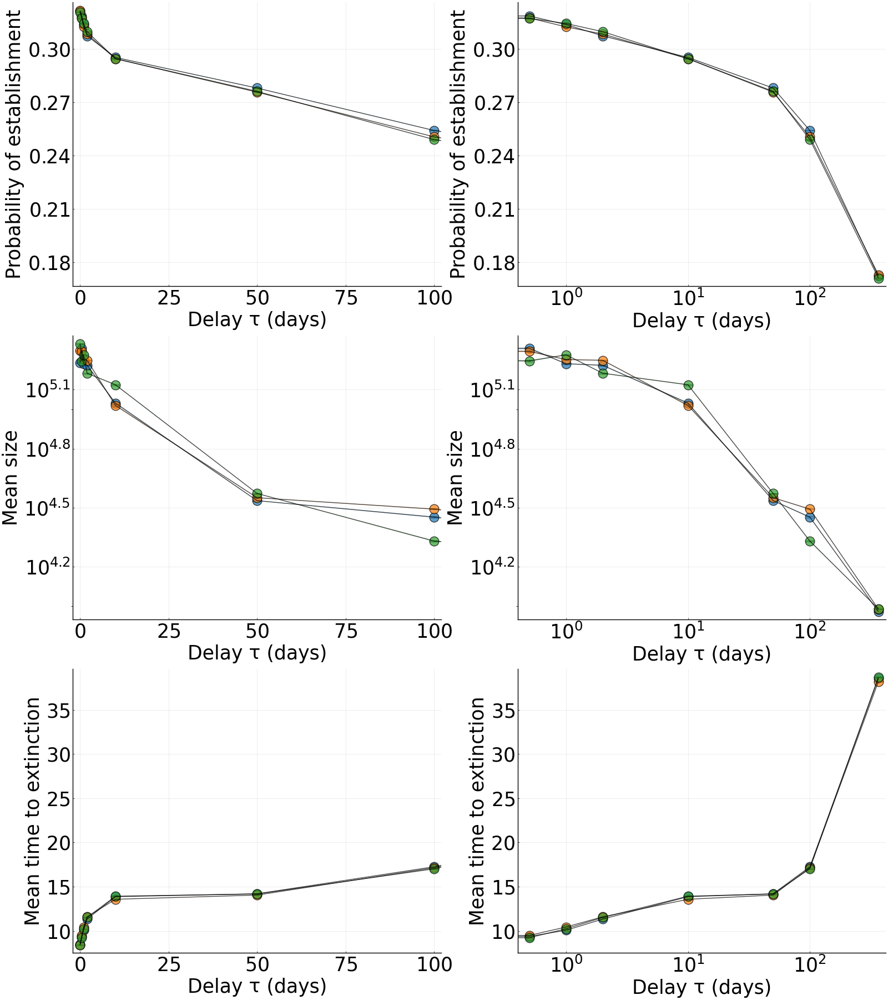

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may chan

In [6]:
#plot for β₄
l = @layout [a b; c d; e f]
delays = [0,0.5,1,2,10,50,100,365]

prob_success5t10n4 = [0.321253,0.318637,0.313757,0.307416,0.295281,0.278051,0.254158,0.172117]
prob_sigma5t10n4 = [0.466959,0.46595,0.464021,0.461425,0.456171,0.448041,0.435389,0.377483]
mean5t10n4 = [172414,204083,170563,167353,107548,34361.6,28335.5,9377.94]
mean_sigma5t10n4 = [3.2732*10^6,6.77102*10^6,2.42371*10^6,2.44056*10^6,2.74728*10^6,323682,609004,2387.1]
number_of_sims5t10n4 = [sqrt(217738),sqrt(124518),sqrt(125441),sqrt(124395),sqrt(125589),sqrt(127980),sqrt(129805),sqrt(146017)]
time5t10n4 = [8.46267,9.37942,10.072,11.3366,13.8726,14.1926,17.2497,38.5379]
time_sigma5t10n4 =[39.0201,41.382,43.2191,46.4694,51.5219,48.7865,50.8526,83.7162]

prob_success10n4 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma10n4 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean10n4 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma10n4 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims10n4 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time10n4 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma10n4 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]

prob_success5t10n5 = [0.320807,0.317287,0.314393,0.309786,0.294581,0.276185,0.249058,0.171064]
prob_sigma5t10n5 = [0.466787,0.465423,0.464276,0.462408,0.455856,0.447112,0.43247,0.376566]
mean5t10n5 = [214865,176308,189249,152551,133333,37374.8,21412,9684.41]
mean_sigma5t10n5 = [5.89724*10^6,2.21887*10^6,3.03558*10^6,1.87603*10^6,3.96456*10^6,548492,194234,2452.99]
number_of_sims5t10n5 = [sqrt(431599),sqrt(102144),sqrt(101599),sqrt(100876),sqrt(101439),sqrt(102663),sqrt(106449),sqrt(118903)]
time5t10n5 = [8.42075,9.23028,10.2403,11.52,13.9203,14.1769,17.0167,38.684]
time_sigma5t10n5 =[38.8021,40.6315,43.6771,46.7931,51.5811,48.3473,49.916,84.0469]


prob_success = [prob_success5t10n4 prob_success10n4 prob_success5t10n5]
prob_sigma = [prob_sigma5t10n4/number_of_sims5t10n4 prob_sigma10n4/number_of_sims10n4 prob_sigma5t10n5/number_of_sims5t10n5]

mean = [mean5t10n4 mean10n4 mean5t10n5]
mean_sigma = [mean_sigma5t10n4/number_of_sims5t10n4 mean_sigma10n4/number_of_sims10n4 mean_sigma5t10n5/number_of_sims5t10n5]

time = [time5t10n4 time10n4 time5t10n5]
time_sigma = [time_sigma5t10n4/number_of_sims5t10n4 time_sigma10n4/number_of_sims10n4 time_sigma5t10n5/number_of_sims5t10n5]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passe

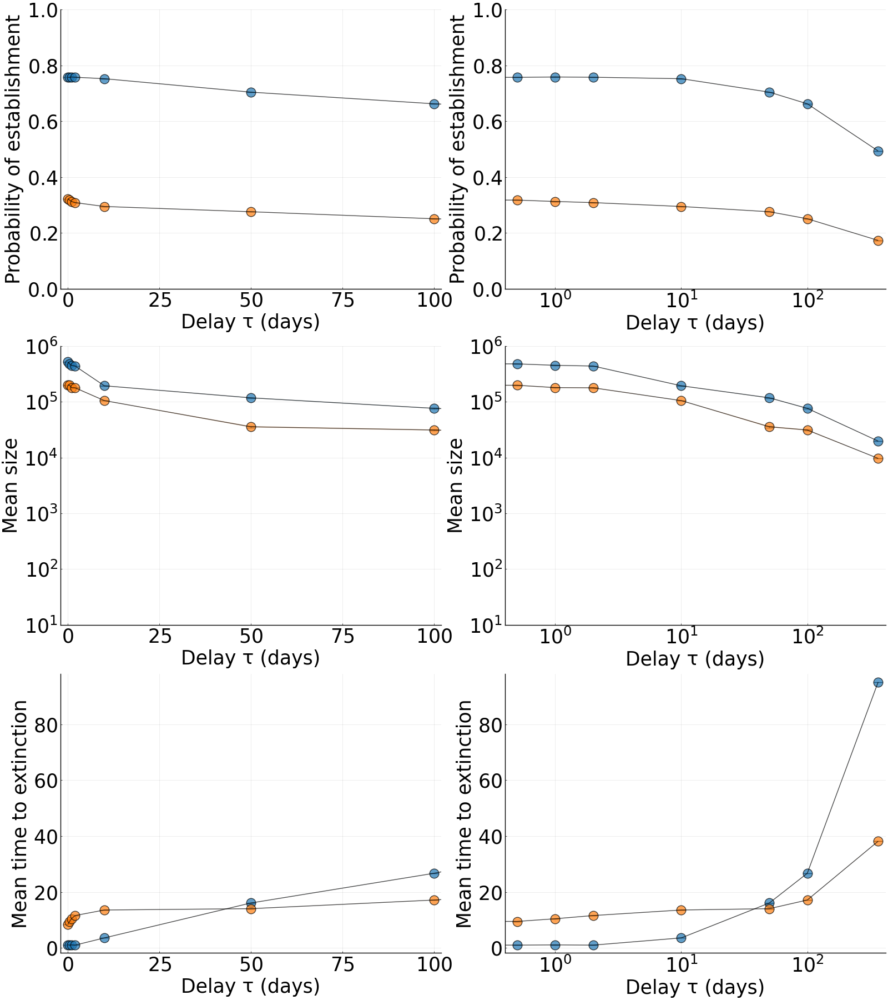

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [7]:
#plot for CTL-dominated
l = @layout [a b; c d; e f]
l2 = @layout [a b; c d]
delays = [0,0.5,1,2,10,50,100,365]

prob_success150 = [0.757593,0.757546,0.758791,0.757871,0.75265,0.704438,0.662728,0.493531]
prob_sigma150 = [0.42854,0.428569,0.427818,0.428374,0.431474,0.456297,0.472781,0.49996]
mean150 = [517998.,476629.,449186.,436103.,193025.,117412.,76132.7,19699.3]
mean_sigma150 = [6.88998*10^6,6.34356*10^6,6.07141*10^6,7.74707*10^6,1.76635*10^6,3.48508*10^6,2.31178*10^6,75003.6]
number_of_sims150 = [sqrt(217832),sqrt(119540),sqrt(116849),sqrt(115930),sqrt(117546),sqrt(119298),sqrt(121261),sqrt(132403)]
time150 = [1.12585,1.01272,1.0919,1.0097,3.5922,16.0783,26.7014,95.1018]
time_sigma150 =[8.91705,7.13165,8.28254,7.09609,25.1213,47.7336,54.0607,115.087]

prob_success100 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma100 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean100 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma100 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims100 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time100 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma100 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]


prob_success = [prob_success150 prob_success100]
prob_sigma = [prob_sigma150/number_of_sims150 prob_sigma100/number_of_sims100]

mean = [mean150 mean100]
mean_sigma = [mean_sigma150/number_of_sims150 mean_sigma100/number_of_sims100]

time = [time150 time100]
time_sigma = [time_sigma150/number_of_sims150 time_sigma100/number_of_sims100]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-2,102),ylims = (0,1),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-2,102),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),ylims = (10^1,10^6),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,grid=true,color = "Black",alpha=0.7,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),ylims = (0,1),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),ylims = (10^1,10^6),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p1, p2, p3, p4, p5, p6, layout = l,size =(1600,1800),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

# Figures 5, S14, and S15

In [1]:
using Turing, Distributions, DifferentialEquations
using MCMCChains, Plots, StatsPlots
using Plots; pyplot()

using Random
Random.seed!(14);

logocolors = Colors.JULIA_LOGO_COLORS

In [2]:
color1 = RGBA(113/255,46/255,103/255,1)
color2 = RGBA(38/255,117/255,146/255,1)
color3 = RGBA(95/255,177/255,42/255,1)
color4 = RGBA(199/255,200/255,0/255,1)
color5 = RGBA(255/255,121/255,23/255,1)
color6 = RGBA(226/255,58/255,52/255,1)

## Data

In [3]:
#tumor data
time_1 = [0.0,39.0,82.0,124.0,165.0,249.0,277.0,292.0,334.0]

tumor_1 = [24565000000.0,29160000000.0,20480000000.0,3645000000.0,2560000000.0,3645000000.0,1715000000.0,1715000000.0,1715000000.0]
for i = 2:convert(Int64, length(tumor_1))
    tumor_1[i] = (tumor_1[i]-tumor_1[1])./tumor_1[1]
end
tumor_1[1] = 0.0


time_2 = [0.0,43.0,84.0,127.0,169.0,211.0,253.0,295.0,344.0]

tumor_2 = [5.5296E+11,1.9652E+11,1.9652E+11,1.9652E+11,1.0976E+11,78125000000.0,78125000000.0,87880000000.0,1.0976E+11]
for i = 2:convert(Int64, length(tumor_2))
    tumor_2[i] = (tumor_2[i]-tumor_2[1])./tumor_2[1]
end
tumor_2[1] = 0.0


time_3 = [0.0,41.0,83.0,125.0,167.0,210.0,251.0,293.0,334.0,442.0,377.0]

tumor_3 = [1.37313E+12,1.37313E+12,4.8668E+11,4.8668E+11,3.2E+11,3.44605E+11,2.7436E+11,2.7436E+11,3.97535E+11,4.55625E+11,4.2592E+11]
for i = 2:convert(Int64, length(tumor_3))
    tumor_3[i] = (tumor_3[i]-tumor_3[1])./tumor_3[1]
end
tumor_3[1] = 0.0

time_4 = [0.0,42.0,84.0,127.0,169.0,211.0,253.0]

tumor_4 = [3.2E+11,2.96595E+11,2.14375E+11,2.14375E+11,3.2E+11,3.2E+11,3.44605E+11]
for i = 2:convert(Int64, length(tumor_4))
    tumor_4[i] = (tumor_4[i]-tumor_4[1])./tumor_4[1]
end
tumor_4[1] = 0.0

time_5 = [0.0,41.0,83.0,125.0,167.0,210.0,251.0,293.0,335.0,393.0,461.0]

tumor_5 = [1.0976E+11,1.0976E+11,1.35E+11,1.79685E+11,1.79685E+11,2.7436E+11,3.44605E+11,3.7044E+11,4.8668E+11,5.5296E+11,5.5296E+11]
for i = 2:convert(Int64, length(tumor_5))
    tumor_5[i] = (tumor_5[i]-tumor_5[1])./tumor_5[1]
end
tumor_5[1] = 0.0

time_6 = [0.0,55.0,90.0,118.0,167.0]

tumor_6 = [3.97535E+11,5.19115E+11,6.25E+11,6.25E+11,1.37313E+12]
for i = 2:convert(Int64, length(tumor_6))
    tumor_6[i] = (tumor_6[i]-tumor_6[1])./tumor_6[1]
end
tumor_6[1] = 0.0

0.0

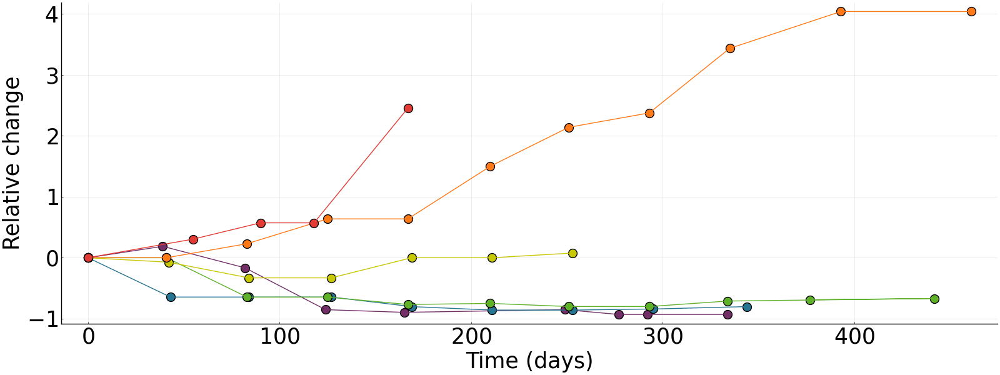

In [4]:
#plot tumor data relative change
scatter()
scatter!(time_1, tumor_1, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color1, color1],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_1, tumor_1, size =(1600,600), font = "Ariel", color = color1, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_2, tumor_2, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color2, color2],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_2, tumor_2, size =(1600,600), font = "Ariel", color = color2, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_3, tumor_3, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color3, color3],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_3, tumor_3, size =(1600,600), font = "Ariel", color = color3, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_4, tumor_4, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color4, color4],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_4, tumor_4, size =(1600,600), font = "Ariel", color = color4, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_5, tumor_5, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color5, color5],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_5, tumor_5, size =(1600,600), font = "Ariel", color = color5, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_6, tumor_6, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color6, color6],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_6, tumor_6, size =(1600,600), font = "Ariel", color = color6, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

In [5]:
#remove first data point from each tumor (baseline)
popfirst!(tumor_1)
popfirst!(time_1)
popfirst!(tumor_2)
popfirst!(time_2)
popfirst!(tumor_3)
popfirst!(time_3)
popfirst!(tumor_4)
popfirst!(time_4)
popfirst!(tumor_5)
popfirst!(time_5)
popfirst!(tumor_6)
popfirst!(time_6)

0.0

In [6]:
tumor_1

8-element Vector{Float64}:
  0.18705475269692654
 -0.16629350702218604
 -0.8516181559128841
 -0.8957866883777732
 -0.8516181559128841
 -0.9301852228780786
 -0.9301852228780786
 -0.9301852228780786

In [7]:
tumor_2

8-element Vector{Float64}:
 -0.6446035879629629
 -0.6446035879629629
 -0.6446035879629629
 -0.8015046296296297
 -0.8587149160879629
 -0.8587149160879629
 -0.8410734953703703
 -0.8015046296296297

In [8]:
tumor_3

10-element Vector{Float64}:
  0.0
 -0.6455688827714783
 -0.6455688827714783
 -0.7669557871432421
 -0.7490368719640529
 -0.8001937180019372
 -0.8001937180019372
 -0.7104899026312148
 -0.6681850953660615
 -0.6898181526876552

In [9]:
tumor_4

6-element Vector{Float64}:
 -0.073140625
 -0.330078125
 -0.330078125
  0.0
  0.0
  0.076890625

In [10]:
tumor_5

10-element Vector{Float64}:
 0.0
 0.22995626822157433
 0.6370717930029155
 0.6370717930029155
 1.4996355685131195
 2.1396228134110786
 2.375
 3.434037900874636
 4.037900874635569
 4.037900874635569

In [11]:
tumor_6

4-element Vector{Float64}:
 0.30583470637805477
 0.5721886123234432
 0.5721886123234432
 2.4541109587835033

## Model

In [12]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    β₃, α₆, α₁ = p 
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(max(η/T,1)) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [13]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

In [14]:
#define condition for simulation to end
function condition(u,t,integrator) 
  u[1] < 0.0 || u[2] < 0.0 || u[3] < 0.0 || u[4] < 0.0
end

floor_event = DiscreteCallback(condition, terminate!)

DiscreteCallback{typeof(condition), typeof(terminate!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, SciMLBase.terminate!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

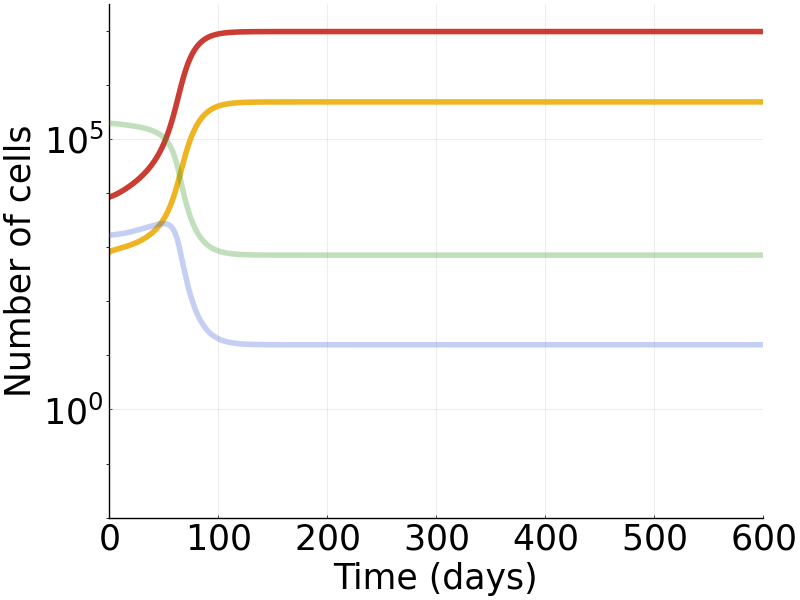

In [15]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size 
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #(10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

tspan = (0.0,600.0)
u0 = [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226] 

prob1 = ODEProblem(ode_system,u0,tspan,p)
sol = solve(prob1,alg,saveat=0.1,callback=floor_event)
plot(sol, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

In [16]:
sol

retcode: Success
Interpolation: 1st order linear
t: 6001-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 598.9
 599.0
 599.1
 599.2
 599.3
 599.4
 599.5
 599.6
 599.7
 599.8
 599.9
 600.0
u: 6001-element Vector{Vector{Float64}}:
 [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226]
 [8409.322769759292, 806.3689447928673, 197515.62561503315, 1656.0451022156317]
 [8423.310448374805, 808.635158137783, 197464.07266011802, 1657.6435846504921]
 [8437.335287298156, 810.8703643080235, 197411.12639749824, 1659.2143607493174]
 [8451.401343192872, 813.0752158872804, 197356.82223281093, 1660.7580832581473]
 [8465.512475445648, 815.25035630204, 197301.1945533594, 1662.2754096788485]
 [8479.672443673388, 817.3964203029312, 197244.27705712392, 1663.7669929953026]
 [8493.884911492849, 819.5140339769426, 197186.1027652246, 1665.233481314969]
 [8508.153446520653, 821.6038147474236, 197126.70402192144, 166

## Fitting

In [17]:
Threads.nthreads()

10

In [18]:
#set model parameters
η = 10.0^(5.0)
η

100000.0

In [19]:
time_to_fit1 = time_1
tumor_to_fit1 = tumor_1
tumor_curve_fit1 = zeros(length(tumor_to_fit1))
for i = 1:convert(Int64, length(tumor_to_fit1))
    tumor_curve_fit1[i] = tumor_to_fit1[i].*u0[1]+u0[1]
end

In [20]:
#fit tumor 1
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit1))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit1.+1), prob1) 

@time chain1 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

186.899811 seconds (7.78 G allocations: 349.428 GiB, 37.17% gc time, 0.77% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 160.16 seconds
Compute duration  = 594.29 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0000     0.0000    0.0000    134.2996    1.0500    ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   1038.4587    1.0022    ⋯
          α₁    0.1831    0.0621     0.0007    0.0032    295.5692    1.0242    ⋯
           σ    1.2604    0.3653     0.0041    0.0127    848.1813    1.0053    ⋯
                                                        

In [21]:
time_to_fit2 = time_2
tumor_to_fit2 = tumor_2
tumor_curve_fit2 = zeros(length(tumor_to_fit2))
for i = 1:convert(Int64, length(tumor_to_fit2))
    tumor_curve_fit2[i] = tumor_to_fit2[i].*u0[1]+u0[1]
end

In [22]:
#fit tumor 2
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit2,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit2)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ)
    end

end

model = fitlv(log.(tumor_curve_fit2.+1), prob1) 

@time chain2 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

176.846332 seconds (9.34 G allocations: 420.943 GiB, 46.43% gc time, 2.26% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 174.62 seconds
Compute duration  = 610.21 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0000    0.0000     0.0000    0.0000    69.4970    1.1038     ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   186.9900    1.0303     ⋯
          α₁    0.1983    0.0579     0.0006    0.0038    74.4383    1.0998     ⋯
           σ    0.6269    0.2059     0.0023    0.0080   512.3875    1.0141     ⋯
                                                        

In [23]:
time_to_fit3 = time_3
tumor_to_fit3 = tumor_3
tumor_curve_fit3 = zeros(length(tumor_to_fit3))
for i = 1:convert(Int64, length(tumor_to_fit3))
    tumor_curve_fit3[i] = tumor_to_fit3[i].*u0[1]+u0[1]
end

In [24]:
#fit tumor 3
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit3,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    

    for i = 1:min(length(predicted),length(tumor_curve_fit3))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ)
    end

end

model = fitlv(log.(tumor_curve_fit3.+1), prob1) 

@time chain3 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

144.337625 seconds (7.79 G allocations: 351.196 GiB, 48.12% gc time, 0.32% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 142.25 seconds
Compute duration  = 519.37 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0000    0.0000     0.0000    0.0000    26.3260    1.2596     ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   403.2909    1.0160     ⋯
          α₁    0.2445    0.0553     0.0006    0.0043    45.2368    1.1534     ⋯
           σ    0.5874    0.1743     0.0019    0.0065   470.8223    1.0087     ⋯
                                                        

In [25]:
time_to_fit4 = time_4
tumor_to_fit4 = tumor_4
tumor_curve_fit4 = zeros(length(tumor_to_fit4))
for i = 1:convert(Int64, length(tumor_to_fit4))
    tumor_curve_fit4[i] = tumor_to_fit4[i].*u0[1]+u0[1]
end

In [26]:
#fit tumor 4
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit4,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    

    for i = 1:min(length(predicted),length(tumor_curve_fit4))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit4.+1), prob1) 

@time chain4 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

166.250498 seconds (9.38 G allocations: 422.107 GiB, 49.65% gc time, 0.21% compilation time)


┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 163.92 seconds
Compute duration  = 627.76 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0000    0.0000     0.0000    0.0000   143.2385    1.0567     ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   698.1826    1.0104     ⋯
          α₁    0.3076    0.0878     0.0010    0.0049   198.5748    1.0383     ⋯
           σ    0.6254    0.2642     0.0030    0.0085   809.7071    1.0049     ⋯
                                                        

In [27]:
time_to_fit5 = time_5
tumor_to_fit5 = tumor_5
tumor_curve_fit5 = zeros(length(tumor_to_fit5))
for i = 1:convert(Int64, length(tumor_to_fit5))
    tumor_curve_fit5[i] = tumor_to_fit5[i].*u0[1]+u0[1]
end

In [28]:
#fit tumor 5
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit5,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit5)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit5.+1), prob1) 

@time chain5 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

882.572159 seconds (42.03 G allocations: 1.844 TiB, 42.78% gc time, 0.37% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 880.46 seconds
Compute duration  = 2391.81 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0001    0.0001     0.0000    0.0000    70.3306    1.1203     ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   108.1441    1.0430     ⋯
          α₁    0.1469    0.0763     0.0009    0.0044   149.0889    1.0541     ⋯
           σ    0.4832    0.1675     0.0019    0.0113    67.2579    1.0995     ⋯
                                                       

In [29]:
time_to_fit6 = time_6
tumor_to_fit6 = tumor_6
tumor_curve_fit6 = zeros(length(tumor_to_fit6))
for i = 1:convert(Int64, length(tumor_to_fit6))
    tumor_curve_fit6[i] = tumor_to_fit6[i].*u0[1]+u0[1]
end

In [30]:
#fit tumor 6
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(1.1*(10.0^(-7.0)),(10.0^(-6.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit6,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit6)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit6.+1), prob1) 

@time chain6 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ

186.948302 seconds (10.85 G allocations: 487.306 GiB, 49.70% gc time, 0.79% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 184.6 seconds
Compute duration  = 680.06 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0001    0.0001     0.0000    0.0000    83.4850    1.0518     ⋯
          α₆    0.0000    0.0000     0.0000    0.0000   393.6948    1.0151     ⋯
          α₁    0.2848    0.1400     0.0016    0.0079   161.5829    1.0209     ⋯
           σ    0.9699    0.5176     0.0058    0.0218   427.3437    1.0108     ⋯
                                                         

In [31]:
chain_array1 = Array(chain1)

8000×4 Matrix{Float64}:
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.29946e-5   2.10943e-6  0.176301   0.752733
 1.58281e-5   2.10845e-7  0.242809   1.82758
 5.64313e-5   1.50173e-7  0.166916   1.79634
 2.40292e-5   1.26298e-6  0.206887   0.802493
 2.69279e-5   1.14013e-6  0.186087   0.704485
 2.69279e-5   1.14013e-6  0.186087   0.704485
 2.2116e-5    1.07242e-6  0.225123   0.738009
 1.84771e-5   1.1237e-6   0.213507   0.78163
 9.40612e-6   8.49477e-7  0.265379   0.881263
 0.000137032  3.35371e-7  0.0932123  1.60106
 ⋮                                   
 1.69732e-5   2.43659e-7  0.225224   1.30469
 2.04296e-5   2.43794e-7  0.224482   1.48532
 3.10426e-5   2.32678e-6  0.199008   1.22495
 4.10224e-5   1.17823e-6  0.183342   1.1494
 4.10224e-5   1.17823e-6  0.183342   1.1494
 4.72168e-5   1.4685e-6   0.198087   1.16461
 6.58575e-5   1.90817e-6  0.134953   1.29381
 1.45767e-5   6.7144e-7   0.208

In [32]:
chain_array2 = Array(chain2)

8000×4 Matrix{Float64}:
 3.82964e-6  5.51914e-7  0.274151  0.503267
 5.12467e-6  6.97341e-7  0.274454  0.42027
 5.15537e-6  1.63055e-6  0.267618  0.276569
 5.88694e-6  1.54578e-6  0.272227  0.266146
 2.0422e-5   9.04879e-7  0.216765  0.865787
 3.60358e-5  1.04323e-6  0.209354  0.828115
 1.55046e-5  1.18196e-6  0.234685  0.714841
 1.31194e-5  2.74155e-7  0.23784   0.576391
 1.1872e-5   2.07256e-7  0.26757   0.692903
 4.82031e-6  1.09535e-7  0.281983  0.593645
 4.10217e-6  2.00183e-7  0.267787  0.725505
 7.10128e-6  1.85627e-7  0.289839  0.703563
 5.16602e-6  4.07685e-7  0.312937  0.799902
 ⋮                                 
 2.4154e-6   9.96031e-8  0.265693  0.598515
 2.18111e-5  9.00196e-7  0.240458  0.530755
 1.00706e-5  1.11909e-6  0.248382  0.563218
 2.93481e-5  3.59013e-7  0.210768  0.763753
 1.61588e-5  3.53394e-7  0.240912  0.459259
 1.81478e-5  4.87943e-7  0.24481   0.49928
 3.13779e-5  1.18419e-6  0.202635  0.543739
 1.249e-5    8.13968e-7  0.254513  0.568569
 2.2233e-5   1.295

In [33]:
chain_array3 = Array(chain3)

8000×4 Matrix{Float64}:
 1.82131e-5  6.56033e-7  0.251899  0.472708
 1.94797e-5  7.76076e-7  0.251319  0.504366
 9.81877e-6  3.19696e-7  0.285703  0.69244
 5.55685e-6  3.23857e-7  0.303336  0.635017
 2.78542e-6  5.43107e-7  0.299173  0.737113
 6.97255e-6  9.71855e-7  0.285736  0.337761
 3.19648e-5  4.55656e-7  0.208416  0.829533
 3.72037e-5  1.6691e-6   0.214284  0.801961
 4.05048e-5  1.98917e-6  0.224243  0.67773
 3.03045e-5  2.31192e-6  0.218683  0.692326
 3.6567e-5   1.16002e-6  0.20223   0.678311
 3.6567e-5   1.16002e-6  0.20223   0.678311
 3.85256e-5  9.04023e-7  0.196264  0.705812
 ⋮                                 
 2.68393e-5  1.39008e-6  0.228681  0.554637
 2.68393e-5  1.39008e-6  0.228681  0.554637
 2.68393e-5  1.39008e-6  0.228681  0.554637
 2.28211e-5  1.45721e-6  0.227919  0.543603
 2.40154e-5  1.30457e-6  0.232835  0.531135
 2.72909e-5  1.62337e-6  0.225692  0.577202
 2.72909e-5  1.62337e-6  0.225692  0.577202
 2.72909e-5  1.62337e-6  0.225692  0.577202
 3.17416e-5  1.268

In [34]:
chain_array4 = Array(chain4)

8000×4 Matrix{Float64}:
 1.83368e-5   3.03861e-7  0.333751   0.37736
 1.06142e-5   6.28187e-7  0.375815   0.410058
 1.28002e-5   4.95465e-7  0.347222   0.535608
 0.00012568   2.66764e-7  0.131046   1.17156
 0.000111563  9.89723e-7  0.144136   1.31821
 9.6274e-5    9.82344e-7  0.133416   1.56136
 0.00012406   1.09036e-6  0.12306    1.49765
 0.000191606  1.01577e-6  0.093575   1.25137
 0.000191606  1.01577e-6  0.093575   1.25137
 0.000190569  5.94994e-7  0.0868428  1.25015
 0.000190569  5.94994e-7  0.0868428  1.25015
 0.000198877  4.60906e-7  0.0886094  1.1605
 0.000198877  4.60906e-7  0.0886094  1.1605
 ⋮                                   
 2.91681e-5   1.45934e-6  0.316092   0.859179
 3.64784e-5   1.39934e-6  0.312887   0.897554
 1.03551e-5   8.55653e-7  0.375472   0.616572
 4.6785e-9    8.70563e-7  0.494022   0.478005
 1.31892e-8   2.4221e-6   0.445858   0.5548
 1.82355e-8   2.15398e-6  0.438348   0.545581
 3.94896e-8   4.69173e-7  0.480989   0.391521
 1.41174e-7   1.90873e-6  0.49295

In [35]:
chain_array5 = Array(chain5)

8000×4 Matrix{Float64}:
 0.000170071  3.08871e-7  0.268091   1.89727
 7.63102e-5   2.15321e-6  0.249269   0.773279
 1.62602e-5   1.60324e-7  0.566245   0.786559
 5.72052e-6   3.04914e-7  0.610865   0.644507
 0.000184688  2.06056e-7  0.102499   0.664818
 0.000184688  2.06056e-7  0.102499   0.664818
 0.000179936  2.40929e-7  0.103137   0.650437
 0.000179936  2.40929e-7  0.103137   0.650437
 0.00018791   3.37499e-7  0.105354   0.643215
 0.000181267  3.3249e-7   0.10247    0.649294
 0.000179973  3.95743e-7  0.102488   0.660054
 0.00017538   3.79186e-7  0.105182   0.664675
 0.00017538   3.79186e-7  0.105182   0.664675
 ⋮                                   
 0.000131928  2.80299e-7  0.134524   0.467474
 0.00015336   3.9909e-7   0.119221   0.343164
 0.000143609  4.49183e-7  0.122852   0.515013
 0.000149831  1.54287e-7  0.123834   0.425089
 0.000150439  1.78166e-7  0.118519   0.506611
 0.00014548   9.4631e-8   0.122615   0.45007
 0.000144096  1.16976e-7  0.127276   0.452877
 0.000125803  8.2680

In [36]:
chain_array6 = Array(chain6)

8000×4 Matrix{Float64}:
 0.000132044  5.26893e-7  0.138348  0.494975
 0.000132044  5.26893e-7  0.138348  0.494975
 0.000132044  5.26893e-7  0.138348  0.494975
 0.000132044  5.26893e-7  0.138348  0.494975
 0.000132044  5.26893e-7  0.138348  0.494975
 0.000132601  6.11687e-7  0.13375   0.503566
 0.000132601  6.11687e-7  0.13375   0.503566
 0.000140381  6.96904e-7  0.130277  0.459694
 0.000140381  6.96904e-7  0.130277  0.459694
 0.000140381  6.96904e-7  0.130277  0.459694
 0.00014428   6.06371e-7  0.129576  0.466323
 0.00014428   6.06371e-7  0.129576  0.466323
 0.00014428   6.06371e-7  0.129576  0.466323
 ⋮                                  
 1.63483e-5   1.42489e-7  0.501168  1.35753
 3.62294e-6   1.65117e-7  0.269376  2.20695
 7.65781e-6   1.08025e-6  0.455195  1.28679
 0.000158031  1.6002e-6   0.218611  1.83002
 3.34379e-5   2.1601e-7   0.320412  1.78323
 0.000161916  2.57075e-7  0.284502  1.57391
 2.68078e-5   5.66314e-7  0.412027  0.885313
 3.73406e-5   6.4431e-7   0.351212  0.755542


## Plot

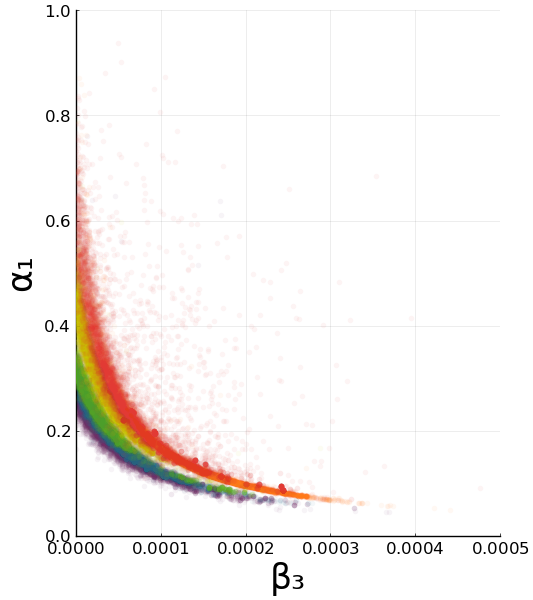

In [37]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,1], chain_array1[:,3], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,1], chain_array2[:,3], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,1], chain_array3[:,3], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,1], chain_array4[:,3], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,1], chain_array5[:,3], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,1], chain_array6[:,3], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

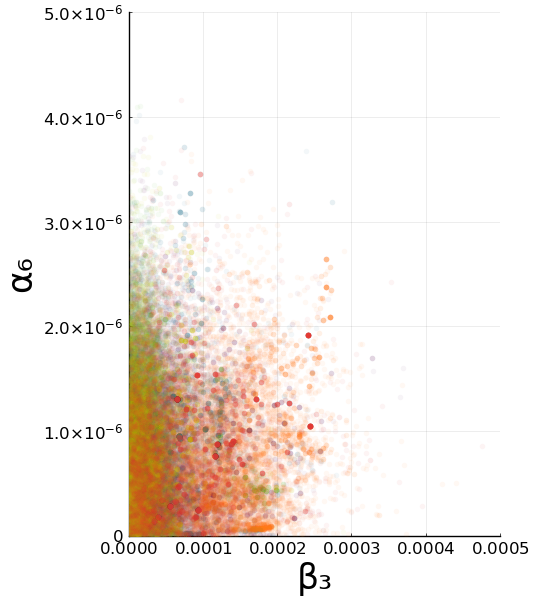

In [38]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,1], chain_array1[:,2], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,1], chain_array2[:,2], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,1], chain_array3[:,2], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,1], chain_array4[:,2], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,1], chain_array5[:,2], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,1], chain_array6[:,2], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,5*10^(-6)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

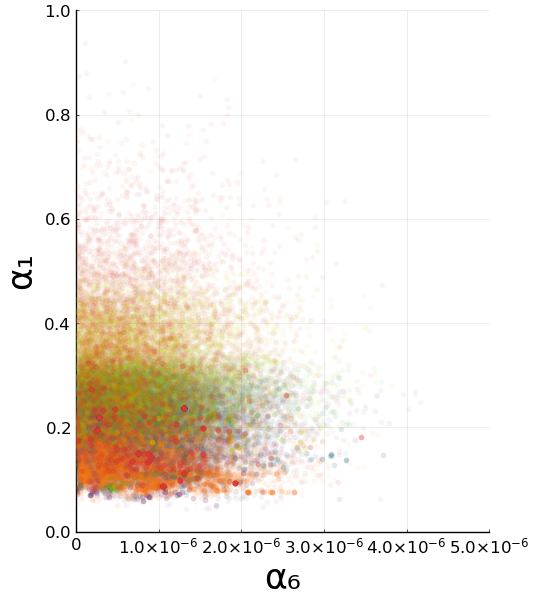

In [39]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,2], chain_array1[:,3], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,2], chain_array2[:,3], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,2], chain_array3[:,3], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,2], chain_array4[:,3], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,2], chain_array5[:,3], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,2], chain_array6[:,3], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,5*10^(-6)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

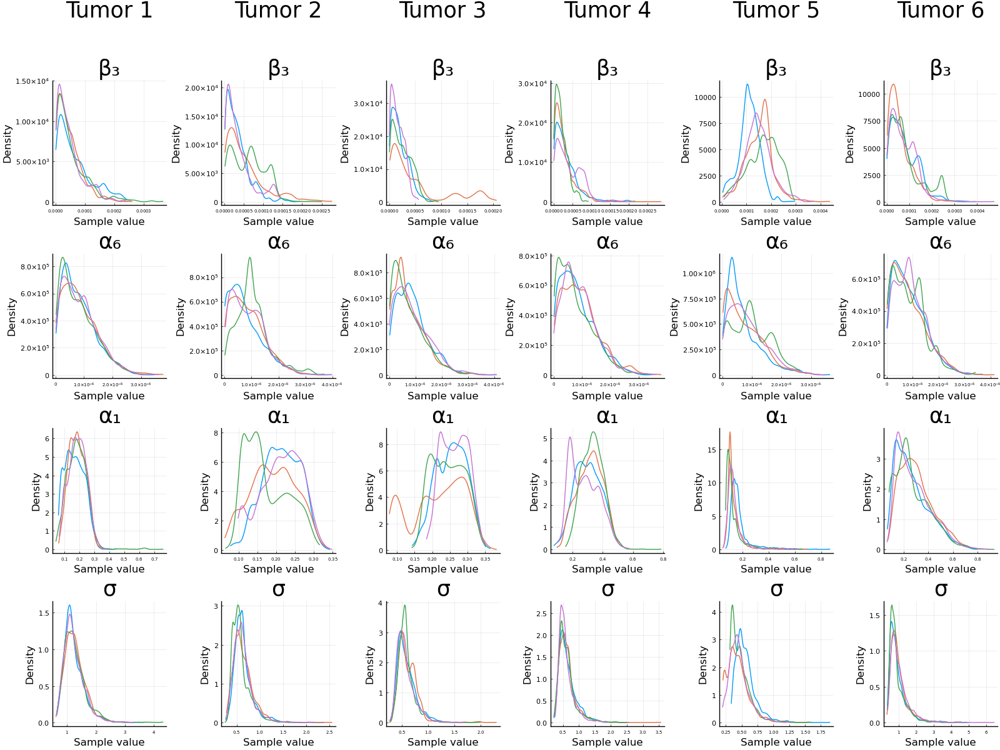

In [40]:
#plot MCMCs
l = @layout [a b c d e f]
a = mixeddensity(chain1, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 1", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
b = mixeddensity(chain2, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 2", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
c = mixeddensity(chain3, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 3", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
d = mixeddensity(chain4, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 4", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
e = mixeddensity(chain5, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 5", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
f = mixeddensity(chain6, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 6", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
plot(a, b, c, d, e, f, layout = l, size =(1600,1200), plot_title ="", titlefontsize=25)

In [41]:
#plot
plot()
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

η = 10.0^(5.0) #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

u0 = [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226]

β₃ = mean(chain_array1[:,1]) 
α₆ = mean(chain_array1[:,2]) 
α₁ = mean(chain_array1[:,3]) 
tspan = (0.0,last(time_to_fit1)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth1 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array2[:,1]) 
α₆ = mean(chain_array2[:,2]) 
α₁ = mean(chain_array2[:,3]) 
tspan = (0.0,last(time_to_fit2)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth2 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array3[:,1]) 
α₆ = mean(chain_array3[:,2]) 
α₁ = mean(chain_array3[:,3]) 
tspan = (0.0,last(time_to_fit3)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth3 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array4[:,1]) 
α₆ = mean(chain_array4[:,2]) 
α₁ = mean(chain_array4[:,3]) 
tspan = (0.0,last(time_to_fit4)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth4 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array5[:,1]) 
α₆ = mean(chain_array5[:,2]) 
α₁ = mean(chain_array5[:,3])
tspan = (0.0,last(time_to_fit5)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth5 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array6[:,1]) 
α₆ = mean(chain_array6[:,2]) 
α₁ = mean(chain_array6[:,3]) 
tspan = (0.0,last(time_to_fit6)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth6 = solve(probplot,alg,saveat=0.1,callback=floor_event)

retcode: Success
Interpolation: 1st order linear
t: 1871-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 185.9
 186.0
 186.1
 186.2
 186.3
 186.4
 186.5
 186.6
 186.7
 186.8
 186.9
 187.0
u: 1871-element Vector{Vector{Float64}}:
 [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226]
 [8407.72679015122, 806.3680433426503, 196989.41423906691, 1782.6758532738606]
 [8421.41526212176, 808.6324428200985, 196415.55511910355, 1909.4105329796812]
 [8436.395935570024, 810.8662032517226, 195844.21125144433, 2034.6554154407008]
 [8452.632719524214, 813.0711876867949, 195275.4182209915, 2158.442636738379]
 [8470.090770495768, 815.2491920732468, 194709.2084698391, 2280.803463207159]
 [8488.736488080021, 817.4019455138583, 194145.61131357038, 2401.768293799743]
 [8508.5375149562, 819.5311102662587, 193584.65294125798, 2521.3666600870993]
 [8529.46273688743, 821.6382817429259, 193026.35641546393, 2639.62

In [42]:
#plot
plot()
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

η = 10.0^(5.0) #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

u0 = [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226]

β₃ = median(chain_array1[:,1]) 
α₆ = median(chain_array1[:,2]) 
α₁ = median(chain_array1[:,3]) 
tspan = (0.0,last(time_to_fit1)+20)
p = (β₃, α₆, α₁)
probplot1 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth1 = solve(probplot1,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array2[:,1]) 
α₆ = median(chain_array2[:,2]) 
α₁ = median(chain_array2[:,3]) 
tspan = (0.0,last(time_to_fit2)+20)
p = (β₃, α₆, α₁)
probplot2 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth2 = solve(probplot2,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array3[:,1]) 
α₆ = median(chain_array3[:,2]) 
α₁ = median(chain_array3[:,3]) 
tspan = (0.0,last(time_to_fit3)+20)
p = (β₃, α₆, α₁)
probplot3 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth3 = solve(probplot3,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array4[:,1]) 
α₆ = median(chain_array4[:,2]) 
α₁ = median(chain_array4[:,3]) 
tspan = (0.0,last(time_to_fit4)+20)
p = (β₃, α₆, α₁)
probplot4 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth4 = solve(probplot4,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array5[:,1]) 
α₆ = median(chain_array5[:,2]) 
α₁ = median(chain_array5[:,3])
tspan = (0.0,last(time_to_fit5)+20)
p = (β₃, α₆, α₁)
probplot5 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth5 = solve(probplot5,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array6[:,1]) 
α₆ = median(chain_array6[:,2]) 
α₁ = median(chain_array6[:,3]) 
tspan = (0.0,last(time_to_fit6)+20)
p = (β₃, α₆, α₁)
probplot6 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth6 = solve(probplot6,alg,saveat=0.1,callback=floor_event)

retcode: Success
Interpolation: 1st order linear
t: 1871-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 185.9
 186.0
 186.1
 186.2
 186.3
 186.4
 186.5
 186.6
 186.7
 186.8
 186.9
 187.0
u: 1871-element Vector{Vector{Float64}}:
 [8395.368084462818, 804.0710624094437, 197565.74910954377, 1654.4182572290226]
 [8343.636911897589, 806.33610276141, 197210.8350292142, 1766.176051120835]
 [8294.514852398954, 808.5063832398888, 196856.48568601065, 1875.7739297665903]
 [8247.900931016298, 810.5863111110486, 196502.81264482884, 1983.2727204937428]
 [8203.699051284864, 812.5801019470327, 196149.92055533052, 2088.7312804453495]
 [8161.817311066568, 814.4918056160334, 195797.90821359877, 2192.206702317316]
 [8122.1679862542505, 816.3253069405681, 195446.86858976266, 2293.7543195631924]
 [8084.667530771674, 818.0843256974799, 195096.88882799714, 2393.427706394178]
 [8049.236205362421, 819.7724324981891, 194748.05092778627, 24

In [43]:
time_to_fit_plot1 = append!([0.0],time_to_fit1) 
tumor_to_fit_plot1 = append!([0.0],tumor_to_fit1)

time_to_fit_plot2 = append!([0.0],time_to_fit2) 
tumor_to_fit_plot2 = append!([0.0],tumor_to_fit2) 

time_to_fit_plot3 = append!([0.0],time_to_fit3) 
tumor_to_fit_plot3 = append!([0.0],tumor_to_fit3) 

time_to_fit_plot4 = append!([0.0],time_to_fit4) 
tumor_to_fit_plot4 = append!([0.0],tumor_to_fit4) 

time_to_fit_plot5 = append!([0.0],time_to_fit5) 
tumor_to_fit_plot5 = append!([0.0],tumor_to_fit5) 

time_to_fit_plot6 = append!([0.0],time_to_fit6) 
tumor_to_fit_plot6 = append!([0.0],tumor_to_fit6) 

5-element Vector{Float64}:
 0.0
 0.30583470637805477
 0.5721886123234432
 0.5721886123234432
 2.4541109587835033

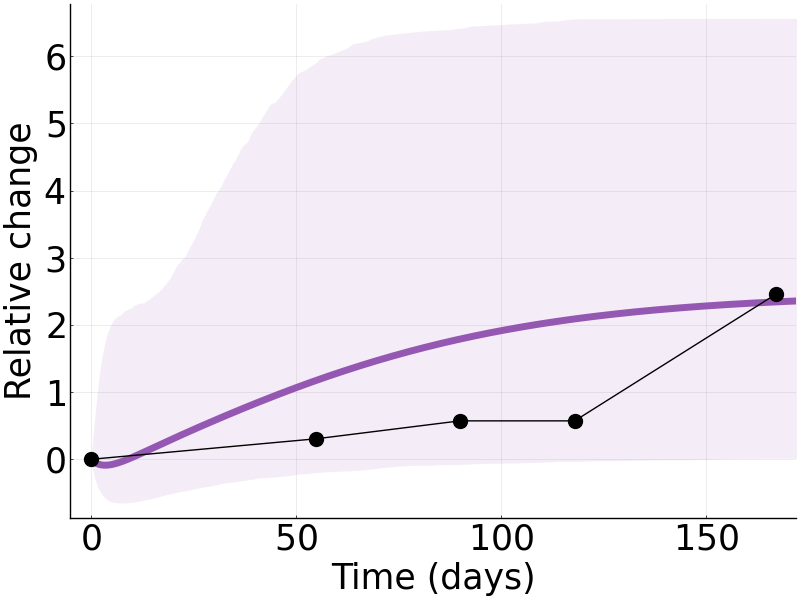

In [44]:
#plot fits
fig_layout = @layout [a b; c d; e f; g h; i j; k l]

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array1[rand(1:length(chain_array1[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
a = plot!(solplotsmooth1, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj1 = solve(remake(probplot1,p=chain_array1[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj1 = zeros(8000, length(traj1.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot1,p=chain_array1[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj1[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low1 = zeros(length(traj1.t))
interval_high1 = zeros(length(traj1.t))
for k in 1:length(interval_low1)
    interval_low1[k] = quantile(array_of_traj1[:,k], 0.05)
    interval_high1[k] = quantile(array_of_traj1[:,k], 0.95)
end

predicted_data1 = ones(length(solplotsmooth1)) 
for i = 1:convert(Int64, length(solplotsmooth1))
    predicted_data1[i] = (solplotsmooth1[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth1.t, predicted_data1, ribbon = (abs.(interval_low1-predicted_data1), abs.(interval_high1-predicted_data1)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot1, tumor_to_fit_plot1, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
b = scatter!(time_to_fit_plot1, tumor_to_fit_plot1, markersize = 10, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array2[rand(1:length(chain_array2[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
c = plot!(solplotsmooth2, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj2 = solve(remake(probplot2,p=chain_array2[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj2 = zeros(8000, length(traj2.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot2,p=chain_array2[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj2[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low2 = zeros(length(traj2.t))
interval_high2 = zeros(length(traj2.t))
for k in 1:length(interval_low2)
    interval_low2[k] = quantile(array_of_traj2[:,k], 0.05)
    interval_high2[k] = quantile(array_of_traj2[:,k], 0.95)
end

predicted_data2 = ones(length(solplotsmooth2)) 
for i = 1:convert(Int64, length(solplotsmooth2))
    predicted_data2[i] = (solplotsmooth2[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth2.t, predicted_data2, ribbon = (abs.(interval_low2-predicted_data2), abs.(interval_high2-predicted_data2)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot2, tumor_to_fit_plot2, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
d = scatter!(time_to_fit_plot2, tumor_to_fit_plot2, markersize = 10, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array3[rand(1:length(chain_array3[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
e = plot!(solplotsmooth3, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj3 = solve(remake(probplot3,p=chain_array3[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj3 = zeros(8000, length(traj3.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot3,p=chain_array3[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj3[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low3 = zeros(length(traj3.t))
interval_high3 = zeros(length(traj3.t))
for k in 1:length(interval_low3)
    interval_low3[k] = quantile(array_of_traj3[:,k], 0.05)
    interval_high3[k] = quantile(array_of_traj3[:,k], 0.95)
end

predicted_data3 = ones(length(solplotsmooth3)) 
for i = 1:convert(Int64, length(solplotsmooth3))
    predicted_data3[i] = (solplotsmooth3[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth3.t, predicted_data3, ribbon = (abs.(interval_low3-predicted_data3), abs.(interval_high3-predicted_data3)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot3, tumor_to_fit_plot3, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
f = scatter!(time_to_fit_plot3, tumor_to_fit_plot3, markersize = 10, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array4[rand(1:length(chain_array4[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
g = plot!(solplotsmooth4, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj4 = solve(remake(probplot4,p=chain_array4[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj4 = zeros(8000, length(traj4.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot4,p=chain_array4[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj4[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low4 = zeros(length(traj4.t))
interval_high4 = zeros(length(traj4.t))
for k in 1:length(interval_low4)
    interval_low4[k] = quantile(array_of_traj4[:,k], 0.05)
    interval_high4[k] = quantile(array_of_traj4[:,k], 0.95)
end

predicted_data4 = ones(length(solplotsmooth4)) 
for i = 1:convert(Int64, length(solplotsmooth4))
    predicted_data4[i] = (solplotsmooth4[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth4.t, predicted_data4, ribbon = (abs.(interval_low4-predicted_data4), abs.(interval_high4-predicted_data4)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot4, tumor_to_fit_plot4, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
h = scatter!(time_to_fit_plot4, tumor_to_fit_plot4, markersize = 10, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array5[rand(1:length(chain_array5[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
iplot = plot!(solplotsmooth5, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj5 = solve(remake(probplot5,p=chain_array5[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj5 = zeros(8000, length(traj5.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot5,p=chain_array5[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj5[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low5 = zeros(length(traj5.t))
interval_high5 = zeros(length(traj5.t))
for k in 1:length(interval_low5)
    interval_low5[k] = quantile(array_of_traj5[:,k], 0.05)
    interval_high5[k] = quantile(array_of_traj5[:,k], 0.95)
end

predicted_data5 = ones(length(solplotsmooth5)) 
for i = 1:convert(Int64, length(solplotsmooth5))
    predicted_data5[i] = (solplotsmooth5[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth5.t, predicted_data5, ribbon = (abs.(interval_low5-predicted_data5), abs.(interval_high5-predicted_data5)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot5, tumor_to_fit_plot5, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
j = scatter!(time_to_fit_plot5, tumor_to_fit_plot5, markersize = 10, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array6[rand(1:length(chain_array6[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
kplot = plot!(solplotsmooth6, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^6), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj6 = solve(remake(probplot6,p=chain_array6[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj6 = zeros(8000, length(traj6.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot6,p=chain_array6[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj6[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low6 = zeros(length(traj6.t))
interval_high6 = zeros(length(traj6.t))
for k in 1:length(interval_low6)
    interval_low6[k] = quantile(array_of_traj6[:,k], 0.05)
    interval_high6[k] = quantile(array_of_traj6[:,k], 0.95)
end

predicted_data6 = ones(length(solplotsmooth6)) 
for i = 1:convert(Int64, length(solplotsmooth6))
    predicted_data6[i] = (solplotsmooth6[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth6.t, predicted_data6, ribbon = (abs.(interval_low6-predicted_data6), abs.(interval_high6-predicted_data6)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot6, tumor_to_fit_plot6, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
l = scatter!(time_to_fit_plot6, tumor_to_fit_plot6, markersize = 10, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

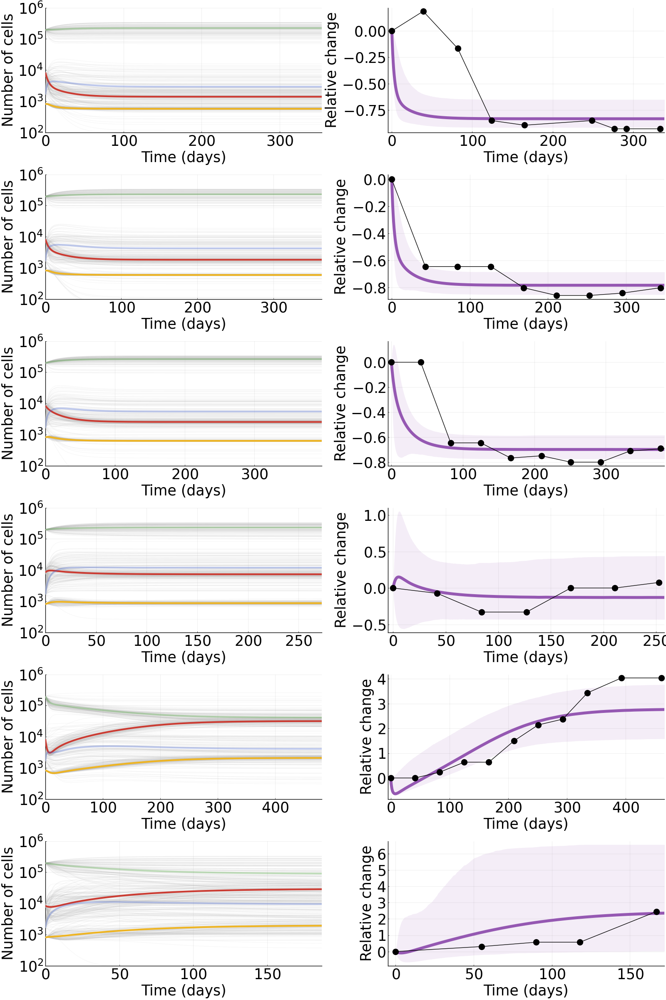

In [45]:
plot(a, b, c, d, e, f, g, h, iplot, j, kplot, l, layout = fig_layout, size =(1600,1200*2), plot_title ="", titlefontsize=25)

## Decision trees to classify tumor response (increasing or decreasing)

In [46]:
using DecisionTree
using JLD

In [59]:
chain_data = [chain_array1; chain_array2; chain_array5; chain_array6]

32000×4 Matrix{Float64}:
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.97715e-5   1.72959e-6  0.160479   0.752393
 4.29946e-5   2.10943e-6  0.176301   0.752733
 1.58281e-5   2.10845e-7  0.242809   1.82758
 5.64313e-5   1.50173e-7  0.166916   1.79634
 2.40292e-5   1.26298e-6  0.206887   0.802493
 2.69279e-5   1.14013e-6  0.186087   0.704485
 2.69279e-5   1.14013e-6  0.186087   0.704485
 2.2116e-5    1.07242e-6  0.225123   0.738009
 1.84771e-5   1.1237e-6   0.213507   0.78163
 9.40612e-6   8.49477e-7  0.265379   0.881263
 0.000137032  3.35371e-7  0.0932123  1.60106
 ⋮                                   
 1.63483e-5   1.42489e-7  0.501168   1.35753
 3.62294e-6   1.65117e-7  0.269376   2.20695
 7.65781e-6   1.08025e-6  0.455195   1.28679
 0.000158031  1.6002e-6   0.218611   1.83002
 3.34379e-5   2.1601e-7   0.320412   1.78323
 0.000161916  2.57075e-7  0.284502   1.57391
 2.68078e-5   5.66314e-7  0.412027   0.885313
 3.73406e-5   6.4431e-7   0

In [71]:
chain_data

32000×4 Matrix{Float64}:
 1.82489e-5  1.68686e-6  0.244336  1.77781
 7.65434e-6  2.09193e-7  0.231019  1.21527
 7.58528e-6  1.74226e-6  0.291978  1.39485
 9.67143e-7  8.78992e-7  0.249382  0.973163
 1.02477e-5  1.26303e-6  0.172911  2.25416
 9.36574e-7  6.26205e-7  0.253868  1.74452
 4.93362e-5  1.49779e-6  0.175181  1.09725
 1.97573e-5  1.32163e-6  0.21126   0.945166
 7.91402e-5  4.85456e-7  0.130607  1.4024
 7.91402e-5  4.85456e-7  0.130607  1.4024
 6.71558e-5  1.43704e-7  0.163351  1.76774
 3.39088e-5  1.65149e-7  0.156448  1.67151
 4.49275e-5  9.62731e-8  0.17654   1.60098
 ⋮                                 
 2.44656e-5  4.63746e-7  0.406628  1.07385
 1.79377e-5  1.39112e-6  0.45366   0.485564
 1.3288e-5   1.73599e-6  0.417596  0.559032
 7.55792e-6  8.05313e-7  0.546553  1.64014
 2.94585e-5  1.07684e-6  0.452081  1.34377
 1.00133e-5  1.32244e-7  0.404895  1.12444
 1.13594e-5  1.29024e-7  0.431861  1.07564
 1.07629e-5  1.03202e-7  0.623142  0.654831
 2.28063e-5  1.78684e-7  0.815101

In [72]:
only_two = [chain_data[:,1] chain_data[:,3]]

32000×2 Matrix{Float64}:
 1.82489e-5  0.244336
 7.65434e-6  0.231019
 7.58528e-6  0.291978
 9.67143e-7  0.249382
 1.02477e-5  0.172911
 9.36574e-7  0.253868
 4.93362e-5  0.175181
 1.97573e-5  0.21126
 7.91402e-5  0.130607
 7.91402e-5  0.130607
 6.71558e-5  0.163351
 3.39088e-5  0.156448
 4.49275e-5  0.17654
 ⋮           
 2.44656e-5  0.406628
 1.79377e-5  0.45366
 1.3288e-5   0.417596
 7.55792e-6  0.546553
 2.94585e-5  0.452081
 1.00133e-5  0.404895
 1.13594e-5  0.431861
 1.07629e-5  0.623142
 2.28063e-5  0.815101
 2.90092e-5  0.695009
 1.21471e-5  0.676457
 2.30843e-5  0.74183

In [73]:
chain_classification = zeros(String,length(chain_data[:,1]))
for i = 1:16000
    chain_classification[i] = "decreasing"
end
for i = 16001:32000
    chain_classification[i] = "increasing"
end

In [74]:
#run decision tree on parameters from MCMC posteriors
features = float.(only_two)
labels   = string.(chain_classification)

32000-element Vector{String}:
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 ⋮
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"

In [75]:
# train depth-truncated classifier
model = DecisionTreeClassifier(max_depth=3)

DecisionTreeClassifier
max_depth:                3
min_samples_leaf:         1
min_samples_split:        2
min_purity_increase:      0.0
pruning_purity_threshold: 1.0
n_subfeatures:            0
classes:                  nothing
root:                     nothing

In [76]:
#fit model
fit!(model, features, labels)

DecisionTreeClassifier
max_depth:                3
min_samples_leaf:         1
min_samples_split:        2
min_purity_increase:      0.0
pruning_purity_threshold: 1.0
n_subfeatures:            0
classes:                  ["decreasing", "increasing"]
root:                     Decision Tree
Leaves: 8
Depth:  3

In [77]:
#print tree
print_tree(model, 3)

Feature 1, Threshold 9.097876596023471e-5
L-> Feature 2, Threshold 0.3150686533879509
    L-> Feature 1, Threshold 3.446991695435108e-5
        L-> decreasing : 8310/8511
        R-> decreasing : 5399/9814
    R-> Feature 1, Threshold 8.871669583956129e-6
        L-> increasing : 635/777
        R-> increasing : 2778/2795
R-> Feature 2, Threshold 0.13730468665554976
    L-> Feature 1, Threshold 0.00012586278642703398
        L-> decreasing : 1332/1361
        R-> increasing : 4795/5585
    R-> Feature 2, Threshold 0.13903061565509256
        L-> increasing : 98/103
        R-> increasing : 3049/3054


In [78]:
#apply model
DecisionTree.predict(model, [2.30843e-5, 0.74183])

"increasing"

In [79]:
predict_proba(model, [2.30843e-5, 0.74183])

2-element Vector{Float64}:
 0.006082289803220036
 0.99391771019678

In [80]:
println(get_classes(model)) 

["decreasing", "increasing"]


In [81]:
#run n-fold cross validation over 3 CV folds
using ScikitLearn.CrossValidation: cross_val_score
accuracy = cross_val_score(model, features, labels, cv=3)

3-element Vector{Float64}:
 0.7242219722534683
 0.8542096381023814
 0.8663978998687418

# Figures 6, S18, and S19

In [1]:
using Turing, Distributions, DifferentialEquations
using MCMCChains, Plots, StatsPlots
using Plots; pyplot()

using Random
Random.seed!(14);

logocolors = Colors.JULIA_LOGO_COLORS

In [2]:
color1 = RGBA(113/255,46/255,103/255,1)
color2 = RGBA(38/255,117/255,146/255,1)
color3 = RGBA(95/255,177/255,42/255,1)
color4 = RGBA(199/255,200/255,0/255,1)
color5 = RGBA(255/255,121/255,23/255,1)
color6 = RGBA(226/255,58/255,52/255,1)

┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 2 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


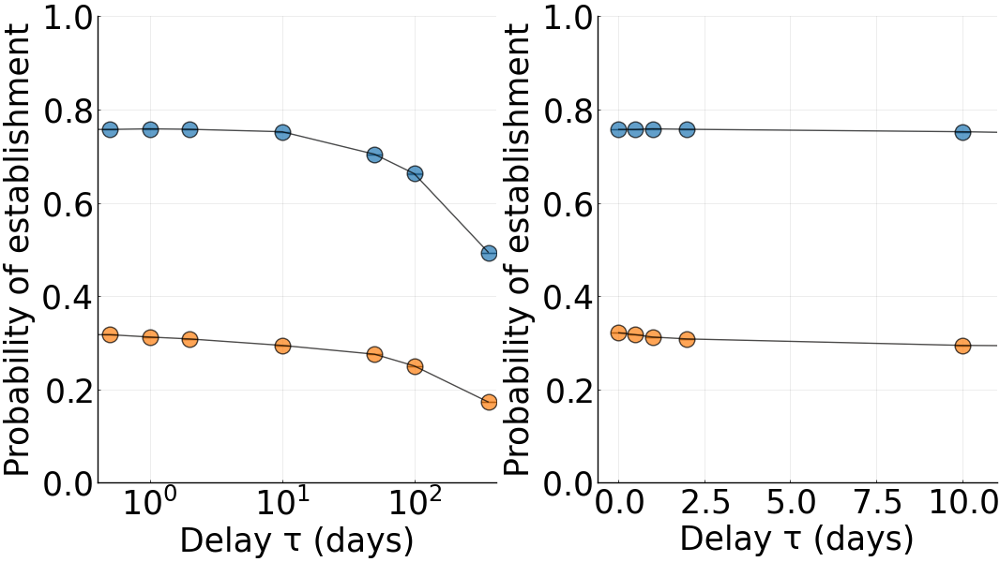

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based xscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 0.7)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


In [3]:
#plot for CTL-dominated
l = @layout [a b; c d; e f]
l2 = @layout [a b]
delays = [0,0.5,1,2,10,50,100,365]

prob_success150 = [0.757593,0.757546,0.758791,0.757871,0.75265,0.704438,0.662728,0.493531]
prob_sigma150 = [0.42854,0.428569,0.427818,0.428374,0.431474,0.456297,0.472781,0.49996]
mean150 = [517998.,476629.,449186.,436103.,193025.,117412.,76132.7,19699.3]
mean_sigma150 = [6.88998*10^6,6.34356*10^6,6.07141*10^6,7.74707*10^6,1.76635*10^6,3.48508*10^6,2.31178*10^6,75003.6]
number_of_sims150 = [sqrt(217832),sqrt(119540),sqrt(116849),sqrt(115930),sqrt(117546),sqrt(119298),sqrt(121261),sqrt(132403)]
time150 = [1.12585,1.01272,1.0919,1.0097,3.5922,16.0783,26.7014,95.1018]
time_sigma150 =[8.91705,7.13165,8.28254,7.09609,25.1213,47.7336,54.0607,115.087]

prob_success100 = [0.321711,0.317475,0.3125,0.30843,0.294564,0.275741,0.250585,0.172958]
prob_sigma100 = [0.467133,0.465496,0.463514,0.461847,0.455848,0.446889,0.433351,0.378212]
mean100 = [198535.,197124.,179085.,177517.,104698.,35567.,31121.6,9651.81]
mean_sigma100 = [3.93484*10^6,6.08296*10^6,3.69632*10^6,6.68483*10^6,3.79012*10^6,351135.,1.0642*10^6,2443.94]
number_of_sims100 = [sqrt(634443),sqrt(150188),sqrt(147523),sqrt(140800),sqrt(148501),sqrt(152400),sqrt(156390),sqrt(173221)]
time100 = [8.4226,9.49264,10.4432,11.5911,13.5737,14.048,17.1391,38.1711]
time_sigma100 =[38.7737,41.7508,44.3292,46.8041,50.5953,48.1733,50.771,83.0854]


prob_success = [prob_success150 prob_success100]
prob_sigma = [prob_sigma150/number_of_sims150 prob_sigma100/number_of_sims100]

mean = [mean150 mean100]
mean_sigma = [mean_sigma150/number_of_sims150 mean_sigma100/number_of_sims100]

time = [time150 time100]
time_sigma = [time_sigma150/number_of_sims150 time_sigma100/number_of_sims100]

plot()
plot!(delays,prob_success,yerror=prob_sigma,ribbon=prob_sigma,fillalpha= 0.2,grid=true,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (-0.6,11.0),ylims = (0,1),markersize = 12,font = "Ariel")
p1 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (-0.6,11.0),font = "Ariel") 

plot()
plot!(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (-2,102),ylims = (10^1,10^6),markersize = 12,font = "Ariel")
p3 = plot!(delays,mean,grid=true,color = "Black",alpha=0.7,yaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (-2,102),font = "Ariel")
##

plot()
plot!(delays,prob_success,yerror=prob_sigma,grid=true,ribbon=prob_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:scatter,xlims = (0.4,420),ylims = (0,1),markersize = 12,font = "Ariel")
p2 = plot!(delays,prob_success,grid=true,color = "Black",alpha=0.7,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Probability of establishment", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(delays,mean,yerror=mean_sigma,grid=true,ribbon=mean_sigma,fillalpha= 0.2,yaxis=:log,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:scatter,xlims = (0.4,420),ylims = (10^1,10^6),markersize = 12,font = "Ariel")
p4 = plot!(delays,mean,color = "Black",alpha=0.7,grid=true,yaxis=:log,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean size", seriestype =:line,xlims = (0.4,420),font = "Ariel")
##

plot()
plot(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (-2,102),markersize = 12,font = "Ariel")
p5 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (-2,102),font = "Ariel")

plot()
plot!(delays,time,yerror=time_sigma,grid=true,ribbon=time_sigma,fillalpha= 0.2,xaxis=:log,palette=:tab10,align="center",alpha=0.7,label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:scatter,xlims = (0.4,420),markersize = 12,font = "Ariel")
p6 = plot!(delays,time,color = "Black",alpha=0.7,grid=true,xaxis=:log,align="center",label = "",xlabel = "Delay τ (days)",ylabel = "Mean time to extinction", seriestype =:line,xlims = (0.4,420),font = "Ariel")

plot()
plot(p2, p1, layout = l2,size =(1600/3*2,600),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))
#plot(p1, p2, p3, p4, layout = l2,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25))

## Data

In [3]:
#tumor data
time_1 = [0.0,39.0,82.0,124.0,165.0,249.0,277.0,292.0,334.0]

tumor_1 = [24565000000.0,29160000000.0,20480000000.0,3645000000.0,2560000000.0,3645000000.0,1715000000.0,1715000000.0,1715000000.0]
for i = 2:convert(Int64, length(tumor_1))
    tumor_1[i] = (tumor_1[i]-tumor_1[1])./tumor_1[1]
end
tumor_1[1] = 0.0


time_2 = [0.0,43.0,84.0,127.0,169.0,211.0,253.0,295.0,344.0]

tumor_2 = [5.5296E+11,1.9652E+11,1.9652E+11,1.9652E+11,1.0976E+11,78125000000.0,78125000000.0,87880000000.0,1.0976E+11]
for i = 2:convert(Int64, length(tumor_2))
    tumor_2[i] = (tumor_2[i]-tumor_2[1])./tumor_2[1]
end
tumor_2[1] = 0.0


time_3 = [0.0,41.0,83.0,125.0,167.0,210.0,251.0,293.0,334.0,442.0,377.0]

tumor_3 = [1.37313E+12,1.37313E+12,4.8668E+11,4.8668E+11,3.2E+11,3.44605E+11,2.7436E+11,2.7436E+11,3.97535E+11,4.55625E+11,4.2592E+11]
for i = 2:convert(Int64, length(tumor_3))
    tumor_3[i] = (tumor_3[i]-tumor_3[1])./tumor_3[1]
end
tumor_3[1] = 0.0

time_4 = [0.0,42.0,84.0,127.0,169.0,211.0,253.0]

tumor_4 = [3.2E+11,2.96595E+11,2.14375E+11,2.14375E+11,3.2E+11,3.2E+11,3.44605E+11]
for i = 2:convert(Int64, length(tumor_4))
    tumor_4[i] = (tumor_4[i]-tumor_4[1])./tumor_4[1]
end
tumor_4[1] = 0.0

time_5 = [0.0,41.0,83.0,125.0,167.0,210.0,251.0,293.0,335.0,393.0,461.0]

tumor_5 = [1.0976E+11,1.0976E+11,1.35E+11,1.79685E+11,1.79685E+11,2.7436E+11,3.44605E+11,3.7044E+11,4.8668E+11,5.5296E+11,5.5296E+11]
for i = 2:convert(Int64, length(tumor_5))
    tumor_5[i] = (tumor_5[i]-tumor_5[1])./tumor_5[1]
end
tumor_5[1] = 0.0

time_6 = [0.0,55.0,90.0,118.0,167.0]

tumor_6 = [3.97535E+11,5.19115E+11,6.25E+11,6.25E+11,1.37313E+12]
for i = 2:convert(Int64, length(tumor_6))
    tumor_6[i] = (tumor_6[i]-tumor_6[1])./tumor_6[1]
end
tumor_6[1] = 0.0

0.0

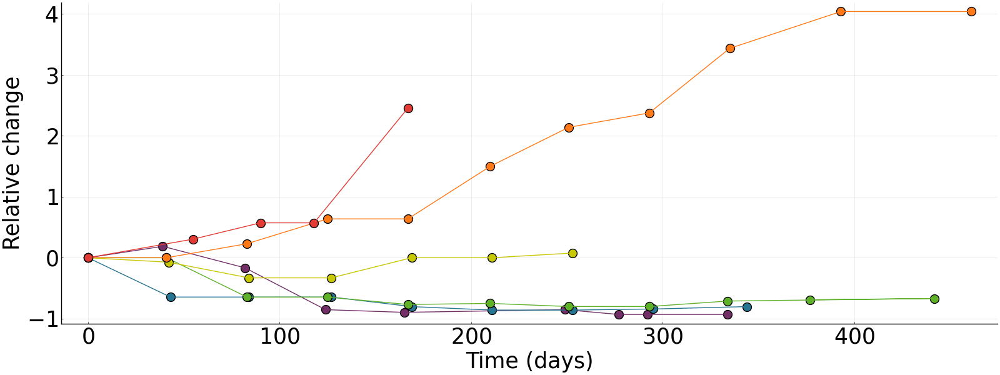

In [4]:
#plot tumor data relative change
scatter()
scatter!(time_1, tumor_1, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color1, color1],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_1, tumor_1, size =(1600,600), font = "Ariel", color = color1, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_2, tumor_2, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color2, color2],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_2, tumor_2, size =(1600,600), font = "Ariel", color = color2, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_3, tumor_3, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color3, color3],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_3, tumor_3, size =(1600,600), font = "Ariel", color = color3, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_4, tumor_4, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color4, color4],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_4, tumor_4, size =(1600,600), font = "Ariel", color = color4, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_5, tumor_5, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color5, color5],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_5, tumor_5, size =(1600,600), font = "Ariel", color = color5, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

scatter!(time_6, tumor_6, markersize = 10, size =(1600,600), font = "Ariel", color_palette = palette([color6, color6],2), legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_6, tumor_6, size =(1600,600), font = "Ariel", color = color6, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

In [5]:
#remove first data point from each tumor (baseline)
popfirst!(tumor_1)
popfirst!(time_1)
popfirst!(tumor_2)
popfirst!(time_2)
popfirst!(tumor_3)
popfirst!(time_3)
popfirst!(tumor_4)
popfirst!(time_4)
popfirst!(tumor_5)
popfirst!(time_5)
popfirst!(tumor_6)
popfirst!(time_6)

0.0

In [6]:
tumor_1

8-element Vector{Float64}:
  0.18705475269692654
 -0.16629350702218604
 -0.8516181559128841
 -0.8957866883777732
 -0.8516181559128841
 -0.9301852228780786
 -0.9301852228780786
 -0.9301852228780786

In [7]:
tumor_2

8-element Vector{Float64}:
 -0.6446035879629629
 -0.6446035879629629
 -0.6446035879629629
 -0.8015046296296297
 -0.8587149160879629
 -0.8587149160879629
 -0.8410734953703703
 -0.8015046296296297

In [8]:
tumor_3

10-element Vector{Float64}:
  0.0
 -0.6455688827714783
 -0.6455688827714783
 -0.7669557871432421
 -0.7490368719640529
 -0.8001937180019372
 -0.8001937180019372
 -0.7104899026312148
 -0.6681850953660615
 -0.6898181526876552

In [9]:
tumor_4

6-element Vector{Float64}:
 -0.073140625
 -0.330078125
 -0.330078125
  0.0
  0.0
  0.076890625

In [10]:
tumor_5

10-element Vector{Float64}:
 0.0
 0.22995626822157433
 0.6370717930029155
 0.6370717930029155
 1.4996355685131195
 2.1396228134110786
 2.375
 3.434037900874636
 4.037900874635569
 4.037900874635569

In [11]:
tumor_6

4-element Vector{Float64}:
 0.30583470637805477
 0.5721886123234432
 0.5721886123234432
 2.4541109587835033

## Model

In [12]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    β₃, α₆, α₁ = p 
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(max(η/T,1)) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [13]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

In [14]:
#define condition for simulation to end
function condition(u,t,integrator) 
  u[1] < 0.0 || u[2] < 0.0 || u[3] < 0.0 || u[4] < 0.0
end

floor_event = DiscreteCallback(condition, terminate!)

DiscreteCallback{typeof(condition), typeof(terminate!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, SciMLBase.terminate!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

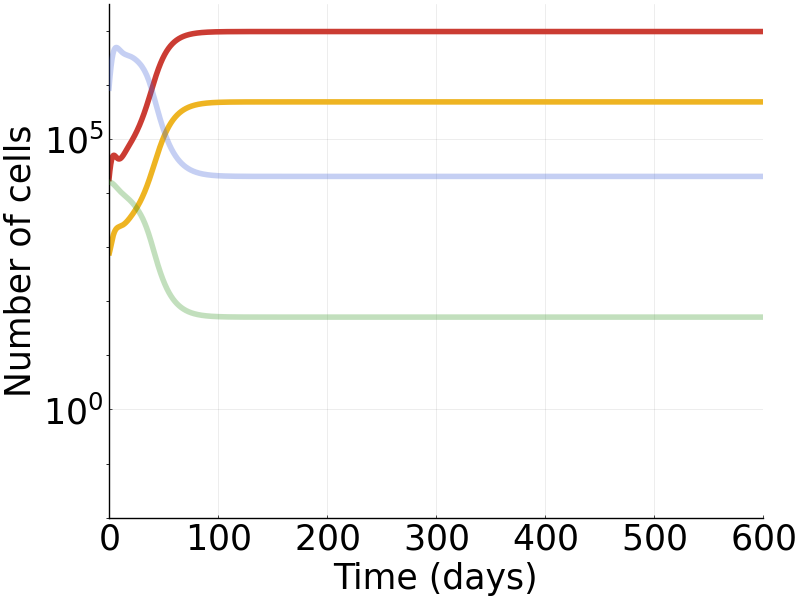

In [15]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.0*(10.0^3.0) #1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

tspan = (0.0,600.0)
u0 = [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]

prob1 = ODEProblem(ode_system,u0,tspan,p)
sol = solve(prob1,alg,saveat=0.1,callback=floor_event)
plot(sol, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

In [16]:
sol

retcode: Success
Interpolation: 1st order linear
t: 6001-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 598.9
 599.0
 599.1
 599.2
 599.3
 599.4
 599.5
 599.6
 599.7
 599.8
 599.9
 600.0
u: 6001-element Vector{Vector{Float64}}:
 [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]
 [17495.703858801153, 720.5773246871576, 16149.35558744171, 825964.3595889646]
 [18360.262709237915, 733.9589324128563, 16135.893107511974, 875949.818492078]
 [19247.630309750326, 747.9429548217944, 16121.64530112281, 928114.5753213016]
 [20156.759570552465, 762.5396037765536, 16106.580195365044, 982482.0544230276]
 [21086.44348486365, 777.7576371633417, 16090.665792680924, 1.0390685058936212e6]
 [22035.315082553097, 793.604354050874, 16073.87007445593, 1.0978829850662772e6]
 [23001.84743374628, 810.0855946645687, 16056.161001067883, 1.158927352425972e6]
 [23984.383818611026, 827.2054182043008, 16037.5070360940

## Fitting

In [17]:
Threads.nthreads()

1

In [18]:
#set model parameters
η = 10.0^(5.0)
η

100000.0

In [19]:
time_to_fit1 = time_1
tumor_to_fit1 = tumor_1
tumor_curve_fit1 = zeros(length(tumor_to_fit1))
for i = 1:convert(Int64, length(tumor_to_fit1))
    tumor_curve_fit1[i] = tumor_to_fit1[i].*u0[1]+u0[1]
end

In [20]:
#fit tumor 1
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit1))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit1.+1), prob1) 

@time chain1 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warnin

206.864972 seconds (4.40 G allocations: 198.320 GiB, 20.21% gc time, 0.69% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 184.08 seconds
Compute duration  = 182.22 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0001     0.0000    0.0000   2752.1831    1.0003    ⋯
          α₆    0.0064    0.0024     0.0000    0.0001   1937.3454    1.0033    ⋯
          α₁    0.1321    0.0853     0.0010    0.0018   2566.4057    1.0023    ⋯
           σ    1.3018    0.3787     0.0042    0.0071   3034.7067    1.0008    ⋯
                                                        

In [21]:
time_to_fit2 = time_2
tumor_to_fit2 = tumor_2
tumor_curve_fit2 = zeros(length(tumor_to_fit2))
for i = 1:convert(Int64, length(tumor_to_fit2))
    tumor_curve_fit2[i] = tumor_to_fit2[i].*u0[1]+u0[1]
end

In [22]:
#fit tumor 2
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit2,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit2)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ)
    end

end

model = fitlv(log.(tumor_curve_fit2.+1), prob1) 

@time chain2 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Info: 

209.226027 seconds (5.85 G allocations: 263.641 GiB, 25.59% gc time, 4.75% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 207.28 seconds
Compute duration  = 207.04 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0001     0.0000    0.0000   1749.5073    1.0019    ⋯
          α₆    0.0064    0.0023     0.0000    0.0001   1039.1486    1.0050    ⋯
          α₁    0.1440    0.0792     0.0009    0.0023   1278.1969    1.0026    ⋯
           σ    0.6339    0.1975     0.0022    0.0052   1616.4526    1.0017    ⋯
                                                        

In [23]:
time_to_fit3 = time_3
tumor_to_fit3 = tumor_3
tumor_curve_fit3 = zeros(length(tumor_to_fit3))
for i = 1:convert(Int64, length(tumor_to_fit3))
    tumor_curve_fit3[i] = tumor_to_fit3[i].*u0[1]+u0[1]
end

In [24]:
#fit tumor 3
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit3,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    

    for i = 1:min(length(predicted),length(tumor_curve_fit3))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ)
    end

end

model = fitlv(log.(tumor_curve_fit3.+1), prob1) 

@time chain3 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warnin

266.743729 seconds (7.62 G allocations: 343.322 GiB, 26.12% gc time, 3.56% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 264.83 seconds
Compute duration  = 264.6 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0001     0.0000    0.0000   1237.2087    1.0025    ⋯
          α₆    0.0062    0.0025     0.0000    0.0001   1651.8747    1.0012    ⋯
          α₁    0.1852    0.1030     0.0012    0.0026   1393.7710    1.0015    ⋯
           σ    0.6276    0.1719     0.0019    0.0035   2196.5038    1.0007    ⋯
                                                         

In [25]:
time_to_fit4 = time_4
tumor_to_fit4 = tumor_4
tumor_curve_fit4 = zeros(length(tumor_to_fit4))
for i = 1:convert(Int64, length(tumor_to_fit4))
    tumor_curve_fit4[i] = tumor_to_fit4[i].*u0[1]+u0[1]
end

In [26]:
#fit tumor 4
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit4,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    

    for i = 1:min(length(predicted),length(tumor_curve_fit4))
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit4.+1), prob1) 

@time chain4 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.2
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.2
└ @ Turing.Inference /Users/jessekreger/.julia/packag

378.457054 seconds (11.23 G allocations: 505.507 GiB, 26.59% gc time, 2.59% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 376.6 seconds
Compute duration  = 376.36 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0001     0.0000    0.0000    939.0130    1.0060    ⋯
          α₆    0.0055    0.0025     0.0000    0.0001   1906.7409    1.0009    ⋯
          α₁    0.2935    0.1609     0.0018    0.0039   1688.2842    1.0023    ⋯
           σ    0.5782    0.2454     0.0027    0.0059   1824.7520    1.0066    ⋯
                                                         

In [27]:
time_to_fit5 = time_5
tumor_to_fit5 = tumor_5
tumor_curve_fit5 = zeros(length(tumor_to_fit5))
for i = 1:convert(Int64, length(tumor_to_fit5))
    tumor_curve_fit5[i] = tumor_to_fit5[i].*u0[1]+u0[1]
end

In [28]:
#fit tumor 5
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit5,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit5)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit5.+1), prob1) 

@time chain5 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.2
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, 

486.543470 seconds (14.95 G allocations: 671.406 GiB, 27.01% gc time, 1.89% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 484.7 seconds
Compute duration  = 484.46 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   e ⋯
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64     ⋯

          β₃    0.0001    0.0001     0.0000    0.0000   966.1279    1.0029     ⋯
          α₆    0.0042    0.0028     0.0000    0.0001   354.6297    1.0157     ⋯
          α₁    0.2842    0.1815     0.0020    0.0084   352.7643    1.0135     ⋯
           σ    0.6794    0.1977     0.0022    0.0074   765.6187    1.0025     ⋯
                                                         

In [29]:
time_to_fit6 = time_6
tumor_to_fit6 = tumor_6
tumor_curve_fit6 = zeros(length(tumor_to_fit6))
for i = 1:convert(Int64, length(tumor_to_fit6))
    tumor_curve_fit6[i] = tumor_to_fit6[i].*u0[1]+u0[1]
end

In [30]:
#fit tumor 6
Turing.setadbackend(:forwarddiff)

@model function fitlv(data, prob1)
    
    β₃ ~ truncated(Normal(4.0*10.0^(-5.0),10.0^(-4.0)),0.0,10.0^(-2.0))
    α₆ ~ truncated(Normal(2.0*(10.0^(-3.0)),(10.0^(-2.0))),0.0,10.0^(-2.0))
    α₁ ~ truncated(Normal(10.0^(-1.0),3.0*10.0^(-1.0)),0.0,1.0)
    σ ~ InverseGamma(2, 3) 


    p = [β₃, α₆, α₁] 
    prob = remake(prob1, p=p)
    predicted = solve(prob,Tsit5(),saveat=time_to_fit6,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
    

    for i = 1:min(length(predicted),length(tumor_curve_fit6)) 
        data[i] ~ Normal(log.(predicted[i][1].+1), σ) 
    end

end

model = fitlv(log.(tumor_curve_fit6.+1), prob1) 

@time chain6 = sample(model, NUTS(0.65), MCMCThreads(), 2000, 4, progress=true)

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC /Users/jessekreger/.julia/packages/AbstractMCMC/BPJCW/src/sample.jl:291
┌ Info: Found initial step size
│   ϵ = 0.05
└ @ Turing.Inference /Users/jessekreger/.julia/packages/Turing/y0DW3/src/inference/hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /Users/jessekreger/.julia/packages/AdvancedHMC/kB7Xa/src/hamiltonian.jl:47
┌ Warnin

281.300974 seconds (8.52 G allocations: 382.580 GiB, 26.45% gc time, 3.31% compilation time)


Chains MCMC chain (2000×16×4 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 4
Samples per chain = 2000
Wall duration     = 279.4 seconds
Compute duration  = 279.16 seconds
parameters        = σ, α₆, β₃, α₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat    ⋯
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64    ⋯

          β₃    0.0001    0.0001     0.0000    0.0000   2497.4772    1.0001    ⋯
          α₆    0.0047    0.0026     0.0000    0.0001   2209.1267    1.0039    ⋯
          α₁    0.3364    0.1761     0.0020    0.0038   2077.1616    1.0018    ⋯
           σ    0.9139    0.4519     0.0051    0.0097   2226.7432    1.0005    ⋯
                                                         

In [31]:
chain_array1 = Array(chain1)

8000×4 Matrix{Float64}:
 9.05704e-6   0.00696654  0.208706   0.972022
 5.05385e-5   0.00299938  0.0631274  1.02907
 4.17606e-5   0.00204111  0.0765991  1.61614
 4.30383e-5   0.0023423   0.0777197  1.59448
 2.88218e-5   0.00406847  0.136577   1.0532
 2.88218e-5   0.00406847  0.136577   1.0532
 8.08587e-5   0.00971013  0.137204   1.29831
 0.000177412  0.0093754   0.0705688  1.66735
 9.5841e-5    0.00281842  0.0743     1.5242
 3.49498e-5   0.00456383  0.0367022  1.51874
 3.60928e-5   0.00561923  0.0498841  1.63735
 3.03869e-5   0.00404573  0.0862466  1.33323
 3.03869e-5   0.00404573  0.0862466  1.33323
 ⋮                                   
 0.000193132  0.00649799  0.0656821  2.09124
 0.000151796  0.00640369  0.0911997  1.95301
 3.43816e-5   0.00569799  0.13104    1.42329
 9.04397e-5   0.00390283  0.100752   2.3176
 0.000234963  0.00540649  0.0358984  1.40198
 8.13555e-5   0.00399475  0.049375   1.45119
 5.32578e-5   0.00432952  0.103828   1.84327
 5.52393e-5   0.00453969  0.0766642  1.91

In [32]:
chain_array2 = Array(chain2)

8000×4 Matrix{Float64}:
 1.22966e-5   0.00962134  0.224721   0.663495
 2.40102e-5   0.00896318  0.273688   0.568225
 6.35996e-5   0.00855273  0.187258   0.375716
 4.91226e-6   0.00281433  0.0974367  0.497418
 6.79554e-6   0.00114603  0.056534   0.528526
 0.000113721  0.00997112  0.136636   0.73215
 9.03351e-5   0.00997046  0.12464    0.767855
 0.000139976  0.00926462  0.0972009  0.448925
 1.07809e-5   0.00361874  0.124725   0.636967
 1.39767e-5   0.00367625  0.12272    0.587612
 2.11657e-5   0.00347432  0.103769   0.583416
 0.000133962  0.0082577   0.0794577  0.611048
 4.26957e-5   0.006255    0.148052   0.47951
 ⋮                                   
 0.000104097  0.00386777  0.0541793  0.782082
 9.00852e-5   0.0078588   0.0887319  0.508
 3.08203e-5   0.00641755  0.12626    0.548523
 1.24961e-6   0.00818519  0.282886   0.707719
 1.39513e-5   0.00337515  0.159168   0.966844
 5.97101e-5   0.00470678  0.117166   0.671254
 2.46783e-5   0.00179284  0.0875861  0.524569
 2.58261e-5   0.0036815

In [33]:
chain_array3 = Array(chain3)

8000×4 Matrix{Float64}:
 9.07202e-6   0.00591839  0.230677   0.566966
 2.82528e-5   0.00688828  0.22       0.594007
 0.000225545  0.00566822  0.064969   0.502223
 2.72688e-5   0.003231    0.114078   0.500535
 4.50456e-5   0.00402727  0.12632    0.617316
 6.08534e-5   0.0052145   0.125207   0.594479
 2.13603e-5   0.00322946  0.129437   0.550712
 0.000101232  0.00745615  0.132715   0.725996
 1.25057e-5   0.00868634  0.31728    0.309656
 2.93963e-5   0.0066289   0.250916   0.4738
 7.53225e-6   0.00770968  0.357973   0.494959
 3.69955e-5   0.00793515  0.242168   0.533701
 2.09866e-5   0.0057083   0.231486   0.569708
 ⋮                                   
 6.82996e-5   0.0074742   0.188607   0.785313
 0.000144727  0.00569098  0.0842759  0.656045
 0.000121446  0.00937834  0.184834   0.662946
 3.15831e-5   0.0049492   0.157143   1.01777
 1.55476e-5   0.00362046  0.141474   0.66571
 5.3645e-5    0.00814875  0.219041   0.629046
 6.76399e-6   0.00622288  0.426075   0.562088
 8.80992e-5   0.009958

In [34]:
chain_array4 = Array(chain4)

8000×4 Matrix{Float64}:
 2.62244e-5  0.00637099  0.430908  0.789082
 5.35708e-5  0.00902397  0.462805  0.41978
 2.74245e-5  0.00624854  0.463641  0.373654
 1.30201e-5  0.006593    0.66736   0.28459
 1.3783e-5   0.00676875  0.712585  0.302076
 1.02486e-5  0.00602938  0.576502  0.325197
 2.76002e-5  0.00423685  0.491734  0.692134
 3.07649e-5  0.00422002  0.413254  0.677335
 2.24995e-5  0.00404054  0.416868  0.721718
 2.68752e-5  0.00594241  0.420743  0.54623
 2.30261e-5  0.00521521  0.496845  0.627996
 3.70603e-5  0.00730224  0.528225  0.353068
 7.76608e-5  0.00787109  0.292397  0.553863
 ⋮                                 
 5.61343e-6  0.00474872  0.604422  0.507917
 9.55979e-6  0.00164124  0.215684  0.632024
 1.0288e-5   0.00139684  0.158974  0.681144
 3.74991e-5  0.00829486  0.652571  0.363619
 3.91675e-5  0.00652507  0.565301  0.428915
 5.38216e-5  0.00666225  0.313973  0.434793
 7.12835e-5  0.00478431  0.175482  0.740336
 8.61261e-5  0.00538002  0.177287  0.550408
 1.6284e-5   0.0045

In [35]:
chain_array5 = Array(chain5)

8000×4 Matrix{Float64}:
 7.50235e-7   0.00107299   0.334375   0.934135
 7.72477e-7   0.00137615   0.5482     0.99491
 2.56027e-6   0.000870229  0.503126   0.855182
 1.10732e-5   0.00144252   0.449894   1.09633
 0.000316015  0.00443979   0.344732   1.15068
 0.000399408  0.00443563   0.352499   1.18286
 0.000132201  0.00682723   0.260145   1.26886
 0.000194221  0.00312277   0.198257   1.11976
 8.75622e-5   0.00160138   0.323197   1.19988
 7.86394e-5   0.0042868    0.317808   0.650915
 0.000133729  0.00666225   0.359959   0.853572
 0.000173875  0.00588454   0.353465   0.85882
 5.64134e-5   0.00211089   0.247343   0.649214
 ⋮                                    
 0.00021871   0.00196553   0.0780241  0.575373
 0.000205151  0.00176316   0.0840735  0.58223
 5.70389e-5   0.00209419   0.185559   0.74614
 5.03823e-5   0.00160574   0.259014   0.646384
 6.50938e-5   0.00133338   0.14735    0.646931
 0.000128978  0.000859645  0.0626848  0.79636
 0.00013584   0.00043615   0.052549   0.761314
 7.24629

In [36]:
chain_array6 = Array(chain6)

8000×4 Matrix{Float64}:
 0.000191086  0.00406965  0.0842973  1.38028
 0.000271648  0.00542951  0.0774005  1.20045
 1.59479e-5   0.00233423  0.441918   0.924396
 3.40912e-6   0.00161155  0.515185   0.652999
 7.07586e-5   0.00289277  0.294448   1.68499
 8.47717e-5   0.00831357  0.531142   0.491463
 7.55335e-5   0.00528069  0.412426   0.540365
 0.000135921  0.00661222  0.29903    0.822101
 7.20841e-5   0.00372596  0.256663   0.782061
 0.000121245  0.00510045  0.29324    1.03975
 0.000111531  0.00397608  0.284264   0.928791
 0.000172038  0.00419281  0.317866   0.740147
 5.2149e-5    0.00815236  0.528861   1.28218
 ⋮                                   
 6.58968e-5   0.00543881  0.488747   0.866011
 0.00014056   0.00949258  0.40538    0.585569
 0.000164923  0.00927361  0.305545   0.454811
 0.00017433   0.00943892  0.29716    0.488808
 0.00017433   0.00943892  0.29716    0.488808
 0.000138365  0.00800185  0.306338   0.434733
 0.000145169  0.00765769  0.32639    0.47735
 0.000172001  0.00841232

## Plot

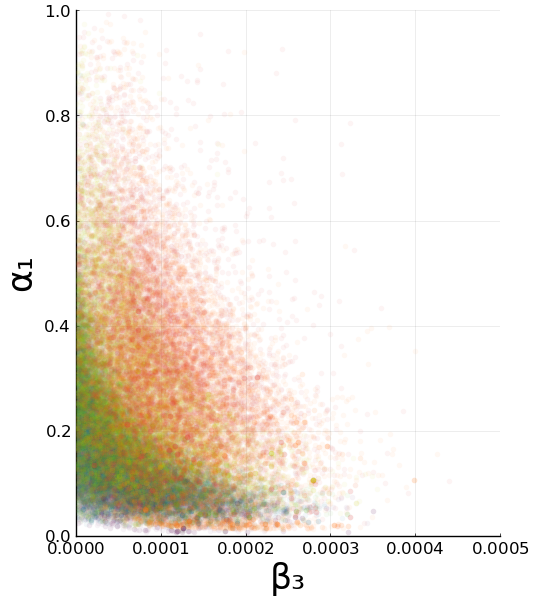

In [39]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,1], chain_array1[:,3], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,1], chain_array2[:,3], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,1], chain_array3[:,3], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,1], chain_array4[:,3], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,1], chain_array5[:,3], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,1], chain_array6[:,3], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,1), xlab = "β₃", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

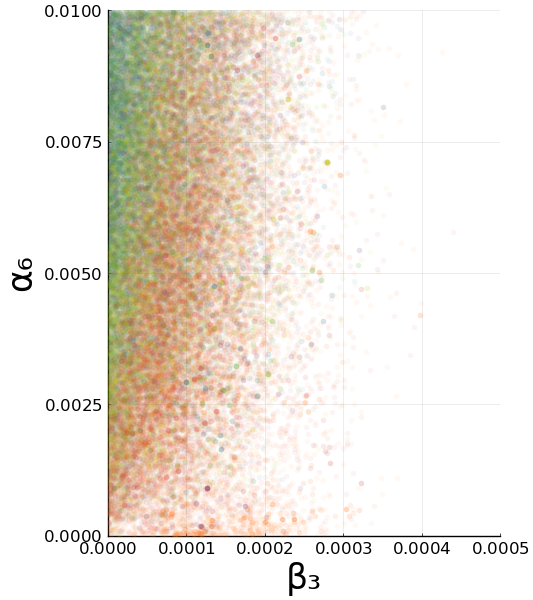

In [40]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,1], chain_array1[:,2], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,1], chain_array2[:,2], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,1], chain_array3[:,2], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,1], chain_array4[:,2], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,1], chain_array5[:,2], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,1], chain_array6[:,2], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0, 0.0005), ylims = (0,10*10^(-3)), xlab = "β₃", ylab = "α₆", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

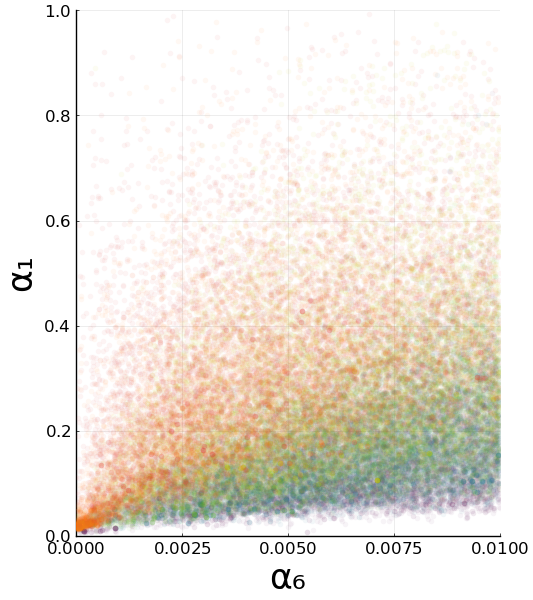

In [41]:
#plot joint posterior
scatter()
scatter!(chain_array1[:,2], chain_array1[:,3], markercolor = palette([color1, color1],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array2[:,2], chain_array2[:,3], markercolor = palette([color2, color2],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array3[:,2], chain_array3[:,3], markercolor = palette([color3, color3],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array4[:,2], chain_array4[:,3], markercolor = palette([color4, color4],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array5[:,2], chain_array5[:,3], markercolor = palette([color5, color5],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)
scatter!(chain_array6[:,2], chain_array6[:,3], markercolor = palette([color6, color6],2), markerstrokewidth = 0, markeralpha = 0.05, xlims = (0,10*10^(-3)), ylims = (0,1), xlab = "α₆", ylab = "α₁", legend = :false, size = (1600/3,600), font = "Ariel", xtickfontsize=12,ytickfontsize=12,xguidefontsize=25,yguidefontsize=25,titlefontsize=25)

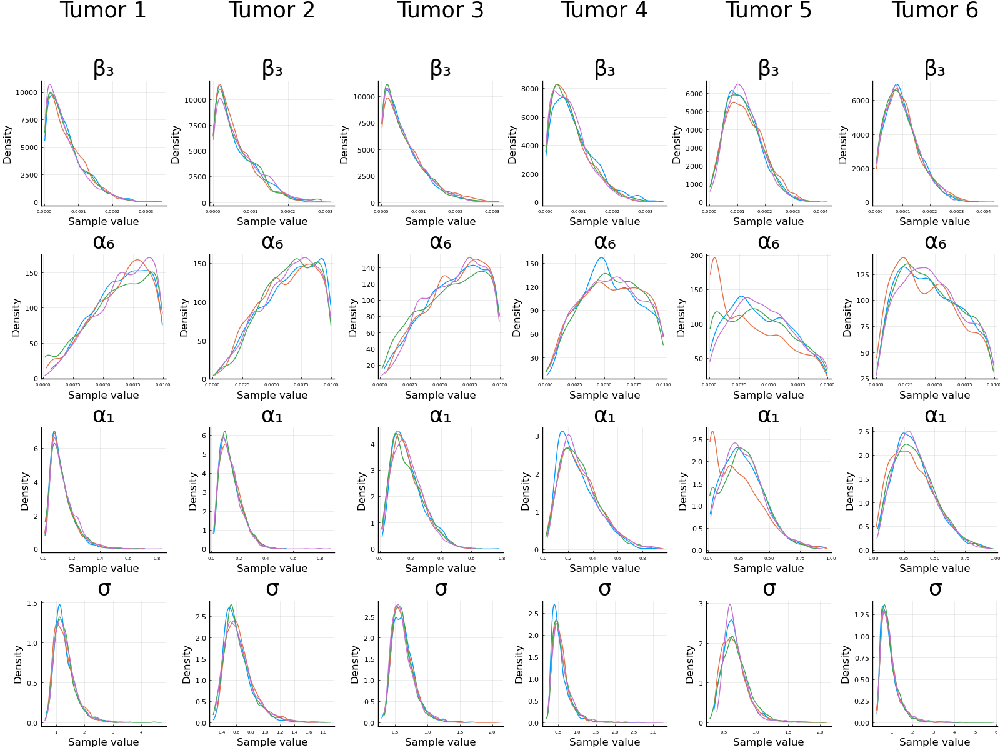

In [40]:
#plot MCMCs
l = @layout [a b c d e f]
a = mixeddensity(chain1, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 1", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
b = mixeddensity(chain2, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 2", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
c = mixeddensity(chain3, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 3", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
d = mixeddensity(chain4, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 4", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
e = mixeddensity(chain5, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 5", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
f = mixeddensity(chain6, size = (1600/2/2,600), font = "Ariel", plot_title="Tumor 6", xtickfontsize=5,ytickfontsize=8,xguidefontsize=12,yguidefontsize=12,titlefontsize=25)
plot(a, b, c, d, e, f, layout = l, size =(1600,1200), plot_title ="", titlefontsize=25)

In [41]:
#plot
plot()
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

η = 10.0^(5.0) #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.0*(10.0^3.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

u0 = [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]

β₃ = mean(chain_array1[:,1]) 
α₆ = mean(chain_array1[:,2]) 
α₁ = mean(chain_array1[:,3]) 
tspan = (0.0,last(time_to_fit1)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth1 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array2[:,1]) 
α₆ = mean(chain_array2[:,2]) 
α₁ = mean(chain_array2[:,3]) 
tspan = (0.0,last(time_to_fit2)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth2 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array3[:,1]) 
α₆ = mean(chain_array3[:,2]) 
α₁ = mean(chain_array3[:,3]) 
tspan = (0.0,last(time_to_fit3)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth3 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array4[:,1]) 
α₆ = mean(chain_array4[:,2]) 
α₁ = mean(chain_array4[:,3]) 
tspan = (0.0,last(time_to_fit4)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth4 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array5[:,1]) 
α₆ = mean(chain_array5[:,2]) 
α₁ = mean(chain_array5[:,3])
tspan = (0.0,last(time_to_fit5)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth5 = solve(probplot,alg,saveat=0.1,callback=floor_event)

β₃ = mean(chain_array6[:,1]) 
α₆ = mean(chain_array6[:,2]) 
α₁ = mean(chain_array6[:,3]) 
tspan = (0.0,last(time_to_fit6)+20)
p = (β₃, α₆, α₁)
probplot = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth6 = solve(probplot,alg,saveat=0.1,callback=floor_event)

retcode: Success
Interpolation: 1st order linear
t: 1871-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 185.9
 186.0
 186.1
 186.2
 186.3
 186.4
 186.5
 186.6
 186.7
 186.8
 186.9
 187.0
u: 1871-element Vector{Vector{Float64}}:
 [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]
 [17415.86449104805, 720.5407846238389, 16080.061298620469, 898417.8669521781]
 [18161.260785237046, 733.7883202242645, 15996.896689751477, 1.0224404126488364e6]
 [18887.143833247927, 747.5021126446284, 15912.528859188466, 1.1499261419696903e6]
 [19589.786694254497, 761.6517594231369, 15826.922868866797, 1.2805776906065776e6]
 [20265.661091521022, 776.2039088737858, 15740.05093264734, 1.4140726719125926e6]
 [20911.470352861546, 791.1226069291249, 15651.892643749181, 1.5500669568492933e6]
 [21524.18888776372, 806.3690420288634, 15562.435153500568, 1.688193162748213e6]
 [22101.112592674675, 821.9023140877472, 154

In [42]:
#plot
plot()
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

η = 10.0^(5.0) #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.0*(10.0^3.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (β₃, α₆, α₁) 

u0 = [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]

β₃ = median(chain_array1[:,1]) 
α₆ = median(chain_array1[:,2]) 
α₁ = median(chain_array1[:,3]) 
tspan = (0.0,last(time_to_fit1)+20)
p = (β₃, α₆, α₁)
probplot1 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth1 = solve(probplot1,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array2[:,1]) 
α₆ = median(chain_array2[:,2]) 
α₁ = median(chain_array2[:,3]) 
tspan = (0.0,last(time_to_fit2)+20)
p = (β₃, α₆, α₁)
probplot2 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth2 = solve(probplot2,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array3[:,1]) 
α₆ = median(chain_array3[:,2]) 
α₁ = median(chain_array3[:,3]) 
tspan = (0.0,last(time_to_fit3)+20)
p = (β₃, α₆, α₁)
probplot3 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth3 = solve(probplot3,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array4[:,1]) 
α₆ = median(chain_array4[:,2]) 
α₁ = median(chain_array4[:,3]) 
tspan = (0.0,last(time_to_fit4)+20)
p = (β₃, α₆, α₁)
probplot4 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth4 = solve(probplot4,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array5[:,1]) 
α₆ = median(chain_array5[:,2]) 
α₁ = median(chain_array5[:,3])
tspan = (0.0,last(time_to_fit5)+20)
p = (β₃, α₆, α₁)
probplot5 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth5 = solve(probplot5,alg,saveat=0.1,callback=floor_event)

β₃ = median(chain_array6[:,1]) 
α₆ = median(chain_array6[:,2]) 
α₁ = median(chain_array6[:,3]) 
tspan = (0.0,last(time_to_fit6)+20)
p = (β₃, α₆, α₁)
probplot6 = ODEProblem(ode_system,u0,tspan,p)
solplotsmooth6 = solve(probplot6,alg,saveat=0.1,callback=floor_event)

retcode: Success
Interpolation: 1st order linear
t: 1871-element Vector{Float64}:
   0.0
   0.1
   0.2
   0.3
   0.4
   0.5
   0.6
   0.7
   0.8
   0.9
   1.0
   1.1
   1.2
   ⋮
 185.9
 186.0
 186.1
 186.2
 186.3
 186.4
 186.5
 186.6
 186.7
 186.8
 186.9
 187.0
u: 1871-element Vector{Vector{Float64}}:
 [16654.84487695383, 707.7867533152364, 16162.064470702491, 778128.8300655035]
 [17343.45535455901, 720.5048997532634, 16091.743060691017, 892694.9634113219]
 [18015.814865727338, 733.6452034518735, 16020.297493741162, 1.010411285214576e6]
 [18668.708060063655, 747.1815473304218, 15947.697520154352, 1.1310346769270853e6]
 [19299.071800006488, 761.0852900393792, 15873.91840483163, 1.2543009891028397e6]
 [19904.024556213866, 775.325465335533, 15798.94116615416, 1.3799268797289876e6]
 [20480.88496532388, 789.8690289479943, 15722.752692869466, 1.5076120239749553e6]
 [21027.21076745512, 804.6808053018163, 15645.34593562045, 1.6370392079564773e6]
 [21540.823062032425, 819.7238116632952, 15566.7

In [43]:
time_to_fit_plot1 = append!([0.0],time_to_fit1) 
tumor_to_fit_plot1 = append!([0.0],tumor_to_fit1)

time_to_fit_plot2 = append!([0.0],time_to_fit2) 
tumor_to_fit_plot2 = append!([0.0],tumor_to_fit2) 

time_to_fit_plot3 = append!([0.0],time_to_fit3) 
tumor_to_fit_plot3 = append!([0.0],tumor_to_fit3) 

time_to_fit_plot4 = append!([0.0],time_to_fit4) 
tumor_to_fit_plot4 = append!([0.0],tumor_to_fit4) 

time_to_fit_plot5 = append!([0.0],time_to_fit5) 
tumor_to_fit_plot5 = append!([0.0],tumor_to_fit5) 

time_to_fit_plot6 = append!([0.0],time_to_fit6) 
tumor_to_fit_plot6 = append!([0.0],tumor_to_fit6) 

5-element Vector{Float64}:
 0.0
 0.30583470637805477
 0.5721886123234432
 0.5721886123234432
 2.4541109587835033

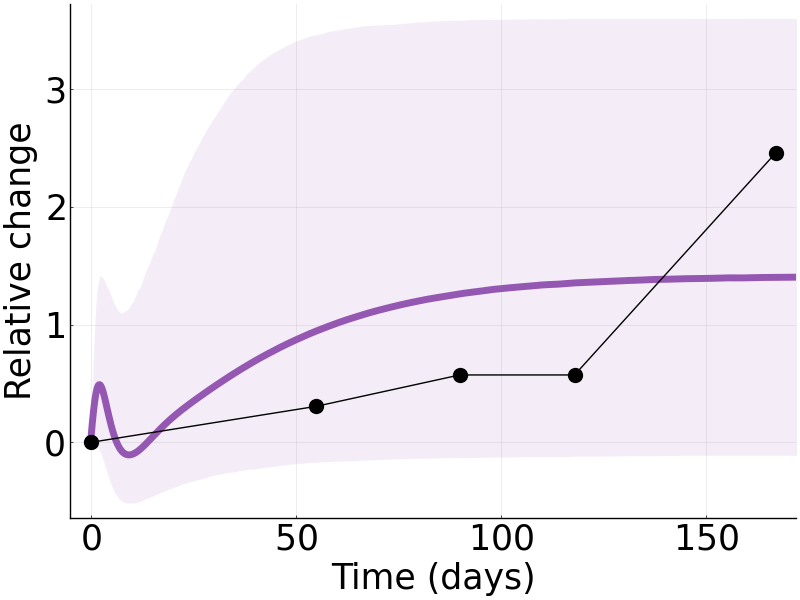

In [44]:
#plot fits
fig_layout = @layout [a b; c d; e f; g h; i j; k l]

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array1[rand(1:length(chain_array1[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
a = plot!(solplotsmooth1, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj1 = solve(remake(probplot1,p=chain_array1[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj1 = zeros(8000, length(traj1.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot1,p=chain_array1[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj1[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low1 = zeros(length(traj1.t))
interval_high1 = zeros(length(traj1.t))
for k in 1:length(interval_low1)
    interval_low1[k] = quantile(array_of_traj1[:,k], 0.05)
    interval_high1[k] = quantile(array_of_traj1[:,k], 0.95)
end

predicted_data1 = ones(length(solplotsmooth1)) 
for i = 1:convert(Int64, length(solplotsmooth1))
    predicted_data1[i] = (solplotsmooth1[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth1.t, predicted_data1, ribbon = (abs.(interval_low1-predicted_data1), abs.(interval_high1-predicted_data1)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot1, tumor_to_fit_plot1, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
b = scatter!(time_to_fit_plot1, tumor_to_fit_plot1, markersize = 10, xlims = (-5,last(time_to_fit_plot1)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array2[rand(1:length(chain_array2[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
c = plot!(solplotsmooth2, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj2 = solve(remake(probplot2,p=chain_array2[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj2 = zeros(8000, length(traj2.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot2,p=chain_array2[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj2[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low2 = zeros(length(traj2.t))
interval_high2 = zeros(length(traj2.t))
for k in 1:length(interval_low2)
    interval_low2[k] = quantile(array_of_traj2[:,k], 0.05)
    interval_high2[k] = quantile(array_of_traj2[:,k], 0.95)
end

predicted_data2 = ones(length(solplotsmooth2)) 
for i = 1:convert(Int64, length(solplotsmooth2))
    predicted_data2[i] = (solplotsmooth2[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth2.t, predicted_data2, ribbon = (abs.(interval_low2-predicted_data2), abs.(interval_high2-predicted_data2)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot2, tumor_to_fit_plot2, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
d = scatter!(time_to_fit_plot2, tumor_to_fit_plot2, markersize = 10, xlims = (-5,last(time_to_fit_plot2)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array3[rand(1:length(chain_array3[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
e = plot!(solplotsmooth3, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj3 = solve(remake(probplot3,p=chain_array3[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj3 = zeros(8000, length(traj3.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot3,p=chain_array3[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj3[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low3 = zeros(length(traj3.t))
interval_high3 = zeros(length(traj3.t))
for k in 1:length(interval_low3)
    interval_low3[k] = quantile(array_of_traj3[:,k], 0.05)
    interval_high3[k] = quantile(array_of_traj3[:,k], 0.95)
end

predicted_data3 = ones(length(solplotsmooth3)) 
for i = 1:convert(Int64, length(solplotsmooth3))
    predicted_data3[i] = (solplotsmooth3[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth3.t, predicted_data3, ribbon = (abs.(interval_low3-predicted_data3), abs.(interval_high3-predicted_data3)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot3, tumor_to_fit_plot3, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
f = scatter!(time_to_fit_plot3, tumor_to_fit_plot3, markersize = 10, xlims = (-5,last(time_to_fit_plot3)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array4[rand(1:length(chain_array4[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
g = plot!(solplotsmooth4, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj4 = solve(remake(probplot4,p=chain_array4[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj4 = zeros(8000, length(traj4.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot4,p=chain_array4[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj4[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low4 = zeros(length(traj4.t))
interval_high4 = zeros(length(traj4.t))
for k in 1:length(interval_low4)
    interval_low4[k] = quantile(array_of_traj4[:,k], 0.05)
    interval_high4[k] = quantile(array_of_traj4[:,k], 0.95)
end

predicted_data4 = ones(length(solplotsmooth4)) 
for i = 1:convert(Int64, length(solplotsmooth4))
    predicted_data4[i] = (solplotsmooth4[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth4.t, predicted_data4, ribbon = (abs.(interval_low4-predicted_data4), abs.(interval_high4-predicted_data4)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot4, tumor_to_fit_plot4, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
h = scatter!(time_to_fit_plot4, tumor_to_fit_plot4, markersize = 10, xlims = (-5,last(time_to_fit_plot4)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array5[rand(1:length(chain_array5[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
iplot = plot!(solplotsmooth5, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj5 = solve(remake(probplot5,p=chain_array5[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj5 = zeros(8000, length(traj5.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot5,p=chain_array5[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj5[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low5 = zeros(length(traj5.t))
interval_high5 = zeros(length(traj5.t))
for k in 1:length(interval_low5)
    interval_low5[k] = quantile(array_of_traj5[:,k], 0.05)
    interval_high5[k] = quantile(array_of_traj5[:,k], 0.95)
end

predicted_data5 = ones(length(solplotsmooth5)) 
for i = 1:convert(Int64, length(solplotsmooth5))
    predicted_data5[i] = (solplotsmooth5[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth5.t, predicted_data5, ribbon = (abs.(interval_low5-predicted_data5), abs.(interval_high5-predicted_data5)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot5, tumor_to_fit_plot5, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
j = scatter!(time_to_fit_plot5, tumor_to_fit_plot5, markersize = 10, xlims = (-5,last(time_to_fit_plot5)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

plot()
for k in 1:100
    resol = solve(remake(prob1,p=chain_array6[rand(1:length(chain_array6[:,1])), 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u))
    plot!(resol, alpha=0.1, color = "#BBBBBB", legend = false, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^8.5), xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "")
end
kplot = plot!(solplotsmooth6, w=3, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (10^2,10^7), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

scatter()
traj6 = solve(remake(probplot6,p=chain_array6[1, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
array_of_traj6 = zeros(8000, length(traj6.t))
for k in 1:8000
    resol_tumor = solve(remake(probplot6,p=chain_array6[k, 1:4]),Tsit5(),saveat=0.1,callback=floor_event,reltol=1e-6,isoutofdomain=(u,p,t)->any(x->x<0,u)) 
        for i = 1:convert(Int64, length(resol_tumor)) 
            array_of_traj6[k,i] = (resol_tumor[i][1]-u0[1])./u0[1]
        end
end
interval_low6 = zeros(length(traj6.t))
interval_high6 = zeros(length(traj6.t))
for k in 1:length(interval_low6)
    interval_low6[k] = quantile(array_of_traj6[:,k], 0.05)
    interval_high6[k] = quantile(array_of_traj6[:,k], 0.95)
end

predicted_data6 = ones(length(solplotsmooth6)) 
for i = 1:convert(Int64, length(solplotsmooth6))
    predicted_data6[i] = (solplotsmooth6[i][1]-u0[1])./u0[1]
end
plot!(solplotsmooth6.t, predicted_data6, ribbon = (abs.(interval_low6-predicted_data6), abs.(interval_high6-predicted_data6)),fillalpha= 0.1, linewidth = 5, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", color = logocolors.purple, legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
plot!(time_to_fit_plot6, tumor_to_fit_plot6, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", color = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)
l = scatter!(time_to_fit_plot6, tumor_to_fit_plot6, markersize = 10, xlims = (-5,last(time_to_fit_plot6)+5), size =(1600/2,600), font = "Ariel", markercolor = "Black", legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Relative change",yguidefontsize=25,title = "",titlefontsize=25)

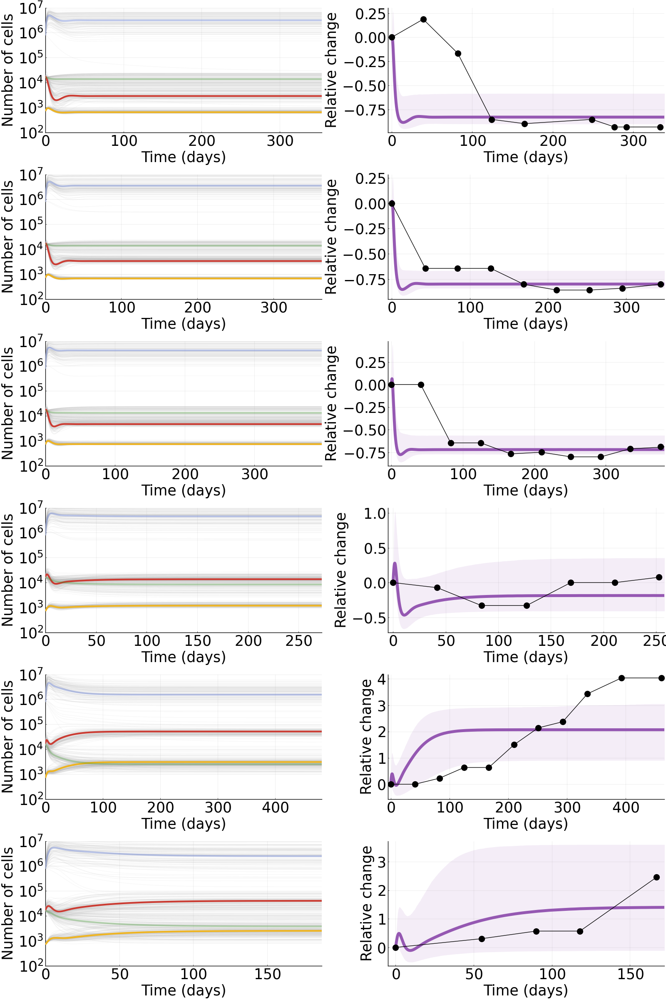

In [45]:
plot(a, b, c, d, e, f, g, h, iplot, j, kplot, l, layout = fig_layout, size =(1600,1200*2), plot_title ="", titlefontsize=25)

## Decision trees to classify tumor response (increasing or decreasing)

In [46]:
using DecisionTree
using JLD

In [47]:
chain_data = [chain_array1; chain_array2; chain_array5; chain_array6]

32000×4 Matrix{Float64}:
 9.05704e-6   0.00696654  0.208706   0.972022
 5.05385e-5   0.00299938  0.0631274  1.02907
 4.17606e-5   0.00204111  0.0765991  1.61614
 4.30383e-5   0.0023423   0.0777197  1.59448
 2.88218e-5   0.00406847  0.136577   1.0532
 2.88218e-5   0.00406847  0.136577   1.0532
 8.08587e-5   0.00971013  0.137204   1.29831
 0.000177412  0.0093754   0.0705688  1.66735
 9.5841e-5    0.00281842  0.0743     1.5242
 3.49498e-5   0.00456383  0.0367022  1.51874
 3.60928e-5   0.00561923  0.0498841  1.63735
 3.03869e-5   0.00404573  0.0862466  1.33323
 3.03869e-5   0.00404573  0.0862466  1.33323
 ⋮                                   
 6.58968e-5   0.00543881  0.488747   0.866011
 0.00014056   0.00949258  0.40538    0.585569
 0.000164923  0.00927361  0.305545   0.454811
 0.00017433   0.00943892  0.29716    0.488808
 0.00017433   0.00943892  0.29716    0.488808
 0.000138365  0.00800185  0.306338   0.434733
 0.000145169  0.00765769  0.32639    0.47735
 0.000172001  0.00841232  0.33692

In [48]:
chain_data

32000×4 Matrix{Float64}:
 9.05704e-6   0.00696654  0.208706   0.972022
 5.05385e-5   0.00299938  0.0631274  1.02907
 4.17606e-5   0.00204111  0.0765991  1.61614
 4.30383e-5   0.0023423   0.0777197  1.59448
 2.88218e-5   0.00406847  0.136577   1.0532
 2.88218e-5   0.00406847  0.136577   1.0532
 8.08587e-5   0.00971013  0.137204   1.29831
 0.000177412  0.0093754   0.0705688  1.66735
 9.5841e-5    0.00281842  0.0743     1.5242
 3.49498e-5   0.00456383  0.0367022  1.51874
 3.60928e-5   0.00561923  0.0498841  1.63735
 3.03869e-5   0.00404573  0.0862466  1.33323
 3.03869e-5   0.00404573  0.0862466  1.33323
 ⋮                                   
 6.58968e-5   0.00543881  0.488747   0.866011
 0.00014056   0.00949258  0.40538    0.585569
 0.000164923  0.00927361  0.305545   0.454811
 0.00017433   0.00943892  0.29716    0.488808
 0.00017433   0.00943892  0.29716    0.488808
 0.000138365  0.00800185  0.306338   0.434733
 0.000145169  0.00765769  0.32639    0.47735
 0.000172001  0.00841232  0.33692

In [133]:
only_two = [chain_data[:,3] chain_data[:,3]]

32000×2 Matrix{Float64}:
 0.208706   0.208706
 0.0631274  0.0631274
 0.0765991  0.0765991
 0.0777197  0.0777197
 0.136577   0.136577
 0.136577   0.136577
 0.137204   0.137204
 0.0705688  0.0705688
 0.0743     0.0743
 0.0367022  0.0367022
 0.0498841  0.0498841
 0.0862466  0.0862466
 0.0862466  0.0862466
 ⋮          
 0.488747   0.488747
 0.40538    0.40538
 0.305545   0.305545
 0.29716    0.29716
 0.29716    0.29716
 0.306338   0.306338
 0.32639    0.32639
 0.336923   0.336923
 0.336923   0.336923
 0.305648   0.305648
 0.325758   0.325758
 0.325758   0.325758

In [134]:
chain_classification = zeros(String,length(chain_data[:,1]))
for i = 1:16000
    chain_classification[i] = "decreasing"
end
for i = 16001:32000
    chain_classification[i] = "increasing"
end

In [135]:
#run decision tree on parameters from MCMC posteriors
features = float.(only_two)
labels   = string.(chain_classification)

32000-element Vector{String}:
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 "decreasing"
 ⋮
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"
 "increasing"

In [136]:
# train depth-truncated classifier
model = DecisionTreeClassifier(max_depth=3)

DecisionTreeClassifier
max_depth:                3
min_samples_leaf:         1
min_samples_split:        2
min_purity_increase:      0.0
pruning_purity_threshold: 1.0
n_subfeatures:            0
classes:                  nothing
root:                     nothing

In [137]:
#fit model
fit!(model, features, labels)

DecisionTreeClassifier
max_depth:                3
min_samples_leaf:         1
min_samples_split:        2
min_purity_increase:      0.0
pruning_purity_threshold: 1.0
n_subfeatures:            0
classes:                  ["decreasing", "increasing"]
root:                     Decision Tree
Leaves: 8
Depth:  3

In [138]:
#print tree
print_tree(model, 3)

Feature 1, Threshold 0.25607199556425264
L-> Feature 1, Threshold 0.1520143577826
    L-> Feature 2, Threshold 0.03005502357672652
        L-> increasing : 579/922
        R-> decreasing : 10049/12656
    R-> Feature 2, Threshold 0.2093504023174283
        L-> decreasing : 2824/4678
        R-> increasing : 1748/3116
R-> Feature 2, Threshold 0.3745952954575058
    L-> Feature 1, Threshold 0.32126885441768405
        L-> increasing : 2267/3162
        R-> increasing : 1690/1985
    R-> Feature 1, Threshold 0.4582223023810267
        L-> increasing : 2139/2306
        R-> increasing : 3116/3175


In [139]:
#apply model
DecisionTree.predict(model, [2.30843e-5, 0.74183])

"decreasing"

In [140]:
predict_proba(model, [2.30843e-5, 0.74183])

2-element Vector{Float64}:
 0.7940107458912768
 0.20598925410872312

In [141]:
println(get_classes(model)) 

["decreasing", "increasing"]


In [142]:
#run n-fold cross validation over 3 CV folds
using ScikitLearn.CrossValidation: cross_val_score
accuracy = cross_val_score(model, features, labels, cv=3)

3-element Vector{Float64}:
 0.7257217847769029
 0.7546409150571911
 0.7706731670729421

# Figure S1

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*(histC_MDSC^2)/(γ₁+((histC_MDSC^2))) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*(T^2)/(γ₁+(T^2)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
h(1,0)

4-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^5.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [6]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [7]:
#solve with τ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 722-element Vector{Float64}:
   0.0
   0.06025694466070223
   0.2658735340367194
   0.6178691455041165
   1.0821056700142218
   1.684132248477316
   2.431789722505264
   3.345803179572166
   4.4463537743192525
   5.7652628831315
   7.347382722665335
   9.262311206831868
  11.6204904738612
   ⋮
 110.0637247392478
 110.4216240313014
 111.22361555134928
 113.74364161504869
 117.40489592066612
 122.67728967061987
 129.8171764288081
 139.84323931486506
 154.16597636564444
 176.96004011480886
 220.80192574436535
 365.0
u: 722-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684658032, 500.0000006292047, 228758.1699344698, 0.0015506139572864614]
 [1.23716585838533, 500.0000032367199, 228758.16993097347, 0.00739248575607592]
 [1.6258306204828294, 500.00000997185526, 228758.16991088056, 0.019676616551612174]
 [2.2977557316866912, 500.00002611676643, 228758.16983954224, 0.0414248689306548]


## Panel B

In [8]:
#solve with τ = 10
τ = 10.0
lags = [τ]
prob_panel_b = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_b = solve(prob_panel_b,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 3898-element Vector{Float64}:
   0.0
   0.06025694466070223
   0.2658735340367194
   0.6178691455041165
   1.0821056700142218
   1.684132248477316
   2.431789722505264
   3.345803179572166
   4.446353949842681
   5.765263792396268
   7.347388282819627
   9.262345421296072
  10.0
   ⋮
 364.2499280772412
 364.3199743055305
 364.3900205403143
 364.4600667723148
 364.5301130015319
 364.60015923724353
 364.6702054701718
 364.7402517003167
 364.81029793695615
 364.8803441708122
 364.9503904018849
 365.0
u: 3898-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846580315, 500.0000005989531, 228758.16993447533, 0.0015506139572865412]
 [1.2371658583851872, 500.00000258928304, 228758.1699314806, 0.00739248575611037]
 [1.6258306204768391, 500.00000581218035, 228758.1699180848, 0.01967661655289615]
 [2.2977557315957986, 500.0000097301974, 228758.1698858381, 0.04142486894770254]
 [3.5157558

## Panel C

In [9]:
#solve with τ = 50
τ = 50.0
lags = [τ]
prob_panel_c = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_c = solve(prob_panel_c,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2235-element Vector{Float64}:
   0.0
   0.06025694466070223
   0.2658735340367194
   0.6178691455041165
   1.0821056700142218
   1.684132248477316
   2.431789722505264
   3.345803179572166
   4.446353949842681
   5.765263792396268
   7.347388282819627
   9.262345421296072
  11.620699037475699
   ⋮
 364.2533521481295
 364.3233983793051
 364.3934446169753
 364.46349084722306
 364.53353707468744
 364.6035833086464
 364.673629539822
 364.7436757682142
 364.81372200310096
 364.8837682444823
 364.9538144784413
 365.0
u: 2235-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846580315, 500.0000005989531, 228758.16993447533, 0.0015506139572865412]
 [1.2371658583851872, 500.00000258928304, 228758.1699314806, 0.00739248575611037]
 [1.6258306204768391, 500.00000581218035, 228758.1699180848, 0.01967661655289615]
 [2.2977557315957986, 500.0000097301974, 228758.1698858381, 0.0414248689477025

## Panel D

In [10]:
#solve with τ = 365
τ = 365.0
lags = [τ]
prob_panel_d = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_d = solve(prob_panel_d,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 33-element Vector{Float64}:
   0.0
   0.06025694466070223
   0.2658735340367194
   0.6178691455041165
   1.0821056700142218
   1.684132248477316
   2.431789722505264
   3.345803179572166
   4.446353949842681
   5.765263792396268
   7.347388282819627
   9.262345421296072
  11.620699037475699
   ⋮
  78.9212740090794
  93.5987642659628
 112.08351219307342
 133.4185162715557
 159.42522038902462
 191.65085519332152
 234.50399781780703
 290.0328793558641
 321.4569185324327
 338.4009479271708
 353.95524537181416
 365.0
u: 33-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846580315, 500.0000005989531, 228758.16993447533, 0.0015506139572865412]
 [1.2371658583851872, 500.00000258928304, 228758.1699314806, 0.00739248575611037]
 [1.6258306204768391, 500.00000581218035, 228758.1699180848, 0.01967661655289615]
 [2.2977557315957986, 500.0000097301974, 228758.1698858381, 0.04142486894770254

## Plot

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


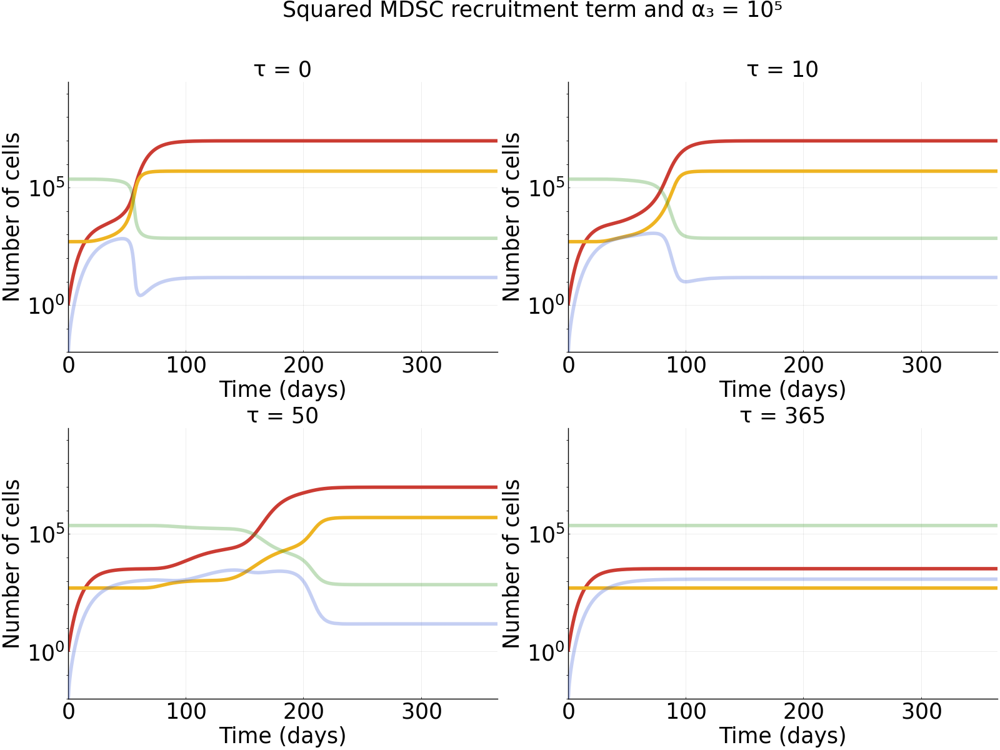

In [11]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^9.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^9.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^9.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
d = plot(sol_panel_d, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^9.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Squared MDSC recruitment term and α₃ = 10⁵", font = "Ariel",titlefontsize=25)

# Figure S2

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_CTL = h(p, t-τ₁; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*histC_CTL*NK + α₇*(histC_CTL^2)/(γ₃+(histC_CTL^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
h(1,0)

4-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [6]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [7]:
#solve with τ₁ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 445-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658731855330636
   0.6178678412300449
   1.08210261861819
   1.684126310943165
   2.4317786018601573
   3.34578128252542
   4.446307229515896
   5.765151525342025
   7.3470861647998404
   9.261456882988949
  11.618070929491504
   ⋮
 187.9672031342375
 190.03999794557305
 192.9080599208194
 196.63918381898029
 201.59464423824605
 208.01413758737382
 216.52337407060975
 227.97513152798126
 244.3682518224029
 270.40390772927594
 323.1263863026601
 365.0
u: 445-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846703614, 500.0006138318529, 228758.1697666647, 0.0015506139550194307]
 [1.2371655191044955, 500.00288952088306, 228758.16653464, 0.00739247487097743]
 [1.625829025487545, 500.0075401967587, 228758.15023991073, 0.01967656172997377]
 [2.2977508055193923, 500.01551776993205, 228758.10325701066, 0.041424678823349784

## Panel B

In [8]:
#solve with τ₁ = 10
τ₁ = 10.0
lags = [τ₁]
prob_panel_b = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_b = solve(prob_panel_b,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2936-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.34387530399834476
   0.8162080707766852
   1.39680472104866
   2.1424530048189543
   3.048026729154431
   4.147844755731661
   5.465234904176723
   7.045487830524393
   8.949496252167323
  10.0
  12.076715764344616
   ⋮
 364.2782737367034
 364.3501591887129
 364.4220446473875
 364.4939301032056
 364.5658155561673
 364.6377010062725
 364.7095864630428
 364.7814719169566
 364.853357368014
 364.9252428257364
 364.9971282758416
 365.0
u: 2936-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670448, 500.0006138318529, 228758.1697666647, 0.0015130765074084015]
 [1.3154713530078024, 500.00383243125583, 228758.16416015383, 0.008549758038663226]
 [1.888481397848511, 500.01066003257654, 228758.13411577686, 0.019962851943370715]
 [2.8790345515189877, 500.0224464962973, 228758.05068981988, 0.03348464757719417]
 [4.7793851

## Panel C

In [9]:
#solve with τ₁ = 50
τ₁ = 50.0
lags = [τ₁]
prob_panel_c = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_c = solve(prob_panel_c,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2936-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.34387530399834476
   0.8162080707766852
   1.39680472104866
   2.1424530048189543
   3.048026729154431
   4.147844755731661
   5.465234904176723
   7.045487830524393
   8.949496252167323
  11.275653947832534
  14.188429188476487
   ⋮
 364.26996821895887
 364.34185367369366
 364.41373912557196
 364.4856245841154
 364.55751003504156
 364.6293954926328
 364.7012809473676
 364.7731663992459
 364.8450518577893
 364.91693731347624
 364.9888227615459
 365.0
u: 2936-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670448, 500.0006138318529, 228758.1697666647, 0.0015130765074084015]
 [1.3154713530078024, 500.00383243125583, 228758.16416015383, 0.008549758038663226]
 [1.888481397848511, 500.01066003257654, 228758.13411577686, 0.019962851943370715]
 [2.8790345515189877, 500.0224464962973, 228758.05068981988, 0.0334846475

## Panel D

In [10]:
#solve with τ₁ = 365
τ₁ = 365.0
lags = [τ₁]
prob_panel_d = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_d = solve(prob_panel_d,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2930-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.34387530399834476
   0.8162080707766852
   1.39680472104866
   2.1424530048189543
   3.048026729154431
   4.147844755731661
   5.465234904176723
   7.045487830524393
   8.949496252167323
  11.275653947832534
  14.188429188476487
   ⋮
 364.2675800637767
 364.33946424994366
 364.4113484284935
 364.4832326041869
 364.55511677702395
 364.6270009612866
 364.6988851426929
 364.77076932124277
 364.8426535064576
 364.91453768405535
 364.986421868318
 365.0
u: 2930-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.049937684670448, 500.0006138318529, 228758.1697666647, 0.0015130765074084015]
 [1.3154713530078024, 500.00383243125583, 228758.16416015383, 0.008549758038663226]
 [1.888481397848511, 500.01066003257654, 228758.13411577686, 0.019962851943370715]
 [2.8790345515189877, 500.0224464962973, 228758.05068981988, 0.033484647577

## Plot

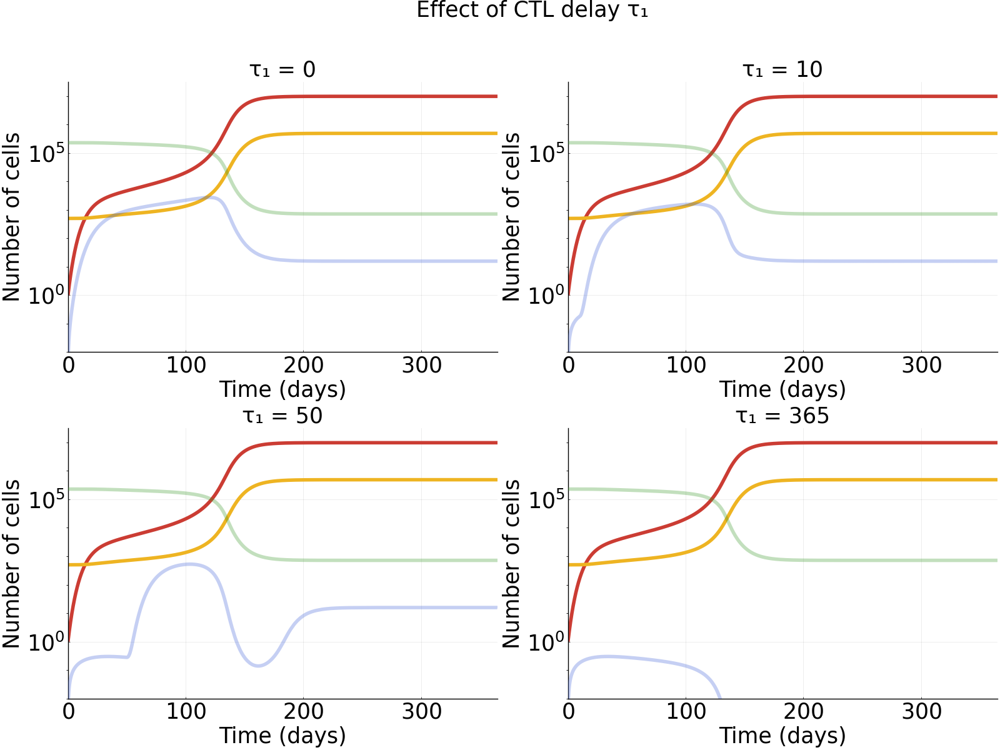

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [11]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ₁ = 0",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ₁ = 10",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ₁ = 50",titlefontsize=25)
d = plot(sol_panel_d, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ₁ = 365",titlefontsize=25)
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Effect of CTL delay τ₁", font = "Ariel",titlefontsize=25)

# Figure S3

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
h(1,0)

4-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^(10.0) #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

In [6]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [7]:
#solve with τ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg,maxiters=10^8)

retcode: Success
Interpolation: automatic order switching interpolation
t: 12669-element Vector{Float64}:
   0.0
   0.05606862553592335
   0.19210910005908258
   0.39442156460128586
   0.6499733048089819
   0.9742863636220407
   1.3643201268767493
   1.8259790070653756
   2.360133391811714
   2.970569792267853
   3.660841039572033
   4.436487200082409
   5.304788810633516
   ⋮
  69.13791695484987
  71.93143570776022
  75.27530843648375
  79.34982546499378
  84.40066516968024
  90.7620662083899
  98.92429694422502
 109.72777957674869
 124.86048324106376
 148.38681440697155
 193.97556216261168
 365.0
u: 12669-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.087602350509294, 500.0005817025114, 228758.16978740875, 0.001469024199431083]
 [1.3308007982474697, 500.0021845396089, 228758.16810232657, 0.0055625144985201784]
 [1.7875815487184266, 500.0051717211862, 228758.16147515515, 0.013315904970077272]
 [2.573240546685266, 500.01029930558394, 228758.14398003617, 0.02

## Panel B

In [8]:
#solve with τ = 10
τ = 10.0
lags = [τ]
prob_panel_b = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_b = solve(prob_panel_b,alg,maxiters=10^8)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2116899-element Vector{Float64}:
   0.0
   0.05606862553592619
   0.19210914377948923
   0.3944217131919764
   0.6499736072452473
   0.9742869158143604
   1.3643211658300547
   1.825981056437748
   2.3601375926145307
   2.970579316233329
   3.660864440465056
   4.43654905348666
   5.304962728501125
   ⋮
 364.9985765474456
 364.99871682437254
 364.9988571013124
 364.9989973782467
 364.9991376551662
 364.99927793208934
 364.9994182090255
 364.99955848595613
 364.99969876288117
 364.99983903980063
 364.9999793167331
 365.0
u: 2116899-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0876023505090806, 500.00055755428247, 228758.1697915116, 0.0014690241994869033]
 [1.3308008839339767, 500.0018846536733, 228758.16827408853, 0.00556251595432272]
 [1.787581931284792, 500.0037926598673, 228758.16305646757, 0.013315911704818276]
 [2.5732416313421087, 500.0060949966991, 228758.1516628603, 0.0268

## Panel C

In [9]:
#solve with τ = 50
τ = 50.0
lags = [τ]
prob_panel_c = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_c = solve(prob_panel_c,alg,maxiters=10^8)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 1503151-element Vector{Float64}:
   0.0
   0.05606862553592619
   0.19210914377948923
   0.3944217131919764
   0.6499736072452473
   0.9742869158143604
   1.3643211658300547
   1.825981056437748
   2.3601375926145307
   2.970579316233329
   3.660864440465056
   4.43654905348666
   5.304962728501125
   ⋮
 364.99848220377265
 364.9986224807006
 364.99876275764154
 364.9989030345676
 364.9990433114881
 364.9991835884216
 364.99932386534954
 364.9994641422719
 364.9996044192073
 364.9997446961278
 364.9998849730613
 365.0
u: 1503151-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0876023505090806, 500.00055755428247, 228758.1697915116, 0.0014690241994869033]
 [1.3308008839339767, 500.0018846536733, 228758.16827408853, 0.00556251595432272]
 [1.787581931284792, 500.0037926598673, 228758.16305646757, 0.013315911704818276]
 [2.5732416313421087, 500.0060949966991, 228758.1516628603, 0.026842

## Panel D

In [10]:
#solve with τ = 365
τ = 365.0
lags = [τ]
prob_panel_d = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_d = solve(prob_panel_d,alg,maxiters=10^8)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 43-element Vector{Float64}:
   0.0
   0.05606862553592619
   0.19210914377948923
   0.3944217131919764
   0.6499736072452473
   0.9742869158143604
   1.3643211658300547
   1.825981056437748
   2.3601375926145307
   2.970579316233329
   3.660864440465056
   4.43654905348666
   5.304962728501125
   ⋮
 106.80288083899316
 124.07757478773966
 145.27479798959314
 172.21610204568194
 204.8973164340589
 244.91818968230848
 284.4671789720578
 309.4756784442318
 326.06186305361734
 341.65010496616435
 357.70954601843124
 365.0
u: 43-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0876023505090806, 500.00055755428247, 228758.1697915116, 0.0014690241994869033]
 [1.3308008839339767, 500.0018846536733, 228758.16827408853, 0.00556251595432272]
 [1.787581931284792, 500.0037926598673, 228758.16305646757, 0.013315911704818276]
 [2.5732416313421087, 500.0060949966991, 228758.1516628603, 0.02684283276

## Plot

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


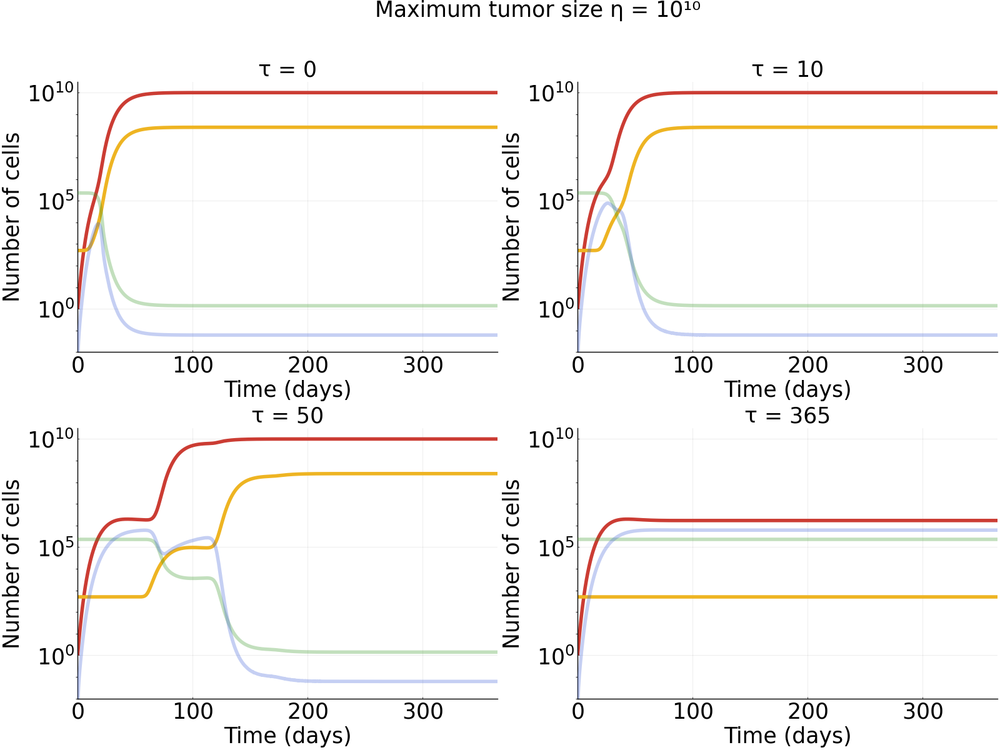

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [11]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^10.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^10.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^10.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
d = plot(sol_panel_d, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^10.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="Maximum tumor size η = 10¹⁰", font = "Ariel",titlefontsize=25)

# Figure S5

In [1]:
using Catalyst
using DifferentialEquations
using ModelingToolkit
using Plots; pyplot()
using Statistics
using ParameterizedFunctions
using DiffEqJump
using DelimitedFiles
using CSV
using DataFrames
using Random
logocolors = Colors.JULIA_LOGO_COLORS

(red = RGB{N0f8}(0.796,0.235,0.2), green = RGB{N0f8}(0.22,0.596,0.149), blue = RGB{N0f8}(0.251,0.388,0.847), purple = RGB{N0f8}(0.584,0.345,0.698))

In [2]:
# model definition 
system = @reaction_network begin
  α₁*T*log(η/T),  0 --> T
  α₂, 0 --> MDSC
  β₁*NK, T --> 0
  β₂*CTL, T --> 0
  ζ₁, T --> 0
  α₃*T/(γ₁+(T)), 0 --> MDSC
  ζ₂, MDSC --> 0
  α₄, 0 --> NK
  α₅*(T^2)/(γ₂+(T^2)), 0 --> NK
  β₃*MDSC, NK --> 0
  ζ₃, NK --> 0
  α₆*T*NK, 0 --> CTL
  α₇*(T^2)/(γ₃+(T^2)), 0 --> CTL
  β₄*MDSC, CTL --> 0
  ζ₄, CTL --> 0
end α₂ α₃ ζ₂ α₁ η β₁ β₂ ζ₁ α₄ α₅ β₃ ζ₃ α₆ α₇ β₄ ζ₄ γ₁ γ₂ γ₃

Model ##ReactionSystem#257 with 15 equations
States (4):
  T(t)
  MDSC(t)
  NK(t)
  CTL(t)
Parameters (19):
  α₂
  α₃
  ζ₂
  α₁
  η
  β₁
⋮

In [3]:
fullsystem = convert(ODESystem, system)

Model ##ReactionSystem#257 with 4 equations
States (4):
  T(t)
  MDSC(t)
  NK(t)
  CTL(t)
Parameters (19):
  α₂
  α₃
  ζ₂
  α₁
  η
  β₁
⋮

In [4]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
      1.0
    500.0
 228758.1699346405
      0.0

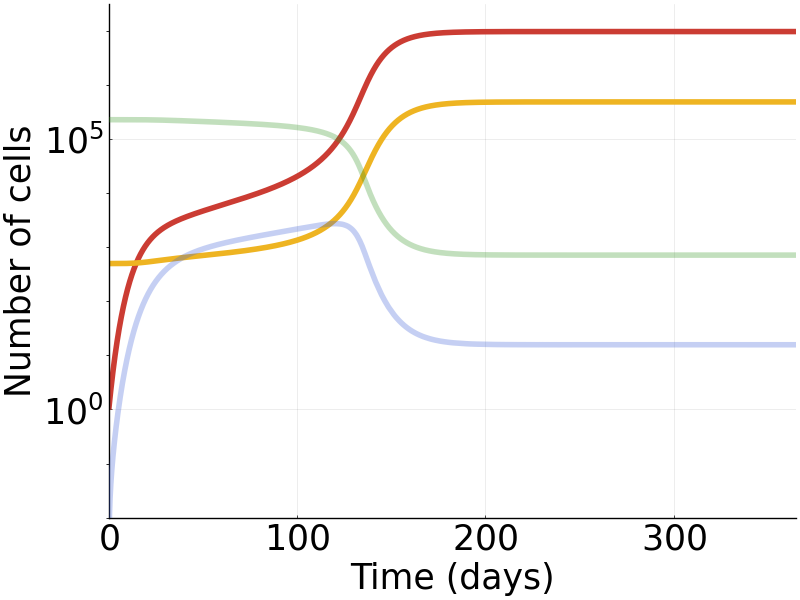

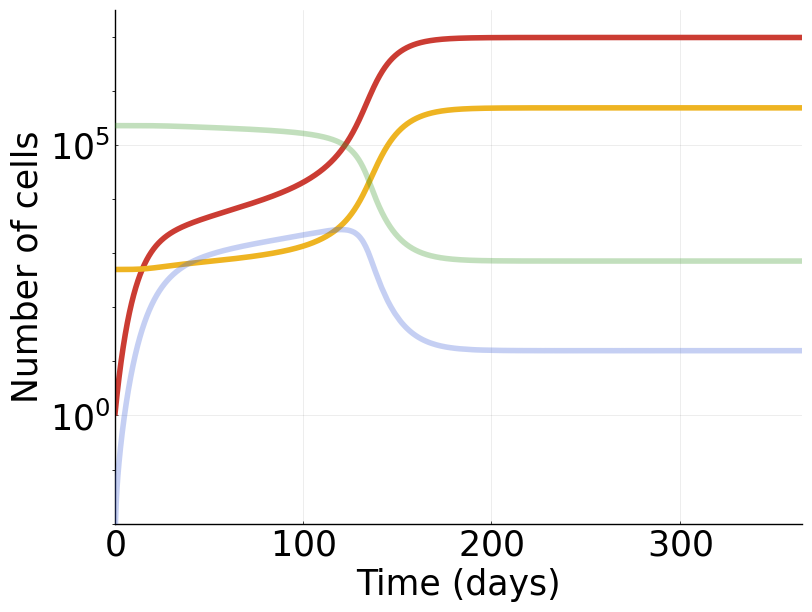

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 2929-element Vector{Float64}:
   0.0
   0.060256944660698405
   0.2658731855330636
   0.6178678412300449
   1.08210261861819
   1.684126310943165
   2.4317786018601573
   3.34578128252542
   4.446307229515896
   5.765151525342025
   7.3470861647998404
   9.261456882988949
  11.618070929491504
   ⋮
 364.2352349769922
 364.3071204329562
 364.3790058955853
 364.4508913553579
 364.52277680751325
 364.5946622568121
 364.6665477127761
 364.7384331754052
 364.8103186351778
 364.8822040920939
 364.95408954615357
 365.0
u: 2929-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [1.0499376846703614, 500.0006138318529, 228758.1697666647, 0.001550613955019431]
 [1.2371655191044955, 500.00288952088306, 228758.16653464, 0.007392474870977427]
 [1.625829025487545, 500.0075401967587, 228758.15023991073, 0.01967656172997376]
 [2.2977508055193923, 500.01551776993205, 228758.10325701066, 0.0414246788233498]


In [5]:
# deterministic simulation of system
op    = ODEProblem(system, u0, tspan, p)
sol   = solve(op, Tsit5()) 
plot2 = plot(sol, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

display(plot2)
sol

In [6]:
#define conditions for simulation to end
function condition(u,t,integrator) 
  u[1] <= 0 
end
floor_event = DiscreteCallback(condition, terminate!)

DiscreteCallback{typeof(condition), typeof(terminate!), typeof(DiffEqBase.INITIALIZE_DEFAULT), typeof(DiffEqBase.FINALIZE_DEFAULT)}(condition, SciMLBase.terminate!, DiffEqBase.INITIALIZE_DEFAULT, DiffEqBase.FINALIZE_DEFAULT, Bool[1, 1])

# Panel A

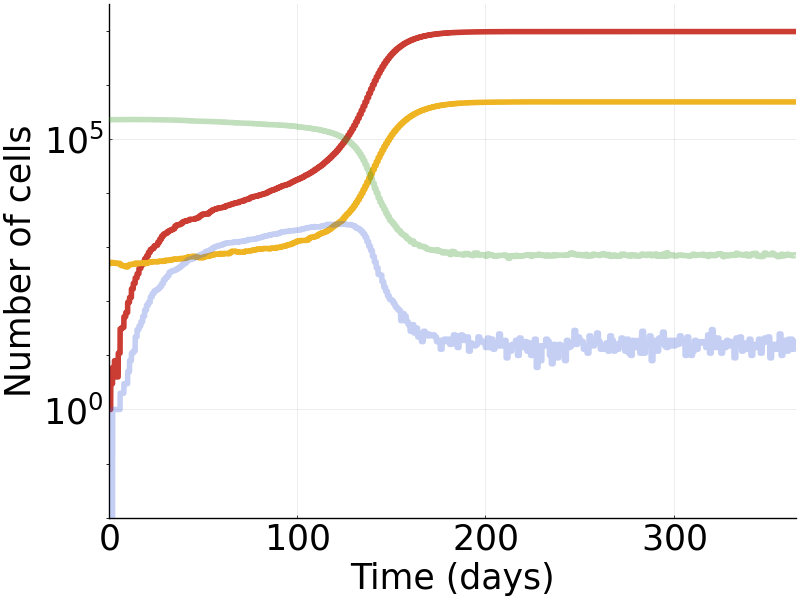

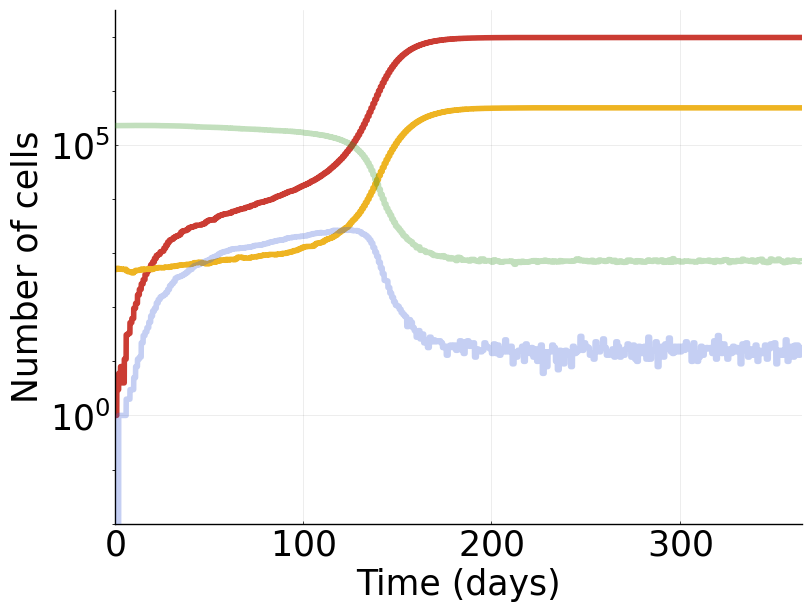

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


retcode: Default
Interpolation: Piecewise constant interpolation
t: 366-element Vector{Float64}:
   0.0
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
  10.0
  11.0
  12.0
   ⋮
 354.0
 355.0
 356.0
 357.0
 358.0
 359.0
 360.0
 361.0
 362.0
 363.0
 364.0
 365.0
u: 366-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [3.0, 525.0, 228734.1699346405, 0.0]
 [6.0, 513.0, 228512.1699346405, 1.0]
 [8.0, 508.0, 228586.1699346405, 1.0]
 [4.0, 502.0, 228423.1699346405, 1.0]
 [11.0, 505.0, 228620.1699346405, 1.0]
 [31.0, 472.0, 228689.1699346405, 2.0]
 [33.0, 454.0, 229092.1699346405, 2.0]
 [52.0, 452.0, 229596.1699346405, 3.0]
 [62.0, 432.0, 229832.1699346405, 3.0]
 [96.0, 460.0, 230319.1699346405, 5.0]
 [118.0, 482.0, 230543.1699346405, 8.0]
 [170.0, 482.0, 230679.1699346405, 11.0]
 ⋮
 [9.752449e6, 487974.0, 712.169934640493, 16.0]
 [9.75248e6, 487980.0, 670.169934640493, 13.0]
 [9.752752e6, 487866.0, 685.169934640493, 25.0]
 [9.752697e6, 488129.0, 744.1699

In [7]:
# stochastic simulation of system - successful tumor
Random.seed!(1234)

dprob = DiscreteProblem(system, u0, tspan, p)
jprob = JumpProblem(system, dprob, Direct(), save_positions=(false,false)) 
jsol = solve(jprob, SSAStepper(), saveat=1.0, callback=floor_event)
plot1 = plot(jsol, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

display(plot1)

jsol

# Panel B

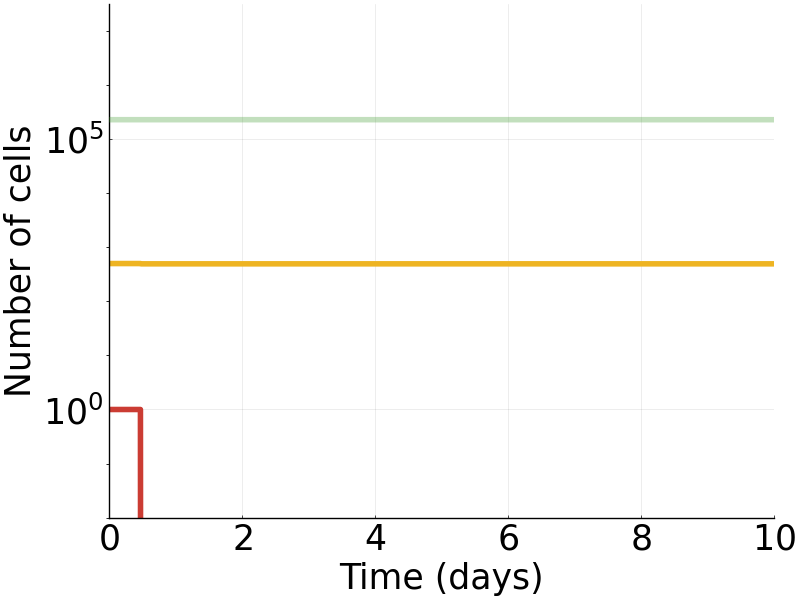

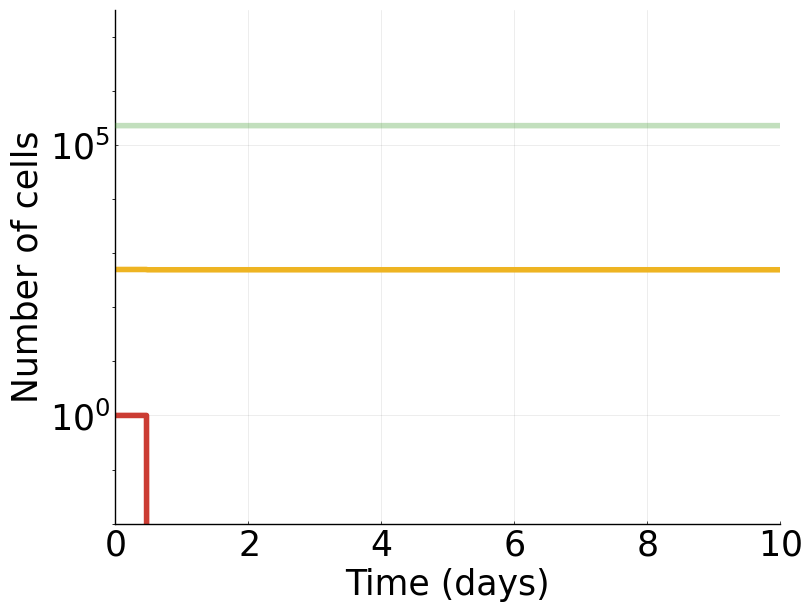

┌ Warning: Invalid negative or zero value 0.0 found at series index 50 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


retcode: Terminated
Interpolation: Piecewise constant interpolation
t: 368-element Vector{Float64}:
   0.0
   0.4781712957391987
   0.4781712957391987
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
  10.0
   ⋮
 354.0
 355.0
 356.0
 357.0
 358.0
 359.0
 360.0
 361.0
 362.0
 363.0
 364.0
 365.0
u: 368-element Vector{Vector{Float64}}:
 [1.0, 500.0, 228758.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 ⋮
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 [0.0, 494.0, 228612.1699346405, 0.0]
 

In [8]:
# stochastic simulation of system - unsuccessful tumor

Random.seed!(1240)

dprob = DiscreteProblem(system, u0, tspan, p)
jprob = JumpProblem(system, dprob, Direct(), save_positions=(false,false)) 
jsol = solve(jprob, SSAStepper(), saveat=1.0, callback=floor_event)
plot1 = plot(jsol, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", xlims = (0.0,10.0), ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "",titlefontsize=25)

display(plot1)

jsol

In [9]:
#parameters
α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells

1 / (α₁*1.0*log(η/1.0) / (β₁*228758.1699346405))

0.49674205446450365

In [10]:
df = DataFrame(CSV.File("gillespie.csv"))
list = Matrix(df)
list2 = zeros(length(list))
for i = 1:length(list)
    list2[i] = mean(list[1:i])
end
vector = LinRange(1, length(list2), length(list2)) 

25030-element LinRange{Float64}:
 1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,…,25027.0,25028.0,25029.0,25030.0

# Panel C

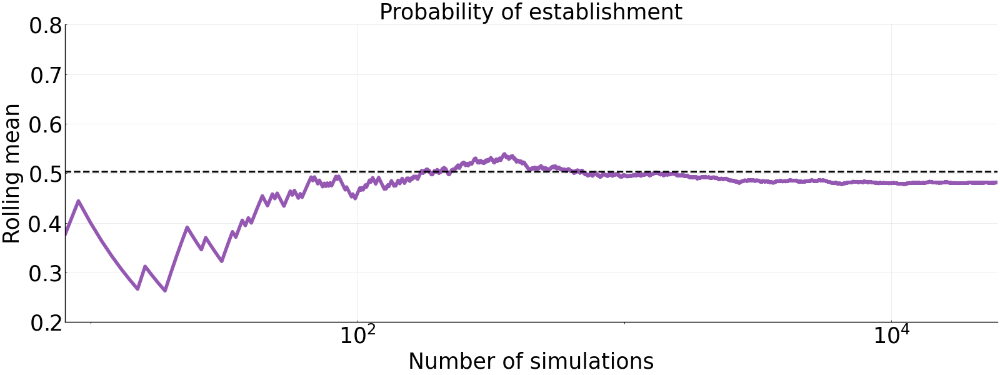

┌ Warning: Indices Base.OneTo(1) of attribute `seriesalpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:132
┌ Warning: Indices Base.OneTo(1) of attribute `linealpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:132
┌ Warning: Indices Base.OneTo(1) of attribute `fillalpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:132
┌ Warning: Indices Base.OneTo(1) of attribute `markeralpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:132
┌ Warning: Indices Base.OneTo(1) of attribute `markerstrokealpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:132
┌ Warning: Indices Base.OneTo(1) of attribute `seriesalpha` does not match data indices 1:25030.
└ @ Plots /Users/jessekreger/.julia/packages/P

In [11]:
#plot
plot()

success = 1 - (1 / (α₁*log(η) / (β₁*(ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃))-ζ₁)))

plot!(vector, list2, xlims = (8, 25000), ylims = (0.2,0.8), xaxis = :log, lw = 4, size =(1600,600), font = "Ariel", color = logocolors.purple, alpha = [1], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Number of simulations",xguidefontsize=25,ylabel="Rolling mean",yguidefontsize=25,title = "Probability of establishment",titlefontsize=25)
plot!(vector, [success], lw = 2, linestyle = :dash, size =(1600,600), font = "Ariel", color = "Black", alpha = [1], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Number of simulations",xguidefontsize=25,ylabel="Rolling mean",yguidefontsize=25,title = "Probability of establishment",titlefontsize=25)

# Figure S10

In [1]:
using Plots; pyplot()

Plots.PyPlotBackend()

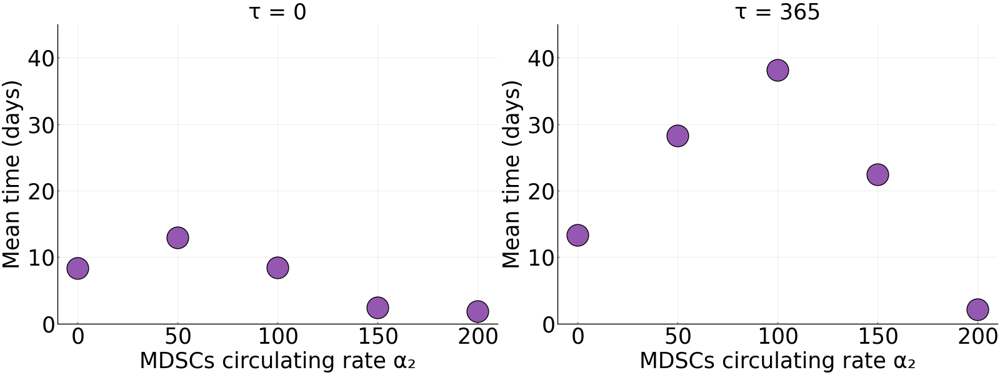

In [2]:
#time to extinction plot
l = @layout [a b]
delays = [0,0.5,1,2,10,50,100,365]
alpha1 = [0,50,100,150,200]
times0 = [8.35639,12.9067,8.4226,2.43575,1.8359]
times365 = [13.3427,28.2929,38.1711,22.4496,2.14636]

logocolors = Colors.JULIA_LOGO_COLORS

p1 = plot(alpha1,times0,grid=true,color=logocolors.purple,align="center",title = "τ = 0",xlabel = "MDSCs circulating rate α₂",ylabel = "Mean time (days)",legend = false,seriestype =:scatter,markersize = 25,font = "Ariel",xlims = (-10,210),ylims = (0,45))
p2 = plot(alpha1,times365,grid=true,color=logocolors.purple,align="center",title = "τ = 365",xlabel = "MDSCs circulating rate α₂",ylabel = "Mean time (days)",legend = false,seriestype =:scatter,markersize = 25,font = "Ariel",xlims = (-10,210),ylims = (0,45))
plot(p1,p2,layout = l,size =(1600,600),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),titlefont=font(25))

# Figure S16

In [1]:
using DifferentialEquations
using Plots; pyplot()

Plots.PyPlotBackend()

In [2]:
#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

dde_system (generic function with 1 method)

In [3]:
#define model without delay
function ode_system(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
   
# Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
 # MDSCs 
    du[2] = dMDSC = α₂ + α₃*T/(γ₁+(T)) - ζ₂*MDSC 
 # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
 # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_system (generic function with 1 method)

In [4]:
#define initial number of tumor cells for delay model
h(p, t; idxs=nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
h(1,0)

4-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0

In [5]:
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.0*(10.0^3.0) #1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
tspan = (0.0,365.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

4-element Vector{Float64}:
     1.0
   500.0
 16339.86928104575
     0.0

In [6]:
#set numerical solution algorithm
alg = MethodOfSteps(Tsit5())

MethodOfSteps{Tsit5, NLFunctional{Rational{Int64}, Rational{Int64}}, false}(Tsit5(), NLFunctional{Rational{Int64}, Rational{Int64}}(1//100, 1//5, 10))

## Panel A

In [7]:
#solve with τ = 0
prob_panel_a = ODEProblem(ode_system,u0,tspan,p)
sol_panel_a = solve(prob_panel_a,alg)

retcode: Success
Interpolation: automatic order switching interpolation
t: 110-element Vector{Float64}:
   0.0
   5.298307482686709e-5
   0.000582813823095538
   0.005881121305782246
   0.05005089882368517
   0.16342240136300892
   0.34246366438549913
   0.5702005192250106
   0.8639231562098033
   1.2196096978090651
   1.6436214971744567
   2.1361665255220093
   2.7006201756299535
   ⋮
 100.01691164500782
 103.43021074982298
 107.52087969462777
 112.519837917721
 118.74831953388643
 126.6638983473333
 136.99434724324772
 151.10314892769304
 172.02458562814027
 208.4811484254052
 306.7728797167067
 365.0
u: 110-element Vector{Vector{Float64}}:
 [1.0, 500.0, 16339.86928104575, 0.0]
 [1.000082371723138, 500.0000005298498, 16339.869281045741, 0.0017315411341717521]
 [1.0009064382027248, 500.00000583043953, 16339.869281044641, 0.01905444562980932]
 [1.0091821202522362, 500.0000590461544, 16339.86928093244, 0.19303494465898352]
 [1.0807072911244984, 500.00051789918933, 16339.869272679274, 1.

## Panel B

In [8]:
#solve with τ = 10
τ = 10.0
lags = [τ]
prob_panel_b = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_b = solve(prob_panel_b,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 3080-element Vector{Float64}:
   0.0
   5.298307482686709e-5
   0.000582813823095538
   0.005881121305782246
   0.05005148410930779
   0.16342367949697573
   0.3424655123724849
   0.5702028234695596
   0.8639261492658541
   1.2196134679373496
   1.6436263944989637
   2.1361732248343435
   2.700630353734227
   ⋮
 364.213096086035
 364.2849264921772
 364.3567568954651
 364.4285873054129
 364.5004177125065
 364.57224811674575
 364.64407852764504
 364.71590893569004
 364.78773933612365
 364.8595697384601
 364.93140013794226
 365.0
u: 3080-element Vector{Vector{Float64}}:
 [1.0, 500.0, 16339.86928104575, 0.0]
 [1.000082371723138, 500.00000052982796, 16339.869281045741, 0.0017315411341717521]
 [1.0009064382027248, 500.0000058277986, 16339.869281044641, 0.01905444562980933]
 [1.0091821202522362, 500.00005877663904, 16339.869280932784, 0.19303494465899235]
 [1.0807082695474652, 500.0004980180282, 16339.86927289463, 1

## Panel C

In [9]:
#solve with τ = 50
τ = 50.0
lags = [τ]
prob_panel_c = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_c = solve(prob_panel_c,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 123-element Vector{Float64}:
   0.0
   5.298307482686709e-5
   0.000582813823095538
   0.005881121305782246
   0.05005148410930779
   0.16342367949697573
   0.3424655123724849
   0.5702028234695596
   0.8639261492658541
   1.2196134679373496
   1.6436263944989637
   2.1361732248343435
   2.700630353734227
   ⋮
 355.83889977134857
 356.8787414272874
 357.87318951284004
 358.8317131145804
 359.7611000988764
 360.66616930115856
 361.5516328857115
 362.4212045109372
 363.2781727420805
 364.12528865164575
 364.96458552093344
 365.0
u: 123-element Vector{Vector{Float64}}:
 [1.0, 500.0, 16339.86928104575, 0.0]
 [1.000082371723138, 500.00000052982796, 16339.869281045741, 0.0017315411341717521]
 [1.0009064382027248, 500.0000058277986, 16339.869281044641, 0.01905444562980933]
 [1.0091821202522362, 500.00005877663904, 16339.869280932784, 0.19303494465899235]
 [1.0807082695474652, 500.0004980180282, 16339.86927289463, 1.

## Panel D

In [10]:
#solve with τ = 365
τ = 365.0
lags = [τ]
prob_panel_d = DDEProblem(dde_system,u0,h,tspan,p;constant_lags=lags)
sol_panel_d = solve(prob_panel_d,alg)

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 57-element Vector{Float64}:
   0.0
   5.298307482686709e-5
   0.000582813823095538
   0.005881121305782246
   0.05005148410930779
   0.16342367949697573
   0.3424655123724849
   0.5702028234695596
   0.8639261492658541
   1.2196134679373496
   1.6436263944989637
   2.1361732248343435
   2.700630353734227
   ⋮
 202.69847586667072
 218.63128118924817
 232.18345096587814
 248.25080238751585
 262.77818123138786
 276.9737481759972
 293.69725063580387
 308.36836834072324
 324.0851975094882
 339.44832650724817
 353.92995008558324
 365.0
u: 57-element Vector{Vector{Float64}}:
 [1.0, 500.0, 16339.86928104575, 0.0]
 [1.000082371723138, 500.00000052982796, 16339.869281045741, 0.0017315411341717521]
 [1.0009064382027248, 500.0000058277986, 16339.869281044641, 0.01905444562980933]
 [1.0091821202522362, 500.00005877663904, 16339.869280932784, 0.19303494465899235]
 [1.0807082695474652, 500.0004980180282, 16339.86927289463, 

## Plot

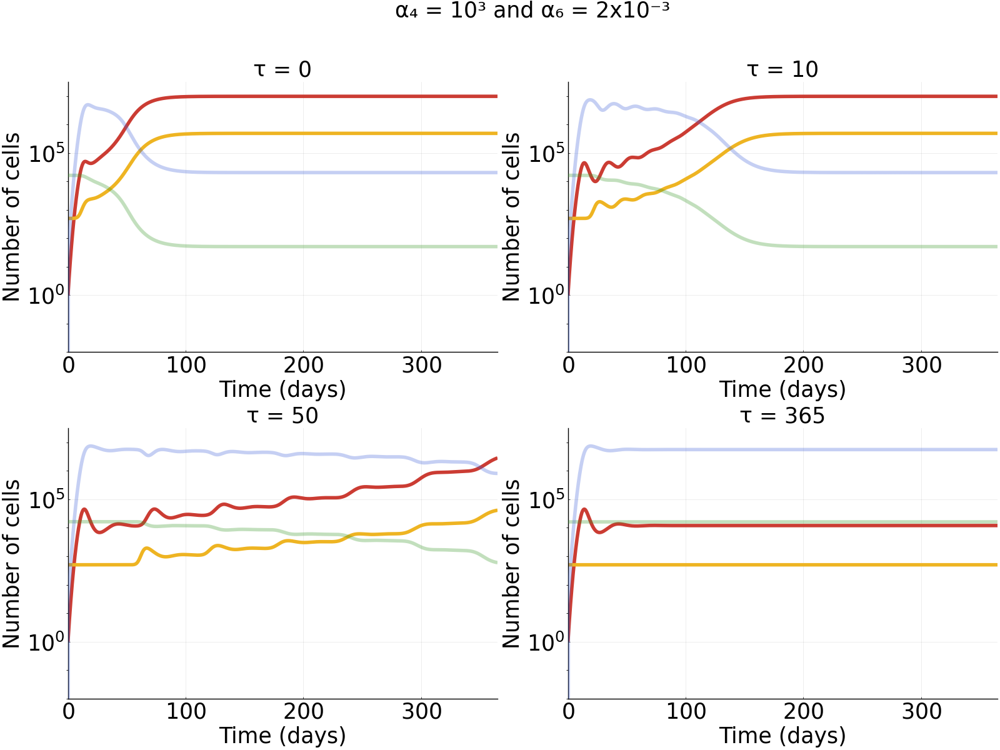

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots /Users/jessekreger/.julia/packages/Plots/Xv2qA/src/utils.jl:95


In [11]:
#plot results
l = @layout [a b; c d]
logocolors = Colors.JULIA_LOGO_COLORS
a = plot(sol_panel_a, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 0",titlefontsize=25)
b = plot(sol_panel_b, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 10",titlefontsize=25)
c = plot(sol_panel_c, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 50",titlefontsize=25)
d = plot(sol_panel_d, lw = 4, yaxis=:log,size =(1600/2,600), font = "Ariel", ylims = (0.01,10^7.5), color = [logocolors.red "goldenrod2" logocolors.green logocolors.blue], alpha = [1 1 0.3 0.3], legend = false, xtickfontsize=25,ytickfontsize=25,xlabel="Time (days)",xguidefontsize=25,ylabel="Number of cells",yguidefontsize=25,title = "τ = 365",titlefontsize=25)
plot(a, b, c, d, layout = l,size =(1600,1200),xtickfont=font(25),ytickfont=font(25),guidefont=font(25),legendfont=font(25),plot_title="α₄ = 10³ and α₆ = 2x10⁻³", font = "Ariel",titlefontsize=25)